# Шаг 0. Подготовка данных, Шаг 1. Baseline оценка

In [ ]:
# utils.py

import random
import numpy as np
import torch
import os

# Воспроизводимость экспериментов
def set_seed(seed: int = 33):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.benchmark = True

set_seed()

# Системный промпт для всех генераций
SYSTEM_PROMPT = """You are a helpful assistant that writes Python code.
Given a problem description, implement a function that solves it.
Return only the code. Avoid explanations, markdown formatting and test cases."""


# Форматирование промпта для Qwen
def format_prompt(prompt_text: str, system_prompt: str) -> str:
    messages = [
        {"role": "system", "content": system_prompt},
        {
            "role": "user",
            "content": f"Problem: {prompt_text}\n\nImplement the function in Python:",
        },
    ]
    return messages

https://huggingface.co/datasets/google-research-datasets/mbpp/viewer/sanitized?row=1

In [86]:
# prepare_dataset.py
# Загрузка датасета https://huggingface.co/datasets/google-research-datasets/mbpp/viewer/sanitized?row=1

from datasets import load_dataset

def get_train_val_data(train_size: int = 100, val_size: int = 30):
    set_seed()

    dataset = load_dataset("google-research-datasets/mbpp", "sanitized")
    train_dataset = dataset["train"]
    val_dataset = dataset["validation"]

    return train_dataset[:train_size], val_dataset[:val_size]

In [ ]:
# verifier.py

from typing import List
import re
import numpy as np
import sys
import os
import signal
from typing import List, Optional
from contextlib import contextmanager

class TimeoutException(Exception):
    pass

@contextmanager
def timeout_context(seconds: int = 5):
    """Контекстный менеджер для ограничения времени выполнения кода"""
    
    def timeout_handler(signum, frame):
        raise TimeoutException(f"Код выполнялся дольше {seconds} секунд")
    
    old_handler = signal.signal(signal.SIGALRM, timeout_handler)
    signal.alarm(seconds)
    
    try:
        yield
    finally:
        signal.alarm(0)
        signal.signal(signal.SIGALRM, old_handler)
        

def extract_code_block(text: str) -> str:
    """
    Извлечение кода из markdown, если модель написала с markdown
    """

    pattern = r"```(?:python)?\s*\n(.*?)```"
    match = re.search(pattern, text, re.DOTALL)
    if match:
        return match.group(1).strip()
    text = re.sub(r"</?answer>|</?think>", "", text)
    return text.strip()


def verify_solution(code: str, test_list: List[str], test_imports: str = "", timeout_per_test: int = 5) -> bool:
    """
    Проверяет code, сгенерированный моделью на тестах. Возвращает True если все тесты прошли, False иначе

    code: сгенерированный код функции
    test_list: список assert-выражений (строки)
    test_imports: необходимые импорты для тестов
    timeout_per_test: ограничение на время исполнения одного теста, чтобы бесконечные циклы не ломали инференс
    """

    code = extract_code_block(code)
    full_code = test_imports + "\n" + code + "\n"

    original_stdout = sys.stdout
    original_stderr = sys.stderr

    try:
        # временное перенаправление потоков вывода, иначе при инференсе все результаты проверки кода будут сыпаться в консоль
        sys.stdout = open(os.devnull, 'w')
        sys.stderr = open(os.devnull, 'w')
            
        namespace = {}

        # выполнение кода с таймаутом
        with timeout_context(timeout_per_test):
            exec(full_code, namespace)

            for test in test_list:
                if test.strip().startswith("assert "):
                    test_expr = test.strip()[7:].strip()
                else:
                    test_expr = test.strip()

                # каждый тест тоже с таймаутом
                with timeout_context(timeout_per_test):
                    result = eval(test_expr, namespace)
                    if not result:
                        return False
        return True

    except TimeoutException:
        print("Код > таймаут")
        return False 
    except Exception:
        return False 

    finally:
        sys.stdout.close()
        sys.stderr.close()
        sys.stdout = original_stdout
        sys.stderr = original_stderr


def pass_k(n: int, c: int, k: int) -> float:
    if n - c < k:
        return 1.0
    return 1.0 - np.prod(1.0 - k / np.arange(n - c + 1, n + 1))


def calc_pass_k(num_samples: List[int], num_correct: List[int], k: int) -> float:
    """
    Подсчет метрики по всему набору задач
    """

    pass_values = [pass_k(n, c, k) for n, c in zip(num_samples, num_correct)]
    return np.mean(pass_values)

In [62]:
!pip install -q "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
## baseline_evaluation.py

import unsloth
from unsloth import FastLanguageModel
from typing import List, Dict
import torch
import json
import numpy as np  
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer, GenerationConfig

import warnings
warnings.filterwarnings("ignore")

# from utils import set_seed, format_prompt, SYSTEM_PROMPT, pass_k
# from prepare_dataset import get_train_val_data
# from verifier import verify_solution

def evaluate_task(task: dict, model, tokenizer, config: dict, pass_k_values: list) -> Dict:
    """
    Генерирует n = config["num_samples"] версий для одного task, считает метрику pass@k
    Определяет, является ли пример Hard 
    """

    # Даем модели сразу верное название функции из тестов
    required_func_name = task["test_list"][0][7:].split("(")[0]
    prompt_text = task["prompt"] + f"Give the function a name like this: {required_func_name}."
    test_list = task["test_list"]
    test_imports = "\n".join(task["test_imports"])
    
    messages = format_prompt(prompt_text, SYSTEM_PROMPT)
    input_text = tokenizer.apply_chat_template(
        messages, tokenize=False, add_generation_prompt=True
    )
    
    inputs = tokenizer(input_text, return_tensors="pt").to(model.device)
    
    # Генерация num_samples версий
    outputs = model.generate(
        **inputs,
        max_new_tokens=config["max_new_tokens"],
        temperature=config["temperature"],
        top_k=config["top_k"],
        do_sample=True,
        num_return_sequences=config["num_samples"],
        pad_token_id=tokenizer.pad_token_id,
        eos_token_id=tokenizer.eos_token_id,
    )
    
    input_len = inputs["input_ids"].shape[1]
    generated_texts = [
        tokenizer.decode(out[input_len:], skip_special_tokens=True)
        for out in outputs
    ]
    
    correct_count = 0
    lengths = [] # сохранение длин генераций 
    
    for gen in generated_texts:
        lengths.append(len(tokenizer.encode(gen)))
        if verify_solution(gen, test_list, test_imports):
            correct_count += 1
    
    n = config["num_samples"]
    pass_k_dict = {k: pass_k(n, correct_count, k) for k in pass_k_values}
    
    return {
        "correct_count": correct_count,
        "total_samples": n,
        "is_hard": (correct_count == 0),
        "lengths": lengths,
        "pass_k_values": pass_k_dict,
        "avg_length": np.mean(lengths) if lengths else 0,
    }

# -----------------------------------

set_seed()
device = "cuda" if torch.cuda.is_available() else "cpu"

CONFIG = {
    "num_samples": 32, # сократим 32 вместо 128 из-за ресурсов :(
    "temperature": 1.0,
    "top_k": 50,
    "max_new_tokens": 128, # достаточно для генерации кода небольших функций на python 
    "model": "Qwen/Qwen2.5-0.5B-Instruct",
    "dtype": "float16" if torch.cuda.is_available() else "float32",
}
print(f"Запуск с параметрами: {CONFIG}")

PASS_K_VALUES = [1, 4, 8, 16, 32]

# Использование unsloth для ускорения инференса
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name=CONFIG["model"],
    max_seq_length=2048,
    dtype=torch.float16 if torch.cuda.is_available() else None,
    load_in_4bit=False,
)
FastLanguageModel.for_inference(model) 
print(model.device)

if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

"""
Проходим по примерам из train и val датасета, ищем Hard примеры
Сохраняем pass@k и др. данные для графиков
"""
train_data, val_data = get_train_val_data()

train_results = []
val_results = []
train_hard_idx = []
val_hard_idx = []

print("Начало baseline train оценки...")
for i in tqdm(range(len(train_data["prompt"]))):
    task = {
        "prompt": train_data["prompt"][i],
        "test_list": train_data["test_list"][i],
        "test_imports": train_data["test_imports"][i],
    }        
    result = evaluate_task(task, model, tokenizer, CONFIG, PASS_K_VALUES)
    result["task_id"] = i
    train_results.append(result)
    
    if result["is_hard"]:
        train_hard_idx.append(i)
        print(f"Найден hard idx (train): {i}")

print("Начало baseline val оценки...")
for i in tqdm(range(len(val_data["prompt"]))):
    task = {
        "prompt": val_data["prompt"][i],
        "test_list": val_data["test_list"][i],
        "test_imports": val_data["test_imports"][i],
    }
    result = evaluate_task(task, model, tokenizer, CONFIG, PASS_K_VALUES)
    result["task_id"] = i
    val_results.append(result)
    
    if result["is_hard"]:
        val_hard_idx.append(i)
        print(f"Найден hard idx (val): {i}")

hard_indices = {
    "train_hard_idx": train_hard_idx,
    "val_hard_idx": val_hard_idx,
    "train_hard_count": len(train_hard_idx),
    "val_hard_count": len(val_hard_idx),
    "train_total": len(train_results),
    "val_total": len(val_results),
}

with open("hard_indices.json", "w", encoding="utf-8") as f:
    json.dump(hard_indices, f, indent=2, ensure_ascii=False)
    print("hard_indices.json сохранен")

evaluation_results = {
    "train": train_results,
    "val": val_results,
    "config": CONFIG,
    "pass_k_values": PASS_K_VALUES,
}

with open("evaluation_results.json", "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2, ensure_ascii=False)
    print("evaluation_results.json сохранен")

Запуск с параметрами: {'num_samples': 32, 'temperature': 1.0, 'top_k': 50, 'max_new_tokens': 128, 'model': 'Qwen/Qwen2.5-0.5B-Instruct', 'dtype': 'float16'}
==((====))==  Unsloth 2026.3.3: Fast Qwen2 patching. Transformers: 5.2.0.
   \\   /|    Tesla T4. Num GPUs = 2. Max memory: 14.563 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.0+cu126. CUDA: 7.5. CUDA Toolkit: 12.6. Triton: 3.5.0
\        /    Bfloat16 = FALSE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


model.safetensors:   0%|          | 0.00/988M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/290 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/270 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/761 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/605 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/614 [00:00<?, ?B/s]

unsloth/Qwen2.5-0.5B-Instruct does not have a padding token! Will use pad_token = <|PAD_TOKEN|>.
cuda:0
Начало baseline train оценки...


  2%|▏         | 2/100 [00:10<08:44,  5.35s/it]

Найден hard idx (train): 1


  7%|▋         | 7/100 [00:37<08:11,  5.29s/it]

Найден hard idx (train): 6


  8%|▊         | 8/100 [00:42<08:06,  5.29s/it]

Найден hard idx (train): 7


 10%|█         | 10/100 [00:52<07:55,  5.29s/it]

Найден hard idx (train): 9


 11%|█         | 11/100 [00:58<07:49,  5.27s/it]

Найден hard idx (train): 10


 12%|█▏        | 12/100 [01:03<07:43,  5.27s/it]

Найден hard idx (train): 11


 14%|█▍        | 14/100 [01:13<07:32,  5.27s/it]

Найден hard idx (train): 13


 17%|█▋        | 17/100 [01:29<07:15,  5.24s/it]

Найден hard idx (train): 16


 18%|█▊        | 18/100 [01:34<07:11,  5.26s/it]

Найден hard idx (train): 17


 22%|██▏       | 22/100 [01:55<06:50,  5.27s/it]

Найден hard idx (train): 21


 23%|██▎       | 23/100 [02:01<06:44,  5.25s/it]

Найден hard idx (train): 22


 26%|██▌       | 26/100 [02:16<06:29,  5.26s/it]

Найден hard idx (train): 25


 27%|██▋       | 27/100 [02:22<06:23,  5.25s/it]

Найден hard idx (train): 26


 28%|██▊       | 28/100 [02:27<06:18,  5.25s/it]

Найден hard idx (train): 27


 29%|██▉       | 29/100 [02:32<06:12,  5.25s/it]

Найден hard idx (train): 28


 30%|███       | 30/100 [02:37<06:06,  5.24s/it]

Найден hard idx (train): 29


 31%|███       | 31/100 [02:43<06:01,  5.24s/it]

Найден hard idx (train): 30


 32%|███▏      | 32/100 [02:48<05:57,  5.25s/it]

Найден hard idx (train): 31


 34%|███▍      | 34/100 [02:58<05:46,  5.26s/it]

Найден hard idx (train): 33


 35%|███▌      | 35/100 [03:04<05:41,  5.25s/it]

Найден hard idx (train): 34


 39%|███▉      | 39/100 [03:25<05:25,  5.33s/it]

Найден hard idx (train): 38


 40%|████      | 40/100 [03:30<05:20,  5.34s/it]

Найден hard idx (train): 39


 41%|████      | 41/100 [03:36<05:14,  5.33s/it]

Enter a number (base^3):
 1
Enter a number (base^3):
 2
Enter a number (base^3):
 3
Enter a number (base^100):
 4
Enter a number (base^100):
 5
Enter a number (base^100):
 6
Enter a number (base^100):
 7
Enter a number (base^100):
 1
Enter a number (base^100):
 2
Enter a number (base^100):
 3
Enter a number (base^100):
 4
Enter a number (base^100):
 5
Enter a number (base^100):
 6
Enter a number (base^100):
 7
Enter a number (base^100):
 1
Enter a number (base^100):
 2
Enter a number (base^100):
 3
Enter a number (base^100):
 4
Enter a number (base^100):
 5
Enter a number (base^100):
 6
Enter a number (base^100):
 7
Enter a number (base^100):
 8
Enter a number (base^100):
 1
Enter a number (base^100):
 2
Enter a number (base^100):
 3
Enter a number (base^100):
 4
Enter a number (base^100):
 5
Enter a number (base^100):
 6
Enter a number (base^100):
 7
Enter a number (base^100):
 8
Enter a number (base^100):
 1
Enter a number (base^100):
 2
Enter a number (base^100):
 3
Enter a number (

 43%|████▎     | 43/100 [04:22<12:08, 12.77s/it]

Найден hard idx (train): 42


 50%|█████     | 50/100 [04:59<04:55,  5.91s/it]

Найден hard idx (train): 49


 51%|█████     | 51/100 [05:04<04:41,  5.74s/it]

Найден hard idx (train): 50


 52%|█████▏    | 52/100 [05:10<04:29,  5.62s/it]

Найден hard idx (train): 51


 54%|█████▍    | 54/100 [05:20<04:10,  5.44s/it]

Найден hard idx (train): 53


 55%|█████▌    | 55/100 [05:30<05:10,  6.90s/it]

Найден hard idx (train): 54


 58%|█████▊    | 58/100 [05:46<04:05,  5.84s/it]

 1
 2


 61%|██████    | 61/100 [06:14<04:44,  7.30s/it]

Найден hard idx (train): 60


 63%|██████▎   | 63/100 [06:25<03:52,  6.28s/it]

Найден hard idx (train): 62


 64%|██████▍   | 64/100 [06:30<03:35,  5.99s/it]

Найден hard idx (train): 63


 68%|██████▊   | 68/100 [06:52<02:58,  5.57s/it]

Найден hard idx (train): 67


 69%|██████▉   | 69/100 [06:57<02:50,  5.50s/it]

Найден hard idx (train): 68


 70%|███████   | 70/100 [07:03<02:43,  5.45s/it]

Найден hard idx (train): 69


 75%|███████▌  | 75/100 [07:29<02:12,  5.28s/it]

Найден hard idx (train): 74


 77%|███████▋  | 77/100 [07:39<02:00,  5.25s/it]

Найден hard idx (train): 76


 78%|███████▊  | 78/100 [07:45<01:55,  5.27s/it]

Найден hard idx (train): 77


 80%|████████  | 80/100 [07:55<01:45,  5.27s/it]

Найден hard idx (train): 79


 83%|████████▎ | 83/100 [08:11<01:29,  5.25s/it]

Найден hard idx (train): 82


 85%|████████▌ | 85/100 [08:21<01:18,  5.26s/it]

Найден hard idx (train): 84


 87%|████████▋ | 87/100 [08:32<01:08,  5.25s/it]

Найден hard idx (train): 86


 89%|████████▉ | 89/100 [08:42<00:57,  5.24s/it]

Найден hard idx (train): 88


 93%|█████████▎| 93/100 [09:03<00:36,  5.27s/it]

Найден hard idx (train): 92


 95%|█████████▌| 95/100 [09:14<00:26,  5.27s/it]

Найден hard idx (train): 94


 96%|█████████▌| 96/100 [09:19<00:21,  5.27s/it]

Найден hard idx (train): 95


 97%|█████████▋| 97/100 [09:25<00:15,  5.28s/it]

Найден hard idx (train): 96


 98%|█████████▊| 98/100 [09:30<00:10,  5.25s/it]

Найден hard idx (train): 97


100%|██████████| 100/100 [09:40<00:00,  5.81s/it]


Найден hard idx (train): 99
Начало baseline val оценки...


 10%|█         | 3/30 [00:15<02:21,  5.26s/it]

Найден hard idx (val): 2


 20%|██        | 6/30 [00:31<02:05,  5.23s/it]

Найден hard idx (val): 5


 27%|██▋       | 8/30 [00:41<01:54,  5.22s/it]

Найден hard idx (val): 7


 33%|███▎      | 10/30 [00:52<01:44,  5.23s/it]

Найден hard idx (val): 9


 53%|█████▎    | 16/30 [01:23<01:13,  5.23s/it]

Найден hard idx (val): 15


 60%|██████    | 18/30 [01:34<01:02,  5.22s/it]

Найден hard idx (val): 17


 63%|██████▎   | 19/30 [01:39<00:57,  5.22s/it]

Enter a number:  1


 73%|███████▎  | 22/30 [02:12<01:02,  7.78s/it]

Найден hard idx (val): 21


 77%|███████▋  | 23/30 [02:17<00:49,  7.01s/it]

Найден hard idx (val): 22


 80%|████████  | 24/30 [02:22<00:38,  6.50s/it]

Найден hard idx (val): 23


 90%|█████████ | 27/30 [02:38<00:17,  5.67s/it]

Найден hard idx (val): 26


 93%|█████████▎| 28/30 [02:43<00:11,  5.54s/it]

Найден hard idx (val): 27


 97%|█████████▋| 29/30 [02:49<00:05,  5.46s/it]

Найден hard idx (val): 28


100%|██████████| 30/30 [02:54<00:00,  5.81s/it]

hard_indices.json сохранен
evaluation_results.json сохранен


### Пример генерации кода baseline для не Hard примера

In [89]:
def gen_test_case(task: dict, model, tokenizer, config):
    
    required_func_name = task["test_list"][0][7:].split("(")[0]
    prompt_text = task["prompt"] + f"Give the function a name like this: {required_func_name}."
    test_list = task["test_list"]
    test_imports = "\n".join(task["test_imports"])

    print(f"Prompt Text:\n\n{prompt_text}", end = "\n\n")
    print(f"Test List:\n\n{test_list}", end = "\n\n")
    print(f"Test Imports:\n\n{test_imports}", end = "\n\n")
    
    messages = format_prompt(prompt_text, SYSTEM_PROMPT)
    input_text = tokenizer.apply_chat_template(
        messages, tokenize=False, add_generation_prompt=True
    )
    print(f"Full Messages:\n\n{messages}", end = "\n\n")
    
    inputs = tokenizer(input_text, return_tensors="pt").to(model.device)
    
    outputs = model.generate(
        **inputs,
        max_new_tokens=config["max_new_tokens"],
        temperature=config["temperature"],
        top_k=config["top_k"],
        do_sample=True,
        num_return_sequences=1,
        pad_token_id=tokenizer.pad_token_id,
        eos_token_id=tokenizer.eos_token_id,
    )
    
    input_len = inputs["input_ids"].shape[1]
    generated_texts = [
        tokenizer.decode(out[input_len:], skip_special_tokens=True)
        for out in outputs
    ]

    for gen in generated_texts:
        print(f"Generated Output:\n\n{gen}", end = "\n\n")
        print(f"Verification Result: {verify_solution(gen, test_list, test_imports)}") 

In [91]:
no_hard_task = {"prompt": train_data["prompt"][0], "test_list": train_data["test_list"][0], "test_imports": train_data["test_imports"][0]}        
gen_test_case(no_hard_task, model, tokenizer, CONFIG)

Prompt Text:

Write a python function to find the first repeated character in a given string.Give the function a name like this: first_repeated_char.

Test List:

['assert first_repeated_char("abcabc") == "a"', 'assert first_repeated_char("abc") == None', 'assert first_repeated_char("123123") == "1"']

Test Imports:



Full Messages:

[{'role': 'system', 'content': 'You are a helpful assistant that writes Python code.\nGiven a problem description, implement a function that solves it.\nReturn only the code. Avoid explanations, markdown formatting and test cases.'}, {'role': 'user', 'content': 'Problem: Write a python function to find the first repeated character in a given string.Give the function a name like this: first_repeated_char.\n\nImplement the function in Python:'}]

Generated Output:

```python
def first_repeated_char(string):
    char_set = set()
    
    for char in string:
        if char in char_set:
            return char
        else:
            char_set.add(char)
```


### Пример генерации кода baseline для Hard примера

In [92]:
hard_task = {"prompt": train_data["prompt"][1], "test_list": train_data["test_list"][1], "test_imports": train_data["test_imports"][1]}        
gen_test_case(no_hard_task, model, tokenizer, CONFIG)

Prompt Text:

Write a python function to find the first repeated character in a given string.Give the function a name like this: first_repeated_char.

Test List:

['assert first_repeated_char("abcabc") == "a"', 'assert first_repeated_char("abc") == None', 'assert first_repeated_char("123123") == "1"']

Test Imports:



Full Messages:

[{'role': 'system', 'content': 'You are a helpful assistant that writes Python code.\nGiven a problem description, implement a function that solves it.\nReturn only the code. Avoid explanations, markdown formatting and test cases.'}, {'role': 'user', 'content': 'Problem: Write a python function to find the first repeated character in a given string.Give the function a name like this: first_repeated_char.\n\nImplement the function in Python:'}]

Generated Output:

Sure! Here's how you can implement the `first_repeated_char` function:

```python
def first_repeated_char(s):
    # Initialize an empty dictionary to keep track of characters we've seen so far
  

## Baseline pass@k - curve

Средняя длина генерации, Train: 114.47, Val: 111.02


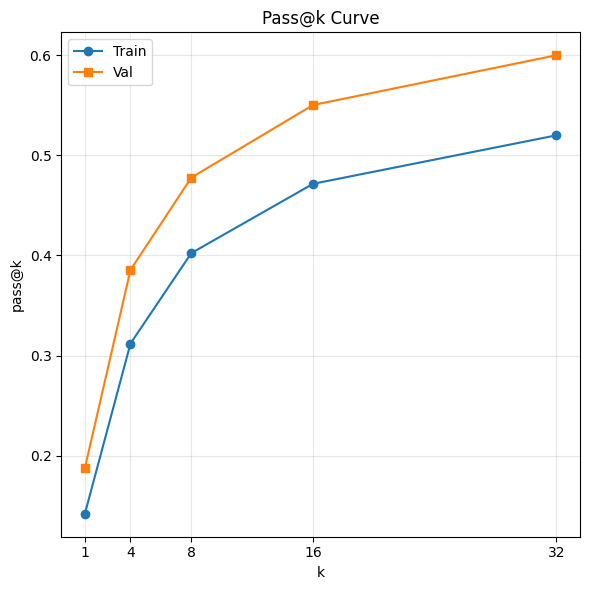

In [93]:
import matplotlib.pyplot as plt

with open("evaluation_results.json", "r", encoding="utf-8") as f:
    results = json.load(f)

PASS_K_VALUES = results["pass_k_values"]

def get_avg_pass_k(data_split, k_values):
    avg_pass = []
    for k in k_values:
        pass_vals = [task["pass_k_values"][str(k)] for task in data_split]
        avg_pass.append(np.mean(pass_vals))
    return avg_pass

train_pass_k = get_avg_pass_k(results["train"], PASS_K_VALUES)
val_pass_k = get_avg_pass_k(results["val"], PASS_K_VALUES)

train_avg_len = np.mean([task["avg_length"] for task in results["train"]])
val_avg_len = np.mean([task["avg_length"] for task in results["val"]])
print(f"Средняя длина генерации, Train: {train_avg_len:.2f}, Val: {val_avg_len:.2f}")

plt.figure(figsize=(6, 6))
plt.plot(PASS_K_VALUES, train_pass_k, marker='o', label='Train')
plt.plot(PASS_K_VALUES, val_pass_k, marker='s', label='Val')
plt.xlabel('k')
plt.ylabel('pass@k')
plt.xticks(PASS_K_VALUES)
plt.title('Pass@k Curve')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("pass_k_curve_baseline.png", dpi=150)
plt.show()

In [96]:
import json 

with open("/kaggle/working/hard_indices.json", "r", encoding="utf-8") as f:
    hard_indices = json.load(f)
    hard_val_idx = set(hard_indices.get('val_hard_idx', []))
    hard_train_idx = set(hard_indices.get('train_hard_idx', []))
    print(f"Train Hard Idx: {len(hard_train_idx)}")
    print(f"Val Hard Idx: {len(hard_val_idx)}")

Train Hard Idx: 48
Val Hard Idx: 12


## Pass@k curve только для Hard примеров

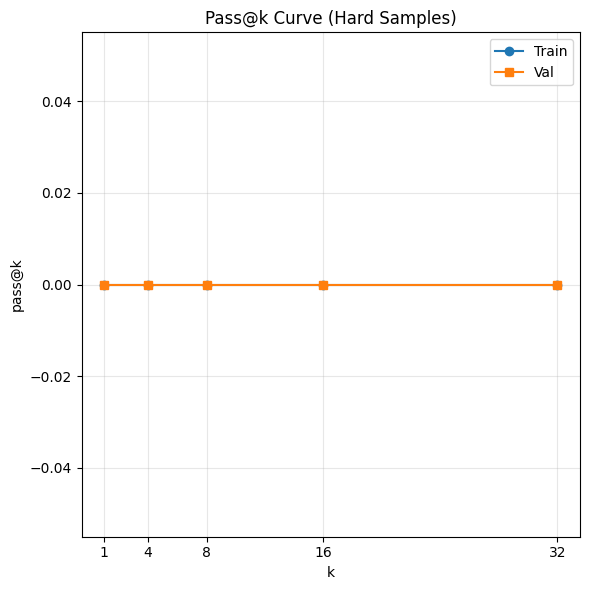

In [99]:
def get_avg_pass_k(data_split, k_values, hard_indices):
    avg_pass = []
    for k in k_values:
        pass_vals = [task["pass_k_values"][str(k)] for i, task in enumerate(data_split) if i in hard_indices]
        avg_pass.append(np.mean(pass_vals) if pass_vals else 0)  
    return avg_pass

train_pass_k = get_avg_pass_k(results["train"], PASS_K_VALUES, hard_train_idx)
val_pass_k = get_avg_pass_k(results["val"], PASS_K_VALUES, hard_val_idx)

plt.figure(figsize=(6, 6))
plt.plot(PASS_K_VALUES, train_pass_k, marker='o', label='Train')
plt.plot(PASS_K_VALUES, val_pass_k, marker='s', label='Val')
plt.xlabel('k')
plt.ylabel('pass@k')
plt.xticks(PASS_K_VALUES)
plt.title('Pass@k Curve (Hard Samples)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("pass_k_curve_baseline_hard.png", dpi=150)
plt.show()

# Шаг 2. GRPO-only (reward-only, без gold)

In [ ]:
from datasets import Dataset
from typing import List, Dict, Any
import ast

def verifier_reward(codes: List[str] = None,
    test_list: List[List[str]] = None,
    test_imports: List[List[str]] = None,
    prompts: List[str] = None,
    completions: Any = None,
    completion_ids: Any = None,
    **kwargs
) -> np.ndarray:
    
    """Парсинг ответов модели и нахождение reward для каждого из них"""

    global PROMPT_TO_TESTS

    if codes is None:
        codes_list = []
        if isinstance(completions, (list, tuple)):
            for item in completions:
                if isinstance(item, (list, tuple)):
                    if all(isinstance(x, str) for x in item):
                        codes_list.append("".join(item))
                    else:
                        codes_list.append(str(item))
                else:
                    codes_list.append(str(item))
        else:
            codes_list = [str(completions)]
    else:
        codes_list = list(codes)

    if test_list is not None and test_imports is not None:
        test_list_arr = list(test_list)
        test_imports_arr = list(test_imports)
    else:
        if prompts is None:
            test_list_arr = [[] for _ in codes_list]
            test_imports_arr = [[] for _ in codes_list]
        else:
            test_list_arr = []
            test_imports_arr = []
            for p in prompts:
                if p in PROMPT_TO_TESTS:
                    t, im = PROMPT_TO_TESTS[p]
                    test_list_arr.append(t)
                    test_imports_arr.append(im)
                else:
                    p_strip = p.strip()
                    if p_strip in PROMPT_TO_TESTS:
                        t, im = PROMPT_TO_TESTS[p_strip]
                        test_list_arr.append(t)
                        test_imports_arr.append(im)
                    else:
                        test_list_arr.append([])
                        test_imports_arr.append([])

    rewards = []
    for code, tests, imports in zip(codes_list, test_list_arr, test_imports_arr):

        """
        Модель отдает output в формате:
        [{'role': 'assistant', 'content': '```python\ndef min_k(records, k):\n    records.sort(key=lambda x: x[1])\n    min_records = records[:k]\n    return min_records\n```'}]
        Это str, где list со словарем с ключами role content
        Вынем content для правильной верификации ответа
        """

        ast_code = ast.literal_eval(code)
        ast_code = ast_code[0]["content"]
        code = ast_code
        
        try:
            imports_str = "\n".join(imports) if isinstance(imports, (list, tuple)) else str(imports)
            is_correct = verify_solution(code, tests, imports_str, timeout_per_test=5)
            reward = 1.0 if is_correct else 0.0
        except TimeoutException:
            reward = 0.0
        except Exception:
            reward = 0.0
        rewards.append(float(reward))

    return np.array(rewards, dtype=float)


PROMPT_TO_TESTS = {}

def prepare_grpo_dataset(data_dict: Dict) -> Dataset:
    global PROMPT_TO_TESTS
    PROMPT_TO_TESTS = {}

    data = {
        "prompt": [],
        "test_list": [],
        "test_imports": [],
    }

    for i in range(len(data_dict["prompt"])):
        required_func_name = data_dict["test_list"][i][0][7:].split("(")[0]
        prompt_text = data_dict["prompt"][i] + f" Give the function a name like this: {required_func_name}."

        formatted_messages = format_prompt(prompt_text, SYSTEM_PROMPT)

        data["prompt"].append(formatted_messages)
        data["test_list"].append(data_dict["test_list"][i])
        data["test_imports"].append(data_dict["test_imports"][i])

        PROMPT_TO_TESTS[str(formatted_messages)] = (data_dict["test_list"][i], data_dict["test_imports"][i])

    return Dataset.from_dict(data)

In [ ]:
from trl import GRPOConfig, GRPOTrainer
from transformers import AutoTokenizer
from typing import Set

def evaluate_with_grpo(trainer, tokenizer, dataset: Dict, hard_indices: Set, pass_k_values: List[int]) -> Dict[str, Dict]:

    """Получение метрик pass@k и avg_length модели для всех данных и для hard-данных"""

    trainer.model.eval()
    results = {"all": {}, "hard": {}}
    
    tok = tokenizer if tokenizer else getattr(trainer, 'processing_class', getattr(trainer, 'tokenizer', None))

    for split_name, data, indices in [("all", dataset, None), ("hard", dataset, list(hard_indices) if hard_indices else None)]:
        if not indices and split_name == "hard":
            continue
            
        eval_indices = indices if indices is not None else range(len(data["prompt"]))
        pass_k_results = {k: [] for k in pass_k_values}
        lengths = []
        
        for idx in tqdm(eval_indices):
            if not data["test_list"][idx]:
                continue

            required_func_name = data["test_list"][idx][0][7:].split("(")[0]
            prompt_text = data["prompt"][idx].replace(f" Give the function a name like this: {required_func_name}.", "") # Очищаем, если там уже есть
            prompt_text = prompt_text + f" Give the function a name like this: {required_func_name}."
            
            test_list = data["test_list"][idx]
            test_imports = "\n".join(data["test_imports"][idx])
            
            messages = format_prompt(prompt_text, SYSTEM_PROMPT)
            input_text = tok.apply_chat_template(
                messages, tokenize=False, add_generation_prompt=True
            )
            
            inputs = tok(input_text, return_tensors="pt").to(trainer.model.device)
            
            n_gen = max(pass_k_values) # генерируем максимальное кол-во из переданных k для pass@k
            
            outputs = trainer.model.generate(
                **inputs,
                max_new_tokens=GRPO_CONFIG.max_completion_length,
                temperature=GRPO_CONFIG.temperature,
                top_k=GRPO_CONFIG.top_k,
                do_sample=True,
                num_return_sequences=n_gen,
                pad_token_id=tok.pad_token_id,
                eos_token_id=tok.eos_token_id,
            )
            
            input_len = inputs["input_ids"].shape[1]
            generated_texts = [
                tok.decode(out[input_len:], skip_special_tokens=True)
                for out in outputs
            ]
            
            correct_count = 0
            for gen in generated_texts:
                lengths.append(len(tok.encode(gen)))
                if verify_solution(gen, test_list, test_imports):
                    correct_count += 1
            
            n = len(generated_texts)
            for k in pass_k_values:
                pass_k_results[k].append(pass_k(n, correct_count, k))
        
        results[split_name] = {
            "pass@k": {k: np.mean(vals) for k, vals in pass_k_results.items()},
            "avg_length": np.mean(lengths) if lengths else 0,
            "num_evaluated": len(eval_indices),
        }
    
    trainer.model.train()
    return results

In [20]:
!pip install trl[vllm] -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 436.4/436.4 MB 4.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.0/180.0 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 99.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.9/887.9 MB 1.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 2.0 MB/s eta 0:00:000:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 7.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 MB 5.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 103.6 MB/s eta 0:00:0000

In [102]:
import os
os.environ["ACCELERATE_DISABLE_IPEX"] = "1"

In [ ]:
!pip uninstall unsloth -y
!pip install "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

In [ ]:
import unsloth
from typing import List, Dict, Set
from transformers import AutoModelForCausalLM, AutoTokenizer, BitsAndBytesConfig
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training
from unsloth import FastLanguageModel

CONFIG = {
    "num_samples": 32,
    "temperature": 1.0,
    "top_k": 50,
    "max_new_tokens": 128, # достаточно для генерации кода небольших функций на python 
    "model": "Qwen/Qwen2.5-0.5B-Instruct",
    "dtype": "float16" if torch.cuda.is_available() else "float32",
}

model, tokenizer = FastLanguageModel.from_pretrained(
    model_name=CONFIG["model"],
    max_seq_length=2048,
    load_in_4bit=True,   
    fast_inference=False, # T4 и vLLM не дружат...
    max_lora_rank=16,
    gpu_memory_utilization=0.85, 
)

print(model.device)

# Использование LoRA для более быстрого обучения
model = FastLanguageModel.get_peft_model(
    model,
    r = 16,
    target_modules = [
        "q_proj", "k_proj", "v_proj", "o_proj",
        "gate_proj", "up_proj", "down_proj",
    ],
    lora_alpha = 16,
    use_gradient_checkpointing = "unsloth", 
    random_state = 33,
)


GRPO_CONFIG = GRPOConfig(
    output_dir="./grpo_checkpoints",
    num_generations=8,
    max_completion_length=CONFIG["max_new_tokens"],
    temperature=CONFIG["temperature"],
    top_k=CONFIG["top_k"],
    learning_rate=2e-5,
    beta=0.1,
    epsilon=0.2,
    num_train_epochs=3,
    per_device_train_batch_size=4, 
    gradient_accumulation_steps=2,
    logging_steps=5,
    report_to="none",
    log_completions=True,
    save_steps=50,
    seed=33,
    bf16=False,
    fp16=True,
    remove_unused_columns=False,
)

train_data, val_data = get_train_val_data(train_size=100, val_size=30)
train_dataset = prepare_grpo_dataset(train_data)


# —————— патч для совместимости с TRL/unsloth/peft ——————
def ensure_warnings_issued_dict(peft_model):
    try:
        if not hasattr(peft_model, "warnings_issued") or peft_model.warnings_issued is None:
            peft_model.warnings_issued = {}
    except Exception:
        try:
            setattr(peft_model, "warnings_issued", {})
        except Exception:
            pass

    base = getattr(peft_model, "base_model", None)
    if base is not None:
        if not hasattr(base, "warnings_issued") or base.warnings_issued is None:
            base.warnings_issued = {}

ensure_warnings_issued_dict(model)
for candidate in ("model", "module"):
    sub = getattr(model, candidate, None)
    if sub is not None:
        if not hasattr(sub, "warnings_issued") or getattr(sub, "warnings_issued") is None:
            try:
                sub.warnings_issued = {}
            except Exception:
                pass

model.warnings_issued["estimate_tokens"] = True
if hasattr(model, "base_model"):
    model.base_model.warnings_issued["estimate_tokens"] = True


trainer = GRPOTrainer(
    model = model,
    processing_class = tokenizer, 
    reward_funcs = [verifier_reward],
    args = GRPO_CONFIG,
    train_dataset = train_dataset
)

==((====))==  Unsloth 2026.3.3: Fast Qwen2 patching. Transformers: 5.2.0.
   \\   /|    Tesla T4. Num GPUs = 2. Max memory: 14.563 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.0+cu126. CUDA: 7.5. CUDA Toolkit: 12.6. Triton: 3.5.0
\        /    Bfloat16 = FALSE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


Loading weights:   0%|          | 0/290 [00:00<?, ?it/s]

unsloth/qwen2.5-0.5b-instruct-unsloth-bnb-4bit does not have a padding token! Will use pad_token = <|PAD_TOKEN|>.
cuda:0


In [105]:
from tqdm import tqdm
PASS_K_VALUES = [1, 4, 8, 16, 32]

baseline_metrics = evaluate_with_grpo(trainer, tokenizer, val_data, hard_val_idx, pass_k_values=PASS_K_VALUES)

100%|██████████| 12/12 [02:48<00:00, 14.01s/it]


In [107]:
print(f"Оценка до обучения:\n{baseline_metrics}")

Оценка до обучения:
{'all': {'pass@k': {1: np.float64(0.15104166666666663), 4: np.float64(0.31357248794957365), 8: np.float64(0.40567918453235474), 16: np.float64(0.48289908809036336), 32: np.float64(0.5333333333333333)}, 'avg_length': np.float64(96.01145833333334), 'num_evaluated': 30}, 'hard': {'pass@k': {1: np.float64(0.005208333333333333), 4: np.float64(0.0198252688172043), 8: np.float64(0.03696236559139785), 16: np.float64(0.06317204301075269), 32: np.float64(0.08333333333333333)}, 'avg_length': np.float64(103.69270833333333), 'num_evaluated': 12}}


In [109]:
train_result = trainer.train()

The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'bos_token_id': None}.
==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 100 | Num Epochs = 3 | Total steps = 300
O^O/ \_/ \    Batch size per device = 4 | Gradient accumulation steps = 2
\        /    Data Parallel GPUs = 1 | Total batch size (4 x 2 x 1) = 8
 "-____-"     Trainable parameters = 8,798,208 of 502,830,976 (1.75% trained)


Step,Training Loss,reward,reward_std,completions / mean_length,completions / min_length,completions / max_length,completions / clipped_ratio,completions / mean_terminated_length,completions / min_terminated_length,completions / max_terminated_length,sampling / sampling_logp_difference / mean,sampling / sampling_logp_difference / max,sampling / importance_sampling_ratio / min,sampling / importance_sampling_ratio / mean,sampling / importance_sampling_ratio / max,kl,rewards / verifier_reward / mean,rewards / verifier_reward / std
5,0.039376,0.025000,0.070711,81.975000,30.800000,126.800000,0.425000,47.766667,30.800000,80.200000,0,0,0,0,0,0.000012,0.025000,0.070711
10,-0.033918,0.150000,0.266803,88.000000,25.200000,128.000000,0.300000,71.849526,25.200000,121.800000,No Log,No Log,No Log,No Log,No Log,0.000020,0.150000,0.266803
15,-0.011278,0.150000,0.266803,95.425000,47.800000,128.000000,0.450000,56.071429,22.200000,85.000000,No Log,No Log,No Log,No Log,No Log,0.000075,0.150000,0.266803
20,-0.003811,0.325000,0.302996,80.275000,32.600000,128.000000,0.250000,64.677145,32.600000,105.400000,No Log,No Log,No Log,No Log,No Log,0.000579,0.325000,0.302996
25,0.045681,0.300000,0.266803,101.900000,59.200000,128.000000,0.500000,82.850000,59.200000,113.400000,No Log,No Log,No Log,No Log,No Log,0.000806,0.300000,0.266803
30,0.041467,0.125000,0.196092,69.250000,20.600000,128.000000,0.225000,53.919048,20.600000,98.600000,No Log,No Log,No Log,No Log,No Log,0.002073,0.125000,0.196092
35,0.055230,0.100000,0.106904,88.675000,45.200000,128.000000,0.350000,71.652383,45.200000,106.200000,No Log,No Log,No Log,No Log,No Log,0.003299,0.100000,0.106904
40,0.007166,0.025000,0.070711,68.800000,22.800000,128.000000,0.225000,52.601907,22.800000,92.000000,No Log,No Log,No Log,No Log,No Log,0.011188,0.025000,0.070711
45,-0.018519,0.150000,0.092582,61.275000,27.400000,107.400000,0.100000,56.832143,27.400000,104.600000,No Log,No Log,No Log,No Log,No Log,0.015713,0.150000,0.092582
50,-0.104926,0.175000,0.288674,78.050000,45.600000,126.400000,0.350000,42.010001,20.000000,82.400000,No Log,No Log,No Log,No Log,No Log,0.004790,0.175000,0.288674


╭──────────────────────────────────────────────────── Step 5 ─────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def find_First_Missing(nums):         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     sum_of_numbers =                  │                 │           │ │
│ │ writes Python code.                   │ sum(sorted(nums))                     │                 │           │ │
│ │ Given a problem description,          │     for i in range(len(nums)+1):      │                 │           │ │
│ │ implement a function that solves it.  │         if sum_of_numbers-i !=        │                 │           │ │
│ │ Return only the code. Avoid           │ nums[i]:                              │                 │           │ │
│ │ explanations, markdown formatting and │             return nums[i]            │                 │           │ │
│ │ test cases.                           │     return nums[-1]                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the smallest missing number from │                                       │                 │           │ │
│ │ a sorted list of natural numbers.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ find_First_Missing.                   │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def find_First_Missing(nums):         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     for i in range(1, len(nums)):     │                 │           │ │
│ │ writes Python code.                   │         if not nums[i] - nums[i-1] >  │                 │           │ │
│ │ Given a problem description,          │ 1:                                    │                 │           │ │
│ │ implement a function that solves it.  │             return nums[i]            │                 │           │ │
│ │ Return only the code. Avoid           │     return nums[-1] + len(nums)       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the smallest missing number from │                                       │                 │           │ │
│ │ a sorted list of natural numbers.     │             

╭──────────────────────────────────────────────────── Step 10 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def count_divisors(n):                │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │     # Your code goes here             │                 │           │ │
│ │ writes Python code.                   │     pass                              │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ check whether the count of divisors   │                                       │                 │           │ │
│ │ is even.                              │                                       │                 │           │ │
│ │ https://www.w3resource.com/python-ex… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ count_divisors.                       │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def count_divisors(n):                │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │     count_divisors = 0                │                 │           │ │
│ │ writes Python code.                   │     for i in range(1, n + 1):         │                 │           │ │
│ │ Given a problem description,          │         if n % i == 0:                │                 │           │ │
│ │ implement a function that solves it.  │             count_divisors += 1       │                 │           │ │
│ │ Return only the code. Avoid           │     if count_divisors % 2 == 0:       │                 │           │ │
│ │ explanations, markdown formatting and │         print("Even")                 │                 │           │ │
│ │ test cases.                           │     else:                             │                 │           │ │
│ │ user                                  │         print("Odd")                  │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ check whether the count of divisors   │             

╭──────────────────────────────────────────────────── Step 15 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def add_dict_to_tuple(value: dict) -> │                 │           │ │
│ │ writes Python code.                   │ tuple:                                │                 │           │ │
│ │ Given a problem description,          │     """                               │                 │           │ │
│ │ implement a function that solves it.  │     Create a tuple containing the     │                 │           │ │
│ │ Return only the code. Avoid           │ input dictionary followed by a new    │                 │           │ │
│ │ explanations, markdown formatting and │ dictionary.                           │                 │           │ │
│ │ test cases.                           │     :param value: The dictionary to   │                 │           │ │
│ │ user                                  │ be inserted into the tuple.           │                 │           │ │
│ │ Problem: Write a function to add a    │     :return: The tuple containing the │                 │           │ │
│ │ dictionary to the tuple. The output   │ original dictionary and the new       │                 │           │ │
│ │ should be a tuple. Give the function  │ dictionary.                           │                 │           │ │
│ │ a name like this: add_dict_to_tuple.  │                                       │                 │           │ │
│ │                                       │     Example usage:                    │                 │           │ │
│ │ Implement the function in Python:     │     >>> value1 = {"key": "value1"}    │                 │           │ │
│ │ assistant                             │     >>> value2 = {"key1": "value2"}   │                 │           │ │
│ │                                       │     >>> add_dict_to_tuple(value1)     │                 │           │ │
│ │                                       │     ('data', {'key': 'value1',        │                 │           │ │
│ │                                       │ 'key1': 'value2'})                    │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     return (value, value)             │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def add_dict_to_tuple():              │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │     # Add your code here              │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │             

╭──────────────────────────────────────────────────── Step 20 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def div_list(list1, list2):           │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │     # create an empty list to store   │                 │           │ │
│ │ writes Python code.                   │ the result                            │                 │           │ │
│ │ Given a problem description,          │     result = []                       │                 │           │ │
│ │ implement a function that solves it.  │     # loop through both lists         │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(len(list1)):       │                 │           │ │
│ │ explanations, markdown formatting and │         # create a new sublist based  │                 │           │ │
│ │ test cases.                           │ on the first element                  │                 │           │ │
│ │ user                                  │         sublist = list1[:i] +         │                 │           │ │
│ │ Problem: Write a function to divide   │ list2[i:]                             │                 │           │ │
│ │ two lists element wise. Give the      │         # append the sublist to the   │                 │           │ │
│ │ function a name like this: div_list.  │ result                                │                 │           │ │
│ │                                       │         result.append(sublist)        │                 │           │ │
│ │ Implement the function in Python:     │     return result                     │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a simple Python     │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │ function that divides two lists       │                 │           │ │
│ │ writes Python code.                   │ element-wise:                         │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def div_list(list1, list2):           │                 │           │ │
│ │ explanations, markdown formatting and │     return [item1 / item2 for item1,  │                 │           │ │
│ │ test cases.                           │ item2 in zip(list1, list2)]           │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to divide   │                                       │                 │           │ │
│ │ two lists element wise. Give the      │ This function works by taking two     │                 │           │ │
│ │ function a name like this: div_list.  │ lists, converting each one into a     │                 │           │ │
│ │                                       │ list of its elements (to avoid        │                 │           │ │
│ │ Implement the function in Python:     │ modifying th

╭──────────────────────────────────────────────────── Step 25 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def rotate_right(arr, n, k):          │                 │           │ │
│ │ writes Python code.                   │     k = k % n  # Handle case where k  │                 │           │ │
│ │ Given a problem description,          │ is greater than n                     │                 │           │ │
│ │ implement a function that solves it.  │     k = n - k  # Calculate the number │                 │           │ │
│ │ Return only the code. Avoid           │ of items to rotate to the left        │                 │           │ │
│ │ explanations, markdown formatting and │     arr[n:], arr[:n] = arr[:k],       │                 │           │ │
│ │ test cases.                           │ arr[k:]  # Rotate the array           │                 │           │ │
│ │ user                                  │     return arr                        │                 │           │ │
│ │ Problem: Write a function to rotate a │ ```                                   │                 │           │ │
│ │ given list by specified number of     │                                       │                 │           │ │
│ │ items to the right direction.         │ You can call the `rotate_right`       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │ function by passing the list and the  │                 │           │ │
│ │ Give the function a name like this:   │ number of rotation items as arguments │                 │           │ │
│ │ rotate_right.                         │ in its last parameter. For example,   │                 │           │ │
│ │                                       │ `rotate_right([1, 2, 3, 4], 2, 2)`    │                 │           │ │
│ │ Implement the function in Python:     │ will return                           │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's the Python code implementing   │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ the rotate_right operation:           │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def rotate_right(nums, n):            │                 │           │ │
│ │ Return only the code. Avoid           │     # Rotate the list by filling the  │                 │           │ │
│ │ explanations, markdown formatting and │ first n items with the last n items.  │                 │           │ │
│ │ test cases.                           │     return nums[n:] + nums[:n]        │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to rotate a │                                       │                 │           │ │
│ │ given list by specified number of     │ Note: This f

╭──────────────────────────────────────────────────── Step 30 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_Index(n):                    │                 │           │ │
│ │ writes Python code.                   │     tri_num = 1                       │                 │           │ │
│ │ Given a problem description,          │     while tri_num ** 3 <= 2 ** n:     │                 │           │ │
│ │ implement a function that solves it.  │         tri_num += 1                  │                 │           │ │
│ │ Return only the code. Avoid           │     index = 0                         │                 │           │ │
│ │ explanations, markdown formatting and │     num = 1                           │                 │           │ │
│ │ test cases.                           │     while tri_num >= num ** 3:        │                 │           │ │
│ │ user                                  │         index += 1                    │                 │           │ │
│ │ Problem: Write a python function to   │         num += 1                      │                 │           │ │
│ │ find the index of smallest triangular │     if index == 0:                    │                 │           │ │
│ │ number with n digits.                 │         return 0                      │                 │           │ │
│ │ https://www.geeksforgeeks.org/index-… │     else:                             │                 │           │ │
│ │ Give the function a name like this:   │         return index                  │                 │           │ │
│ │ find_Index.                           │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_Index(n):                    │                 │           │ │
│ │ writes Python code.                   │     index = 0                         │                 │           │ │
│ │ Given a problem description,          │     num = 3                           │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(1, n + 1):         │                 │           │ │
│ │ Return only the code. Avoid           │         if 3**i > num:                │                 │           │ │
│ │ explanations, markdown formatting and │             index = 3**i              │                 │           │ │
│ │ test cases.                           │             num += n                  │                 │           │ │
│ │ user                                  │         else:                         │                 │           │ │
│ │ Problem: Write a python function to   │             index = 3**i              │                 │           │ │
│ │ find the index of smallest triangular │     return i

╭──────────────────────────────────────────────────── Step 35 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def unique_sublists(lst):             │                 │           │ │
│ │ writes Python code.                   │     result = {}                       │                 │           │ │
│ │ Given a problem description,          │     for i, value in enumerate(lst):   │                 │           │ │
│ │ implement a function that solves it.  │         if value not in result:       │                 │           │ │
│ │ Return only the code. Avoid           │             result[value] = 1         │                 │           │ │
│ │ explanations, markdown formatting and │         else:                         │                 │           │ │
│ │ test cases.                           │             result[value] += 1        │                 │           │ │
│ │ user                                  │     return result                     │                 │           │ │
│ │ Problem: Write a function to count    │ ```                                   │                 │           │ │
│ │ the number of lists within a list.    │                                       │                 │           │ │
│ │ The function should return a          │ The function takes a list 'lst' and   │                 │           │ │
│ │ dictionary, where every list is       │ an empty dictionary and returns a     │                 │           │ │
│ │ turned to a tuple, and the value of   │ dictionary of counts of 'lst' using   │                 │           │ │
│ │ the tuple is the number of its        │ only the keys from 'lst'. All         │                 │           │ │
│ │ occurrences. Give the function a name │ non-repeating values are the key, and │                 │           │ │
│ │ like this: unique_sublists.           │ their frequency is the dictionary     │                 │           │ │
│ │                                       │ value.                                │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that implements the desired behavior: │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def unique_sublists(list):            │                 │           │ │
│ │ Return only the code. Avoid           │     count_dict = {}                   │                 │           │ │
│ │ explanations, markdown formatting and │     for i, lst in enumerate(list):    │                 │           │ │
│ │ test cases.                           │         if lst not in count_dict:     │                 │           │ │
│ │ user                                  │             

╭──────────────────────────────────────────────────── Step 40 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def get_difference(list1, list2):     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │   """                                 │                 │           │ │
│ │ writes Python code.                   │   This function takes two lists as    │                 │           │ │
│ │ Given a problem description,          │ input and returns the difference      │                 │           │ │
│ │ implement a function that solves it.  │ between the lists.                    │                 │           │ │
│ │ Return only the code. Avoid           │   It iterates over the elements of    │                 │           │ │
│ │ explanations, markdown formatting and │ list1 and compares each element with  │                 │           │ │
│ │ test cases.                           │ element in list2.                     │                 │           │ │
│ │ user                                  │   The result is stored in a new list  │                 │           │ │
│ │ Problem: Write a python function to   │ and returned.                         │                 │           │ │
│ │ get the difference between two lists. │   """                                 │                 │           │ │
│ │ Give the function a name like this: . │   difference_list = []                │                 │           │ │
│ │                                       │   for i in range(len(list1)):         │                 │           │ │
│ │ Implement the function in Python:     │     if i not in difference_list:      │                 │           │ │
│ │ assistant                             │       difference_list.extend(list1[i] │                 │           │ │
│ │                                       │ - list2[i])                           │                 │           │ │
│ │                                       │   return difference_list              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def get_difference(list1, list2):     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     return list1 - list2              │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ get the difference between two lists. │                                       │                 │           │ │
│ │ Give the function a name like this: . │                                       │                 │           │ │
│ │                                       │             

╭──────────────────────────────────────────────────── Step 45 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ from collections import Counter       │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ def find_min_diff(arr):               │                 │           │ │
│ │ implement a function that solves it.  │     if len(arr) < 2:                  │                 │           │ │
│ │ Return only the code. Avoid           │         return 0                      │                 │           │ │
│ │ explanations, markdown formatting and │     unique_items = Counter(arr)       │                 │           │ │
│ │ test cases.                           │     sorted_unique_items =             │                 │           │ │
│ │ user                                  │ sorted((item, idx) for idx, item in   │                 │           │ │
│ │ Problem: Write a python function to   │ enumerate(arr))                       │                 │           │ │
│ │ find the minimum difference between   │     for i in range(1,                 │                 │           │ │
│ │ any two elements in a given array.    │ len(unique_items)):                   │                 │           │ │
│ │ https://www.geeksforgeeks.org/find-m… │         if                            │                 │           │ │
│ │ Give the function a name like this:   │ unique_items[sorted_unique_items[i][… │                 │           │ │
│ │ find_min_diff.                        │ != unique_items[sorted_unique_items[i │                 │           │ │
│ │                                       │ - 1][1]]:                             │                 │           │ │
│ │ Implement the function in Python:     │             return                    │                 │           │ │
│ │ assistant                             │ abs(sorted_unique_items[0][0] -       │                 │           │ │
│ │                                       │ sorted_unique_items[1][0])            │                 │           │ │
│ │                                       │     return 0                          │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_min_diff(arr):               │                 │           │ │
│ │ writes Python code.                   │     # sort the array                  │                 │           │ │
│ │ Given a problem description,          │     arr.sort()                        │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │     # initialize the smallest         │                 │           │ │
│ │ explanations, markdown formatting and │ difference as a large positive number │                 │           │ │
│ │ test cases.                           │     min_diff = float("inf")           │                 │           │ │
│ │ user                                  │             

╭──────────────────────────────────────────────────── Step 50 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def multiply_elements(arr):           │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │     """                               │                 │           │ │
│ │ writes Python code.                   │     This function takes a tuple of    │                 │           │ │
│ │ Given a problem description,          │ numbers as input and returns a tuple  │                 │           │ │
│ │ implement a function that solves it.  │ of the same length                    │                 │           │ │
│ │ Return only the code. Avoid           │     where the i-th element in the     │                 │           │ │
│ │ explanations, markdown formatting and │ first tuple is multiplied by the      │                 │           │ │
│ │ test cases.                           │ (i+1)th element in the second         │                 │           │ │
│ │ user                                  │     tuple. That is,                   │                 │           │ │
│ │ Problem: Write a function that takes  │ multiply_elements([1, 2, 3], [3, 2,   │                 │           │ │
│ │ as input a tuple of numbers           │ 1]) produces [1, 2*3, 3*1].           │                 │           │ │
│ │ (t_1,...,t_{N+1}) and returns a tuple │     """                               │                 │           │ │
│ │ of length N where the i-th element of │                                       │                 │           │ │
│ │ the tuple is equal to t_i * t_{i+1}.  │     # Create an empty list to hold    │                 │           │ │
│ │ Give the function a name like this:   │ the result                            │                 │           │ │
│ │ multiply_elements.                    │     result = []                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │     # Iterate over the index i from 0 │                 │           │ │
│ │ assistant                             │ to N-1                                │                 │           │ │
│ │                                       │     for i in                          │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ def multiply_elements(t):             │                 │           │ │
│ │ writes Python code.                   │     N = len(t) - 1                    │                 │           │ │
│ │ Given a problem description,          │     return tuple(t[i] * t[i+1] for i  │                 │           │ │
│ │ implement a function that solves it.  │ in range(N))                          │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function that takes  │             

╭──────────────────────────────────────────────────── Step 55 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def get_ludic(x):                     │                 │           │ │
│ │ writes Python code.                   │     """Finds the first Lucid number   │                 │           │ │
│ │ Given a problem description,          │ that is smaller or equal to the given │                 │           │ │
│ │ implement a function that solves it.  │ integer.                              │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     Args:                             │                 │           │ │
│ │ test cases.                           │     x (int): A number >= 0            │                 │           │ │
│ │ user                                  │ representing the upper limit of       │                 │           │ │
│ │ Problem: Write a function to get all  │ values to be tested for lucidity.     │                 │           │ │
│ │ lucid numbers smaller than or equal   │                                       │                 │           │ │
│ │ to a given integer. Give the function │     Returns:                          │                 │           │ │
│ │ a name like this: get_ludic.          │     int: The first lucidity number    │                 │           │ │
│ │                                       │ found between 0 and x that meets the  │                 │           │ │
│ │ Implement the function in Python:     │ criteria.                             │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │     Example:                          │                 │           │ │
│ │                                       │     >>> get_ludic(5)                  │                 │           │ │
│ │                                       │     3                                 │                 │           │ │
│ │                                       │     >>> get_ludic(7)                  │                 │           │ │
│ │                                       │     6                                 │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     count = 0                         │                 │           │ │
│ │                                       │     for num in range(x):              │                 │           │ │
│ │                                       │         if (num - int(num             │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def get_ludic(n):                     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     # Initialize an empty list to     │                 │           │ │
│ │ writes Python code.                   │ store the lucid numbers               │                 │           │ │
│ │ Given a problem description,          │     lucid_numbers = []                │                 │           │ │
│ │ implement a function that solves it.  │             

╭──────────────────────────────────────────────────── Step 60 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ def check_none(tup):                  │                 │           │ │
│ │ writes Python code.                   │     if None in tup:                   │                 │           │ │
│ │ Given a problem description,          │         return True                   │                 │           │ │
│ │ implement a function that solves it.  │     else:                             │                 │           │ │
│ │ Return only the code. Avoid           │         return False                  │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to check if │                                       │                 │           │ │
│ │ the given tuple has any none value or │                                       │                 │           │ │
│ │ not. Give the function a name like    │                                       │                 │           │ │
│ │ this: check_none.                     │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def check_none(iterable):             │                 │           │ │
│ │ writes Python code.                   │     has_any_none = any(item in        │                 │           │ │
│ │ Given a problem description,          │ iterable for item in ["None", "na",   │                 │           │ │
│ │ implement a function that solves it.  │ "nan"])                               │                 │           │ │
│ │ Return only the code. Avoid           │     return {"contains_any_none":      │                 │           │ │
│ │ explanations, markdown formatting and │ has_any_none, "items_in_iterable":    │                 │           │ │
│ │ test cases.                           │ iterable}                             │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to check if │                                       │                 │           │ │
│ │ the given tuple has any none value or │                                       │                 │           │ │
│ │ not. Give the function a name like    │                                       │                 │           │ │
│ │ this: check_none.                     │             

╭──────────────────────────────────────────────────── Step 65 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def swap_List(x):                     │                 │           │ │
│ │ writes Python code.                   │     return x[:1] + x[1:]              │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ interchange the first and last        │                                       │                 │           │ │
│ │ element in a given list. Give the     │                                       │                 │           │ │
│ │ function a name like this: swap_List. │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def swap_List(lst):                   │                 │           │ │
│ │ writes Python code.                   │     if len(lst) < 2:                  │                 │           │ │
│ │ Given a problem description,          │         return lst                    │                 │           │ │
│ │ implement a function that solves it.  │     else:                             │                 │           │ │
│ │ Return only the code. Avoid           │         temp = lst[0]                 │                 │           │ │
│ │ explanations, markdown formatting and │         lst.pop(0)                    │                 │           │ │
│ │ test cases.                           │         lst.insert(0, temp)           │                 │           │ │
│ │ user                                  │         return lst                    │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ interchange the first and last        │                                       │                 │           │ │
│ │ element in a given list. Give the     │ ### Explanation:                      │                 │           │ │
│ │ function a name like this: swap_List. │ - **swap_Lis

╭──────────────────────────────────────────────────── Step 70 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def pair_xor_sum(nums):               │                 │           │ │
│ │ writes Python code.                   │     xor_sum = 0                       │                 │           │ │
│ │ Given a problem description,          │     for i in range(0, len(nums), 2):  │                 │           │ │
│ │ implement a function that solves it.  │         xor_sum = xor_sum ^ nums[i]   │                 │           │ │
│ │ Return only the code. Avoid           │     return xor_sum                    │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the sum of xor of all pairs of   │                                       │                 │           │ │
│ │ numbers in the given list. Give the   │                                       │                 │           │ │
│ │ function a name like this:            │                                       │                 │           │ │
│ │ pair_xor_Sum.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def pair_xor_Sum(numbers):            │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     xor_sum = 0                       │                 │           │ │
│ │ writes Python code.                   │     for i in range(len(numbers)):     │                 │           │ │
│ │ Given a problem description,          │         for j in range(i+1,           │                 │           │ │
│ │ implement a function that solves it.  │ len(numbers)):                        │                 │           │ │
│ │ Return only the code. Avoid           │             xor_sum ^= numbers[i] ^   │                 │           │ │
│ │ explanations, markdown formatting and │ numbers[j]                            │                 │           │ │
│ │ test cases.                           │     return xor_sum                    │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the sum of xor of all pairs of   │                                       │                 │           │ │
│ │ numbers in the given list. Give the   │             

╭──────────────────────────────────────────────────── Step 75 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ import numpy as np                    │                 │           │ │
│ │ writes Python code.                   │ from collections import deque         │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ def min_Jumps(target_position,        │                 │           │ │
│ │ Return only the code. Avoid           │ grid_size, max_size,                  │                 │           │ │
│ │ explanations, markdown formatting and │ current_position):                    │                 │           │ │
│ │ test cases.                           │     """                               │                 │           │ │
│ │ user                                  │     Given a target position (d, 0),   │                 │           │ │
│ │ Problem: Write a function to check    │ an array of positions (grid_size,     │                 │           │ │
│ │ for the number of jumps required of   │ direction),                           │                 │           │ │
│ │ given length to reach a point of form │     the max grid position (max_size,  │                 │           │ │
│ │ (d, 0) from origin in a 2d plane.     │ direction), and the current position  │                 │           │ │
│ │ Give the function a name like this:   │ (d, 0),                               │                 │           │ │
│ │ min_Jumps.                            │     the function returns the minimum  │                 │           │ │
│ │                                       │ number of jump that's needed to reach │                 │           │ │
│ │ Implement the function in Python:     │ the target.                           │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │     grid_size: (m, n)                 │                 │           │ │
│ │                                       │     max_size: (m, n)                  │                 │           │ │
│ │                                       │     current_position: (d, 0)          │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     x, y = current_position           │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def min_Jumps(l):                     │                 │           │ │
│ │ writes Python code.                   │     from collections import deque     │                 │           │ │
│ │ Given a problem description,          │     queue = deque()                   │                 │           │ │
│ │ implement a function that solves it.  │     queue.append([0, 0])              │                 │           │ │
│ │ Return only the code. Avoid           │     jumps = 0                         │                 │           │ │
│ │ explanations, markdown formatting and │     n = l   

╭──────────────────────────────────────────────────── Step 80 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def second_smallest(numbers):         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     return sorted(numbers)[1]         │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ second_smallest.                      │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(input_list):      │                 │           │ │
│ │ writes Python code.                   │     input_list.sort()                 │                 │           │ │
│ │ Given a problem description,          │     return input_list[1]              │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ This code defines a function called   │                 │           │ │
│ │ test cases.                           │ `second_smallest` that takes a list   │                 │           │ │
│ │ user                                  │ as input and returns the second       │                 │           │ │
│ │ Problem: Write a function to find the │ smallest number in the list. It first │                 │           │ │
│ │ second smallest number in a list.     │ sorts the input list using the        │                 │           │ │
│ │ Give the function a name like this:   │ `sort()` method, which organizes all  │                 │           │ │
│ │ second_smallest.                      │ the elements

╭──────────────────────────────────────────────────── Step 85 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def sample_nam(names):                │                 │           │ │
│ │ writes Python code.                   │     total_length = 0                  │                 │           │ │
│ │ Given a problem description,          │     for name in names:                │                 │           │ │
│ │ implement a function that solves it.  │         name_name = name[0] +         │                 │           │ │
│ │ Return only the code. Avoid           │ name.lower()                          │                 │           │ │
│ │ explanations, markdown formatting and │         total_length +=               │                 │           │ │
│ │ test cases.                           │ len(name_name)                        │                 │           │ │
│ │ user                                  │     return total_length               │                 │           │ │
│ │ Problem: Write a function to sum the  │ ```                                   │                 │           │ │
│ │ length of the names of a given list   │                                       │                 │           │ │
│ │ of names after removing the names     │                                       │                 │           │ │
│ │ that start with a lowercase letter.   │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sample_nam.                           │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def sample_nam(names):                │                 │           │ │
│ │ writes Python code.                   │     length = 0                        │                 │           │ │
│ │ Given a problem description,          │     for name in names:                │                 │           │ │
│ │ implement a function that solves it.  │         name = name.lower()           │                 │           │ │
│ │ Return only the code. Avoid           │         length += len(name)           │                 │           │ │
│ │ explanations, markdown formatting and │     return length                     │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │ This solution takes the input list of │                 │           │ │
│ │ Problem: Write a function to sum the  │ names, trims the names by converting  │                 │           │ │
│ │ length of the names of a given list   │ each name in

╭──────────────────────────────────────────────────── Step 90 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def occurance_substring(string,       │                 │           │ │
│ │ writes Python code.                   │ substr):                              │                 │           │ │
│ │ Given a problem description,          │     i = 0                             │                 │           │ │
│ │ implement a function that solves it.  │     for idx in range(len(string)):    │                 │           │ │
│ │ Return only the code. Avoid           │         if string[idx:idx +           │                 │           │ │
│ │ explanations, markdown formatting and │ len(substr)] == substr:               │                 │           │ │
│ │ test cases.                           │             return i, idx             │                 │           │ │
│ │ user                                  │         i += 1                        │                 │           │ │
│ │ Problem: Write a function to find the │     return None                       │                 │           │ │
│ │ occurrence and position of the        │ ```                                   │                 │           │ │
│ │ substrings within a string. Return    │                                       │                 │           │ │
│ │ None if there is no match. Give the   │                                       │                 │           │ │
│ │ function a name like this:            │                                       │                 │           │ │
│ │ occurance_substring.                  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Sure, here's a solution for finding   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the occurrence and position of a      │                 │           │ │
│ │ writes Python code.                   │ substring within a string:            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def occurance_substring(string,       │                 │           │ │
│ │ explanations, markdown formatting and │ target):                              │                 │           │ │
│ │ test cases.                           │     count_map = {target:              │                 │           │ │
│ │ user                                  │ string.count(target)}  # Creates a    │                 │           │ │
│ │ Problem: Write a function to find the │ map of target strings, storing the    │                 │           │ │
│ │ occurrence and position of the        │ count of occ

╭──────────────────────────────────────────────────── Step 95 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a Python function that removes │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ all the words with length greater     │                 │           │ │
│ │ writes Python code.                   │ than k from a given string:           │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def remove_length(word_string):       │                 │           │ │
│ │ explanations, markdown formatting and │     return list(filter(lambda word:   │                 │           │ │
│ │ test cases.                           │ len(word) <= k, word_string.split())) │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to remove   │                                       │                 │           │ │
│ │ all the words with k length in the    │ The `filter` function is used to      │                 │           │ │
│ │ given string. Give the function a     │ remove words whose length is greater  │                 │           │ │
│ │ name like this: remove_length.        │ than `k`. The lambda function passed  │                 │           │ │
│ │                                       │ to it checks if the length of each    │                 │           │ │
│ │ Implement the function in Python:     │ word is less than or equal to `k`,    │                 │           │ │
│ │ assistant                             │ and only if true, it passes the word  │                 │           │ │
│ │                                       │ along to the next function.           │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is a Python function that solves │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the problem:                          │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def remove_length(s):                 │                 │           │ │
│ │ Return only the code. Avoid           │     return " ".join([word for word in │                 │           │ │
│ │ explanations, markdown formatting and │ s.split() if len(word) < 4])          │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to remove   │ This function works by using a list   │                 │           │ │
│ │ all the words with k length in the    │ comprehension to create a new string  │                 │           │ │
│ │ given string. Give the function a     │ that contains only the words of the   │                 │           │ │
│ │ name like this: remove_length.        │ input string

╭─────────────────────────────────────────────────── Step 100 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.35 │ │
│ │ You are a helpful assistant that      │ def number_ctr(s):                    │                 │           │ │
│ │ writes Python code.                   │     count = 0                         │                 │           │ │
│ │ Given a problem description,          │     for char in s:                    │                 │           │ │
│ │ implement a function that solves it.  │         if char.isdigit():  # use the │                 │           │ │
│ │ Return only the code. Avoid           │ built-in Python function isdigit() to │                 │           │ │
│ │ explanations, markdown formatting and │ check if a character is a digit       │                 │           │ │
│ │ test cases.                           │             count += 1                │                 │           │ │
│ │ user                                  │     return count                      │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ count number of digits in a given     │ This function iterates over each      │                 │           │ │
│ │ string. Give the function a name like │ character in the input string `s` and │                 │           │ │
│ │ this: number_ctr.                     │ checks if it is a digit by calling    │                 │           │ │
│ │                                       │ the built-in `isnumeric()` function.  │                 │           │ │
│ │ Implement the function in Python:     │ If it is, the `count` variable is     │                 │           │ │
│ │ assistant                             │ increased by 1, and the iteration     │                 │           │ │
│ │                                       │ continues until all characters have   │                 │           │ │
│ │                                       │ been checked. The function finally    │                 │           │ │
│ │                                       │ returns the count of digits in the    │                 │           │ │
│ │                                       │ input string,                         │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      0.35 │ │
│ │ You are a helpful assistant that      │ def number_ctr(my_string):            │                 │           │ │
│ │ writes Python code.                   │     number_ctr = 0                    │                 │           │ │
│ │ Given a problem description,          │     i = 0                             │                 │           │ │
│ │ implement a function that solves it.  │     for c in my_string:               │                 │           │ │
│ │ Return only the code. Avoid           │         if c.isnumeric():             │                 │           │ │
│ │ explanations, markdown formatting and │             number_ctr += 1           │                 │           │ │
│ │ test cases.                           │         elif c.isalpha():             │                 │           │ │
│ │ user                                  │             continue                  │                 │           │ │
│ │ Problem: Write a python function to   │         else

╭─────────────────────────────────────────────────── Step 105 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly.                            │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │                                       │                 │           │ │
│ │ writes Python code.                   │ Here is one possible implementation   │                 │           │ │
│ │ Given a problem description,          │ of the `is_polite` function in        │                 │           │ │
│ │ implement a function that solves it.  │ Python:                               │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ def is_polite(n):                     │                 │           │ │
│ │ user                                  │     if n < 4:                         │                 │           │ │
│ │ Problem: Write a function to find nth │         return False                  │                 │           │ │
│ │ polite number.                        │     def polite_numbers():             │                 │           │ │
│ │ geeksforgeeks.org/n-th-polite-number/ │         yield 2                       │                 │           │ │
│ │ Give the function a name like this:   │         yield 3                       │                 │           │ │
│ │ is_polite.                            │         yield 5                       │                 │           │ │
│ │                                       │         yield 4                       │                 │           │ │
│ │ Implement the function in Python:     │         yield 6                       │                 │           │ │
│ │ assistant                             │         yield 12                      │                 │           │ │
│ │                                       │         yield 10                      │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     yield from polite_numbers()       │                 │           │ │
│ │                                       │     return True                       │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ Note: This code might not find the    │                 │           │ │
│ │                                       │ `n`th polite number for `n >= 4`, as  │                 │           │ │
│ │                                       │ the `polite_numbers` generator        │                 │           │ │
│ │                                       │ function returns numbers for the      │                 │           │ │
│ │                                       │ first `                               │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ To find the nth polite number, we can │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ generate a s

╭─────────────────────────────────────────────────── Step 110 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def sample_nam(list):                 │                 │           │ │
│ │ writes Python code.                   │     total_name_length = 0             │                 │           │ │
│ │ Given a problem description,          │     for name in list:                 │                 │           │ │
│ │ implement a function that solves it.  │         if not name[0].islower():     │                 │           │ │
│ │ Return only the code. Avoid           │             total_name_length +=      │                 │           │ │
│ │ explanations, markdown formatting and │ len(name)                             │                 │           │ │
│ │ test cases.                           │     return total_name_length          │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to sum the  │                                       │                 │           │ │
│ │ length of the names of a given list   │                                       │                 │           │ │
│ │ of names after removing the names     │                                       │                 │           │ │
│ │ that start with a lowercase letter.   │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sample_nam.                           │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly. Here is a sample           │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ implementation of the `sample_nam`    │                 │           │ │
│ │ writes Python code.                   │ function:                             │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def sample_nam(names: list) -> str:   │                 │           │ │
│ │ explanations, markdown formatting and │     total_length = sum(len(name) for  │                 │           │ │
│ │ test cases.                           │ name in names if name not in ['a',    │                 │           │ │
│ │ user                                  │ 'A'])  # sum the length of all        │                 │           │ │
│ │ Problem: Write a function to sum the  │ non-initial names                     │                 │           │ │
│ │ length of the names of a given list   │     return "

╭─────────────────────────────────────────────────── Step 115 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def odd_position(l):                  │                 │           │ │
│ │ writes Python code.                   │     for i in range(len(l)):           │                 │           │ │
│ │ Given a problem description,          │         if i % 2 == 1 and             │                 │           │ │
│ │ implement a function that solves it.  │ l[i].is_integer():  #                 │                 │           │ │
│ │ Return only the code. Avoid           │ l[i].is_integer() checks if the       │                 │           │ │
│ │ explanations, markdown formatting and │ number at i is an integer             │                 │           │ │
│ │ test cases.                           │             return False  # if true,  │                 │           │ │
│ │ user                                  │ the pattern is not satisfied          │                 │           │ │
│ │ Problem: Write a python function to   │     return True  # if all conditions  │                 │           │ │
│ │ check whether every odd index         │ hold, it means all the odd numbers at │                 │           │ │
│ │ contains odd numbers of a given list. │ the odd positions have the same       │                 │           │ │
│ │ Give the function a name like this:   │ parity                                │                 │           │ │
│ │ odd_position.                         │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, here's a Python function   │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ that checks whether every odd index   │                 │           │ │
│ │ writes Python code.                   │ contains an odd number of elements in │                 │           │ │
│ │ Given a problem description,          │ a given list:                         │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def odd_position(l):                  │                 │           │ │
│ │ test cases.                           │     # Iterate through the list        │                 │           │ │
│ │ user                                  │     for i in range(len(l)):           │                 │           │ │
│ │ Problem: Write a python function to   │         # Check if the index is odd   │                 │           │ │
│ │ check whether every odd index         │         if i % 2 != 0:                │                 │           │ │
│ │ contains odd numbers of a given list. │             

╭─────────────────────────────────────────────────── Step 120 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def text_match_wordz_middle(text):    │                 │           │ │
│ │ writes Python code.                   │     start = 0                         │                 │           │ │
│ │ Given a problem description,          │     end = 0                           │                 │           │ │
│ │ implement a function that solves it.  │     has_z = False                     │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(len(text)):        │                 │           │ │
│ │ explanations, markdown formatting and │         if text[i].isupper():         │                 │           │ │
│ │ test cases.                           │             if text[i-1].isupper()    │                 │           │ │
│ │ user                                  │ and text[i+1].isupper():              │                 │           │ │
│ │ Problem: Write a function that checks │                 return False          │                 │           │ │
│ │ if a strings contains 'z', except at  │             starting_z_found = False  │                 │           │ │
│ │ the start and end of the word. Give   │             lower_bound = len(text)   │                 │           │ │
│ │ the function a name like this:        │             while lower_bound > 0 and │                 │           │ │
│ │ text_match_wordz_middle.              │ not starting_z_found:                 │                 │           │ │
│ │                                       │                 if                    │                 │           │ │
│ │ Implement the function in Python:     │ text[start].isupper():                │                 │           │ │
│ │ assistant                             │                     starting_z_found  │                 │           │ │
│ │                                       │ = True                                │                 │           │ │
│ │                                       │                 if start <= i <=      │                 │           │ │
│ │                                       │ lower_bound:                          │                 │           │ │
│ │                                       │                     text[start] = '_' │                 │           │ │
│ │                                       │                     text              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      2.47 │ │
│ │ You are a helpful assistant that      │ def text_match_wordz_middle(text):    │                 │           │ │
│ │ writes Python code.                   │     word = text[1:-1]                 │                 │           │ │
│ │ Given a problem description,          │     return text.count('z') >= 1 and   │                 │           │ │
│ │ implement a function that solves it.  │ word.count('z') >= 1                  │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │             

╭─────────────────────────────────────────────────── Step 125 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def                                   │                 │           │ │
│ │ writes Python code.                   │ min_Jumps_length_of_arrangement(grid… │                 │           │ │
│ │ Given a problem description,          │     count = 0                         │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │     for i, row in enumerate(grid):    │                 │           │ │
│ │ explanations, markdown formatting and │         for j, cell in                │                 │           │ │
│ │ test cases.                           │ enumerate(row):                       │                 │           │ │
│ │ user                                  │             if cell == '1':           │                 │           │ │
│ │ Problem: Write a function to check    │                 cell += 1             │                 │           │ │
│ │ for the number of jumps required of   │                 if cell == '0':       │                 │           │ │
│ │ given length to reach a point of form │                     cell -= 2         │                 │           │ │
│ │ (d, 0) from origin in a 2d plane.     │                 elif cell == '1':     │                 │           │ │
│ │ Give the function a name like this:   │                     cell -= 4         │                 │           │ │
│ │ min_Jumps.                            │                 count += 1            │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                 # Update the cell     │                 │           │ │
│ │ assistant                             │ values if it's 2 or more than 4 cells │                 │           │ │
│ │                                       │ closer to origin                      │                 │           │ │
│ │                                       │                 if i == 0 or j == 0:  │                 │           │ │
│ │                                       │                     if cell == '2':   │                 │           │ │
│ │                                       │                         cell -= 1     │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def min_Jumps(n, d):                  │                 │           │ │
│ │ writes Python code.                   │     max_d = 0                         │                 │           │ │
│ │ Given a problem description,          │     jump_count = 0                    │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(n):                │                 │           │ │
│ │ Return only the code. Avoid           │         max_d = max(max_d, d[i])      │                 │           │ │
│ │ explanations, markdown formatting and │         if m

╭─────────────────────────────────────────────────── Step 130 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def odd_length_sum(arr):              │                 │           │ │
│ │ writes Python code.                   │     length = len(arr)                 │                 │           │ │
│ │ Given a problem description,          │     total_sum = 0                     │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(length):           │                 │           │ │
│ │ Return only the code. Avoid           │         if i == 0:                    │                 │           │ │
│ │ explanations, markdown formatting and │             start_index = 1           │                 │           │ │
│ │ test cases.                           │             stop_index = i + 1        │                 │           │ │
│ │ user                                  │             sub_array_sum = 0         │                 │           │ │
│ │ Problem: Write a python function to   │         else:                         │                 │           │ │
│ │ find the sum of all odd length        │             start_index = i + 1       │                 │           │ │
│ │ subarrays.                            │             stop_index = i + length   │                 │           │ │
│ │ https://www.geeksforgeeks.org/sum-of… │             sub_array_sum = 0         │                 │           │ │
│ │ Give the function a name like this:   │         if (start_index - (stop_index │                 │           │ │
│ │ odd_length_sum.                       │ - i)) % 2 != 0:                       │                 │           │ │
│ │                                       │             for j in                  │                 │           │ │
│ │ Implement the function in Python:     │ range(start_index, stop_index + 1):   │                 │           │ │
│ │ assistant                             │                 sub_array_sum +=      │                 │           │ │
│ │                                       │ arr[j                                 │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def odd_length_sum(nums):             │                 │           │ │
│ │ writes Python code.                   │     n = len(nums)                     │                 │           │ │
│ │ Given a problem description,          │     ssum = 0                          │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(n):                │                 │           │ │
│ │ Return only the code. Avoid           │         for j in range(i, n):         │                 │           │ │
│ │ explanations, markdown formatting and │             ssum += sum(nums[i:j+1])  │                 │           │ │
│ │ test cases.                           │     return ssum                       │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the sum of all odd length        │             

╭─────────────────────────────────────────────────── Step 135 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's an example implementation of a │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ function in Python called             │                 │           │ │
│ │ writes Python code.                   │ `largest_subset` that takes a list of │                 │           │ │
│ │ Given a problem description,          │ integers as input and returns the     │                 │           │ │
│ │ implement a function that solves it.  │ size of the largest subset of numbers │                 │           │ │
│ │ Return only the code. Avoid           │ such that every pair is divisible.    │                 │           │ │
│ │ explanations, markdown formatting and │ The function calls itself until it    │                 │           │ │
│ │ test cases.                           │ reaches a tuple of one element where  │                 │           │ │
│ │ user                                  │ the tuple is divisible by two.        │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ size of the largest subset of a list  │ ```python                             │                 │           │ │
│ │ of numbers so that every pair is      │ def largest_subset(nums):             │                 │           │ │
│ │ divisible. Give the function a name   │     res = 0                           │                 │           │ │
│ │ like this: largest_subset.            │     n = lambda x: abs(x) // 2 > 1     │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │     for x in nums:                    │                 │           │ │
│ │ assistant                             │         if n(x) > res:                │                 │           │ │
│ │                                       │             res = n(x)                │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     return res                        │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ This implementation recursively calls │                 │           │ │
│ │                                       │ itself with half the size of the      │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def largest_subset(nums):             │                 │           │ │
│ │ writes Python code.                   │     size = 0                          │                 │           │ │
│ │ Given a problem description,          │     seen = set([0])                   │                 │           │ │
│ │ implement a function that solves it.  │     for num in nums:                  │                 │           │ │
│ │ Return only the code. Avoid           │         if n

╭─────────────────────────────────────────────────── Step 140 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def all_Characters_Same(LIST) :       │                 │           │ │
│ │ writes Python code.                   │     result = True                     │                 │           │ │
│ │ Given a problem description,          │     for i in range(1, len(LIST)) :    │                 │           │ │
│ │ implement a function that solves it.  │         if LIST[i] != LIST[0] :       │                 │           │ │
│ │ Return only the code. Avoid           │             result = False            │                 │           │ │
│ │ explanations, markdown formatting and │     return result                     │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ check whether all the characters are  │                                       │                 │           │ │
│ │ same or not. Give the function a name │                                       │                 │           │ │
│ │ like this: all_Characters_Same.       │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is an example of a Python        │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ function that checks whether all the  │                 │           │ │
│ │ writes Python code.                   │ characters in a given string are the  │                 │           │ │
│ │ Given a problem description,          │ same:                                 │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │ def all_Characters_Same(str):         │                 │           │ │
│ │ explanations, markdown formatting and │     """                               │                 │           │ │
│ │ test cases.                           │     This function checks whether all  │                 │           │ │
│ │ user                                  │ the characters in the given string    │                 │           │ │
│ │ Problem: Write a python function to   │ are the same.                         │                 │           │ │
│ │ check whether all the characters are  │                                       │                 │           │ │
│ │ same or not. Give the function a name │     Parameters:                       │                 │           │ │
│ │ like this: all_Characters_Same.       │     str (str

╭─────────────────────────────────────────────────── Step 145 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def sort_numeric_strings(lst):        │                 │           │ │
│ │ writes Python code.                   │     return sorted(lst, key=lambda x:  │                 │           │ │
│ │ Given a problem description,          │ int(x))                               │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to sort a   │                                       │                 │           │ │
│ │ given list of strings of numbers      │                                       │                 │           │ │
│ │ numerically.                          │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sort_numeric_strings.                 │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def sort_numeric_strings(strngs):     │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │     # Convert all strings to a set of │                 │           │ │
│ │ writes Python code.                   │ integers                              │                 │           │ │
│ │ Given a problem description,          │     num_strings = set(float(x) for x  │                 │           │ │
│ │ implement a function that solves it.  │ in strngs)                            │                 │           │ │
│ │ Return only the code. Avoid           │     # Convert them back to strings to │                 │           │ │
│ │ explanations, markdown formatting and │ be compatible.                        │                 │           │ │
│ │ test cases.                           │     return ''.join(sorted((x for x in │                 │           │ │
│ │ user                                  │ num_strings if x.replace('.', '',     │                 │           │ │
│ │ Problem: Write a function to sort a   │ 1).isdigit() and x.replace('-', '',   │                 │           │ │
│ │ given list of strings of numbers      │ 1).isnumeric

╭─────────────────────────────────────────────────── Step 150 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def move_zero(self, arr):             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     # Create a copy of the input      │                 │           │ │
│ │ writes Python code.                   │ array                                 │                 │           │ │
│ │ Given a problem description,          │     copy_arr = arr.copy()             │                 │           │ │
│ │ implement a function that solves it.  │     # Iterate through the copied      │                 │           │ │
│ │ Return only the code. Avoid           │ array                                 │                 │           │ │
│ │ explanations, markdown formatting and │     for i in range(len(arr) - 1):     │                 │           │ │
│ │ test cases.                           │         # Iterate through the input   │                 │           │ │
│ │ user                                  │ array                                 │                 │           │ │
│ │ Problem: Write a python function to   │         for j in range(len(arr)):     │                 │           │ │
│ │ move all zeroes to the end of the     │             # Check if the element at │                 │           │ │
│ │ given list. Give the function a name  │ the current position                  │                 │           │ │
│ │ like this: move_zero.                 │             # Is equal to zero        │                 │           │ │
│ │                                       │             if arr[j] == 0:           │                 │           │ │
│ │ Implement the function in Python:     │                 # Swap the two        │                 │           │ │
│ │ assistant                             │ elements                              │                 │           │ │
│ │                                       │                 arr[j], arr[j - 1] =  │                 │           │ │
│ │                                       │ arr[j - 1], arr[j]                    │                 │           │ │
│ │                                       │                 arr[j - 1], arr[j] =  │                 │           │ │
│ │                                       │ arr[j],                               │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def move_zero(arr, n):                │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     left = 0                          │                 │           │ │
│ │ writes Python code.                   │     right = n - 1                     │                 │           │ │
│ │ Given a problem description,          │     for i in range(n):                │                 │           │ │
│ │ implement a function that solves it.  │         if arr[i] != 0:               │                 │           │ │
│ │ Return only the code. Avoid           │             arr[left] = arr[i]        │                 │           │ │
│ │ explanations, markdown formatting and │             left += 1                 │                 │           │ │
│ │ test cases.                           │     arr[left] = 0                     │                 │           │ │
│ │ user                                  │     while left < right:               │                 │           │ │
│ │ Problem: Write a python function to   │         arr[

╭─────────────────────────────────────────────────── Step 155 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(nums):            │                 │           │ │
│ │ writes Python code.                   │     nums.sort()                       │                 │           │ │
│ │ Given a problem description,          │     return nums[1]                    │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ second_smallest.                      │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def second_smallest(numbers):         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     if len(numbers) < 2:              │                 │           │ │
│ │ writes Python code.                   │         return None  # If there are   │                 │           │ │
│ │ Given a problem description,          │ less than 2 numbers, return None      │                 │           │ │
│ │ implement a function that solves it.  │     smallest, second_smallest =       │                 │           │ │
│ │ Return only the code. Avoid           │ float('inf'), float('inf')            │                 │           │ │
│ │ explanations, markdown formatting and │     for number in numbers:            │                 │           │ │
│ │ test cases.                           │         if number < smallest:         │                 │           │ │
│ │ user                                  │             second_smallest =         │                 │           │ │
│ │ Problem: Write a function to find the │ smallest                              │                 │           │ │
│ │ second smallest number in a list.     │             smallest = number         │                 │           │ │
│ │ Give the function a name like this:   │         elif (number <                │                 │           │ │
│ │ second_smallest.                      │ second_small

╭─────────────────────────────────────────────────── Step 160 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a Python function that finds   │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ the index of the first occurrence of  │                 │           │ │
│ │ writes Python code.                   │ a given number in a sorted array:     │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │ def find_first_occurrence(arr,        │                 │           │ │
│ │ explanations, markdown formatting and │ target):                              │                 │           │ │
│ │ test cases.                           │     low, high = 0, len(arr) - 1       │                 │           │ │
│ │ user                                  │     while low <= high:                │                 │           │ │
│ │ Problem: Write a function to find the │         mid = (low + high) // 2       │                 │           │ │
│ │ index of the first occurrence of a    │         if arr[mid] <= target:        │                 │           │ │
│ │ given number in a sorted array. Give  │             low = mid + 1             │                 │           │ │
│ │ the function a name like this:        │         else:                         │                 │           │ │
│ │ find_first_occurrence.                │             high = mid - 1            │                 │           │ │
│ │                                       │     return low if arr[low] == target  │                 │           │ │
│ │ Implement the function in Python:     │ else -1                               │                 │           │ │
│ │ assistant                             │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ Example usage:                        │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │ >>> arr = [1, 2, 3, 3                 │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ To solve this problem, we can use     │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ binary search, which is an efficient  │                 │           │ │
│ │ writes Python code.                   │ algorithm for searching for a target  │                 │           │ │
│ │ Given a problem description,          │ value within a sorted array of        │                 │           │ │
│ │ implement a function that solves it.  │ elements. The time complexity of      │                 │           │ │
│ │ Return only the code. Avoid           │ binary search is O(log n), where n is │                 │           │ │
│ │ explanations, markdown formatting and │ the number of elements in the array.  │                 │           │ │
│ │ test cases.                           │ A common imp

╭─────────────────────────────────────────────────── Step 165 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly. Here is a sample solution  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ for the problem. We can assume that   │                 │           │ │
│ │ writes Python code.                   │ the given list is already initialized │                 │           │ │
│ │ Given a problem description,          │ in some way.                          │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def add_tuple(listA, tupleA):         │                 │           │ │
│ │ test cases.                           │     for x in tupleA:                  │                 │           │ │
│ │ user                                  │         listA += x                    │                 │           │ │
│ │ Problem: Write a function to add the  │     return listA                      │                 │           │ │
│ │ given tuple to the given list. Give   │ ```                                   │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ add_tuple.                            │ This solution works by iterating over │                 │           │ │
│ │                                       │ the elements of the specified tuple,  │                 │           │ │
│ │ Implement the function in Python:     │ adding each element to the list at    │                 │           │ │
│ │ assistant                             │ the same position. The modified list  │                 │           │ │
│ │                                       │ is returned.                          │                 │           │ │
│ │                                       │ If you'd like help implementing a     │                 │           │ │
│ │                                       │ more complex version to add elements  │                 │           │ │
│ │                                       │ that are not in the order of a tuple, │                 │           │ │
│ │                                       │ the following function could be used: │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ ```python                             │                 │           │ │
│ │                                       │ def add_tuple(listA, tupleA           │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def add_tuple(tup1, list1):           │                 │           │ │
│ │ writes Python code.                   │     # Add the elements of tup1 to the │                 │           │ │
│ │ Given a problem description,          │ elements of list1                     │                 │           │ │
│ │ implement a function that solves it.  │     tup2 = tuple(element for element  │                 │           │ │
│ │ Return only the code. Avoid           │ in tup1 + li

╭─────────────────────────────────────────────────── Step 170 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_combinations(test_list,      │                 │           │ │
│ │ writes Python code.                   │ combination_size):                    │                 │           │ │
│ │ Given a problem description,          │     result = []                       │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(len(test_list), 0, │                 │           │ │
│ │ Return only the code. Avoid           │ -1):                                  │                 │           │ │
│ │ explanations, markdown formatting and │         for combination in            │                 │           │ │
│ │ test cases.                           │ itertools.combinations(test_list, i): │                 │           │ │
│ │ user                                  │             if tuple(combination) ==  │                 │           │ │
│ │ Problem: Write a function to find the │ tuple(test_list):                     │                 │           │ │
│ │ combinations of sums with tuples in   │                 result.append(list(c… │                 │           │ │
│ │ the given tuple list.                 │     return result                     │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │ ```                                   │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ find_combinations.                    │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_combinations(tuples_list):   │                 │           │ │
│ │ writes Python code.                   │     combinations = []                 │                 │           │ │
│ │ Given a problem description,          │     for i in range(len(tuples_list)): │                 │           │ │
│ │ implement a function that solves it.  │         for j in range(i+1,           │                 │           │ │
│ │ Return only the code. Avoid           │ len(tuples_list)):                    │                 │           │ │
│ │ explanations, markdown formatting and │             if tuple([tuples_list[i], │                 │           │ │
│ │ test cases.                           │ tuples_list[j]]) in combinations:     │                 │           │ │
│ │ user                                  │                 combinations.append(… │                 │           │ │
│ │ Problem: Write a function to find the │ + tuples_list[j])                     │                 │           │ │
│ │ combinations of sums with tuples in   │     return c

╭─────────────────────────────────────────────────── Step 175 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here is one possible implementation   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ of the right insertion point in       │                 │           │ │
│ │ writes Python code.                   │ Python:                               │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def right_insertion(arr, value):      │                 │           │ │
│ │ explanations, markdown formatting and │     for i in range(1, len(arr)):      │                 │           │ │
│ │ test cases.                           │         if value >= arr[i-1]:         │                 │           │ │
│ │ user                                  │             arr.insert(i, value)      │                 │           │ │
│ │ Problem: Write a function to locate   │             return                    │                 │           │ │
│ │ the right insertion point for a       │         else:                         │                 │           │ │
│ │ specified value in sorted order. Give │             arr.append(value)         │                 │           │ │
│ │ the function a name like this:        │             return                    │                 │           │ │
│ │ right_insertion.                      │     arr.append(value)                 │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │ This function takes a sorted array    │                 │           │ │
│ │                                       │ `arr` and a value `value` and returns │                 │           │ │
│ │                                       │ the new sorted array with `value`     │                 │           │ │
│ │                                       │ inserted by doing `arr.insert(i,      │                 │           │ │
│ │                                       │ value)`. In order to insert `value`   │                 │           │ │
│ │                                       │ at index `i` of the array, the first  │                 │           │ │
│ │                                       │ thing to                              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def right_insertion(s):               │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     i = 0                             │                 │           │ │
│ │ writes Python code.                   │     for index, value in enumerate(s): │                 │           │ │
│ │ Given a problem description,          │         if value > s[i]:              │                 │           │ │
│ │ implement a function that solves it.  │             i += 1                    │                 │           │ │
│ │ Return only the code. Avoid           │             s.insert(i, value)        │                 │           │ │
│ │ explanations, markdown formatting and │     return i

╭─────────────────────────────────────────────────── Step 180 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ def odd_num_sum(n):                   │                 │           │ │
│ │ writes Python code.                   │     total_sum = 0                     │                 │           │ │
│ │ Given a problem description,          │     count = 0                         │                 │           │ │
│ │ implement a function that solves it.  │     i = 1                             │                 │           │ │
│ │ Return only the code. Avoid           │     while count < n:                  │                 │           │ │
│ │ explanations, markdown formatting and │         if i % 2 != 0:                │                 │           │ │
│ │ test cases.                           │             total_sum += i ** 4       │                 │           │ │
│ │ user                                  │             count += 1                │                 │           │ │
│ │ Problem: Write a python function to   │         i += 2                        │                 │           │ │
│ │ find the sum of fourth power of first │     return total_sum                  │                 │           │ │
│ │ n odd natural numbers. Give the       │ ```                                   │                 │           │ │
│ │ function a name like this:            │                                       │                 │           │ │
│ │ odd_num_sum.                          │ This Python function calculates the   │                 │           │ │
│ │                                       │ sum of the fourth powers of the first │                 │           │ │
│ │ Implement the function in Python:     │ `n` odd natural numbers and returns   │                 │           │ │
│ │ assistant                             │ the result as the function's output.  │                 │           │ │
│ │                                       │ We start by initializing `total_sum`  │                 │           │ │
│ │                                       │ to 0, and `count` to 0, and `i` to `n │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a Python function   │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ that solves the problem:              │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def odd_num_sum(n):                   │                 │           │ │
│ │ Return only the code. Avoid           │     total = 0                         │                 │           │ │
│ │ explanations, markdown formatting and │     for i in range(1, n * 2):         │                 │           │ │
│ │ test cases.                           │         if i % 2 != 0:                │                 │           │ │
│ │ user                                  │             total += i ** 4           │                 │           │ │
│ │ Problem: Write a python function to   │     return total                      │                 │           │ │
│ │ find the sum of fourth power of first │ ```         

╭─────────────────────────────────────────────────── Step 185 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Sure, here's a Python function that   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ fulfills the first requirement by     │                 │           │ │
│ │ writes Python code.                   │ creating a function called            │                 │           │ │
│ │ Given a problem description,          │ `remove_kth_element` which takes a    │                 │           │ │
│ │ implement a function that solves it.  │ list and returns a list containing    │                 │           │ │
│ │ Return only the code. Avoid           │ only the k'th element from the        │                 │           │ │
│ │ explanations, markdown formatting and │ original list. The function will      │                 │           │ │
│ │ test cases.                           │ remove the k'th element from the      │                 │           │ │
│ │ user                                  │ list, leaving the other elements in   │                 │           │ │
│ │ Problem: Write a python function      │ the resulting list. Here's an         │                 │           │ │
│ │ which takes a list and returns a list │ implementation:                       │                 │           │ │
│ │ with the same elements, but the k'th  │                                       │                 │           │ │
│ │ element removed. Give the function a  │ ```python                             │                 │           │ │
│ │ name like this: remove_kth_element.   │ def remove_kth_element(input_list):   │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │ Implement the function in Python:     │     remove_kth_element function       │                 │           │ │
│ │ assistant                             │ returns a new list with the k'th      │                 │           │ │
│ │                                       │ element removed from the original     │                 │           │ │
│ │                                       │ list.                                 │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     return input_list[:k] +           │                 │           │ │
│ │                                       │ input_list[k+1:]                      │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │ This function works by                │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def remove_kth_element(lst, k):       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     return lst[:k] + lst[k+1:]        │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │             

╭─────────────────────────────────────────────────── Step 190 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def get_median(a, b):                 │                 │           │ │
│ │ writes Python code.                   │     if len(a) == len(b):              │                 │           │ │
│ │ Given a problem description,          │         return sorted(a).pop()        │                 │           │ │
│ │ implement a function that solves it.  │     return (sorted(a) +               │                 │           │ │
│ │ Return only the code. Avoid           │ sorted(b))[:len(a) // 2]              │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ median of two sorted lists of same    │                                       │                 │           │ │
│ │ size. Give the function a name like   │                                       │                 │           │ │
│ │ this: get_median.                     │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def get_median(arr1, arr2):           │                 │           │ │
│ │ writes Python code.                   │     merged_arr = sorted(arr1 + arr2)  │                 │           │ │
│ │ Given a problem description,          │     return merged_arr[len(merged_arr) │                 │           │ │
│ │ implement a function that solves it.  │ // 2]                                 │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ median of two sorted lists of same    │                                       │                 │           │ │
│ │ size. Give the function a name like   │                                       │                 │           │ │
│ │ this: get_median.                     │             

╭─────────────────────────────────────────────────── Step 195 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly, here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that removes all words with the same  │                 │           │ │
│ │ writes Python code.                   │ length as specified in parameters:    │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def remove_length(string, length):    │                 │           │ │
│ │ explanations, markdown formatting and │     words = string.split()  # ['hi',  │                 │           │ │
│ │ test cases.                           │ 'there', 'is', 'an', 'example', 'of', │                 │           │ │
│ │ user                                  │ 'the', 'function']                    │                 │           │ │
│ │ Problem: Write a function to remove   │     return [word for word in words if │                 │           │ │
│ │ all the words with k length in the    │ len(word) != length]  # ['hi',        │                 │           │ │
│ │ given string. Give the function a     │ 'there', 'is', 'an example', 'of',    │                 │           │ │
│ │ name like this: remove_length.        │ 'the', 'function']                    │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │ This function will split the input    │                 │           │ │
│ │                                       │ string into individual words, then    │                 │           │ │
│ │                                       │ for each word (ignoring case), only   │                 │           │ │
│ │                                       │ keep those whose length               │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def remove_length(str1):              │                 │           │ │
│ │ writes Python code.                   │     length = len(str1)                │                 │           │ │
│ │ Given a problem description,          │     filtered_words = [word for word   │                 │           │ │
│ │ implement a function that solves it.  │ in str1.split() if len(word) > k]     │                 │           │ │
│ │ Return only the code. Avoid           │     return ''.join(filtered_words)    │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to remove   │                                       │                 │           │ │
│ │ all the words with k length in the    │             

╭─────────────────────────────────────────────────── Step 200 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that checks whether the given amount  │                 │           │ │
│ │ writes Python code.                   │ has no profit and no loss:            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def noprofit_noloss(amount):          │                 │           │ │
│ │ explanations, markdown formatting and │     if amount > 0 and amount < 1000:  │                 │           │ │
│ │ test cases.                           │         return True                   │                 │           │ │
│ │ user                                  │     else:                             │                 │           │ │
│ │ Problem: Write a function to check    │         return False                  │                 │           │ │
│ │ whether the given amount has no       │ ```                                   │                 │           │ │
│ │ profit and no loss Give the function  │                                       │                 │           │ │
│ │ a name like this: noprofit_noloss.    │ The `noprofit_noloss` function works  │                 │           │ │
│ │                                       │ like this:                            │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │ 1. If the amount is positive (greater │                 │           │ │
│ │                                       │ than 0) and not equal to 1000 (not    │                 │           │ │
│ │                                       │ equal to 1000), it means there's no   │                 │           │ │
│ │                                       │ profit and no loss.                   │                 │           │ │
│ │                                       │ 2. Otherwise, it means there is a     │                 │           │ │
│ │                                       │ profit and a                          │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ To write a function that checks       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ whether a given amount has no profit  │                 │           │ │
│ │ writes Python code.                   │ and no loss, you can use the          │                 │           │ │
│ │ Given a problem description,          │ following Python code:                │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def noprofit_noloss(amount):          │                 │           │ │
│ │ test cases.                           │     if amount > 0 and amount < 10000: │                 │           │ │
│ │ user                                  │         retu

╭─────────────────────────────────────────────────── Step 205 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def count_vowels(input_str):          │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     # Initialize a counter variable   │                 │           │ │
│ │ writes Python code.                   │     vowel_count = 0                   │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │     # Loop through each character in  │                 │           │ │
│ │ Return only the code. Avoid           │ the input string                      │                 │           │ │
│ │ explanations, markdown formatting and │     for char in input_str:            │                 │           │ │
│ │ test cases.                           │         # If the character is a       │                 │           │ │
│ │ user                                  │ vowel, increment the vowel count      │                 │           │ │
│ │ Problem: Write a function to count    │         if char.lower() in 'aeiou':   │                 │           │ │
│ │ those characters which have vowels as │             vowel_count += 1          │                 │           │ │
│ │ their neighbors in the given string.  │                                       │                 │           │ │
│ │ Give the function a name like this:   │     # Return the vowel count          │                 │           │ │
│ │ count_vowels.                         │     return vowel_count                │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def count_vowels(s):                  │                 │           │ │
│ │ writes Python code.                   │     # Initialize the count variable   │                 │           │ │
│ │ Given a problem description,          │ to 0                                  │                 │           │ │
│ │ implement a function that solves it.  │     count = 0                         │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     # Iterate through each character  │                 │           │ │
│ │ test cases.                           │ in the string                         │                 │           │ │
│ │ user                                  │     for char in s:                    │                 │           │ │
│ │ Problem: Write a function to count    │         # Check if the character has  │                 │           │ │
│ │ those characters which have vowels as │ vowels as adjacent letters            │                 │           │ │
│ │ their neighbors in the given string.  │         if c

╭─────────────────────────────────────────────────── Step 210 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here is a Python function that solves │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ the problem:                          │                 │           │ │
│ │ writes Python code.                   │ ```                                   │                 │           │ │
│ │ Given a problem description,          │ def power_base_sum(base, power):      │                 │           │ │
│ │ implement a function that solves it.  │     return sum(int(digit)**power for  │                 │           │ │
│ │ Return only the code. Avoid           │ digit in str(base))                   │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ The `sum` function calculates the sum │                 │           │ │
│ │ Problem: Write a function that takes  │ of all digits in a given string. The  │                 │           │ │
│ │ base and power as arguments and       │ `str` function converts the base to a │                 │           │ │
│ │ calculate the sum of all digits of    │ string, and the `int` function        │                 │           │ │
│ │ the base to the specified power. Give │ converts the string to an integer.    │                 │           │ │
│ │ the function a name like this:        │ Finally, the `power` argument is      │                 │           │ │
│ │ power_base_sum.                       │ passed to the `**` operator to raise  │                 │           │ │
│ │                                       │ the base to the power of the          │                 │           │ │
│ │ Implement the function in Python:     │ specified number.                     │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def power_base_sum(base, power):      │                 │           │ │
│ │ writes Python code.                   │     # use a lambda function to        │                 │           │ │
│ │ Given a problem description,          │ calculate the sum of all digits of    │                 │           │ │
│ │ implement a function that solves it.  │ the base raised to the power          │                 │           │ │
│ │ Return only the code. Avoid           │     return sum(int(digit) for digit   │                 │           │ │
│ │ explanations, markdown formatting and │ in str(base)) ** power                │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │ This Python function calculates and   │                 │           │ │
│ │ Problem: Write a function that takes  │ returns the sum of the digits of the  │                 │           │ │
│ │ base and power as arguments and       │ given base t

╭─────────────────────────────────────────────────── Step 215 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.35 │ │
│ │ You are a helpful assistant that      │ def nth_nums(nums, n):                │                 │           │ │
│ │ writes Python code.                   │     return [x**n for x in nums]       │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to compute  │                                       │                 │           │ │
│ │ the n-th power of each number in a    │                                       │                 │           │ │
│ │ list. Give the function a name like   │                                       │                 │           │ │
│ │ this: nth_nums.                       │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's the implementation of the      │            1.00 │      0.35 │ │
│ │ You are a helpful assistant that      │ nth_nums function:                    │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def nth_nums(nums, n):                │                 │           │ │
│ │ Return only the code. Avoid           │     return [i ** n for i in nums]     │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ This function takes a list of numbers │                 │           │ │
│ │ Problem: Write a function to compute  │ and an integer called 'n'. It uses a  │                 │           │ │
│ │ the n-th power of each number in a    │ list comprehension to iterate over    │                 │           │ │
│ │ list. Give the function a name like   │ the numbers in the list, and then     │                 │           │ │
│ │ this: nth_nums.                       │ raises them 

╭─────────────────────────────────────────────────── Step 220 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def count_same_pair(values1,          │                 │           │ │
│ │ writes Python code.                   │ values2):                             │                 │           │ │
│ │ Given a problem description,          │     # Initialize a counter to count   │                 │           │ │
│ │ implement a function that solves it.  │ the number of indices where both      │                 │           │ │
│ │ Return only the code. Avoid           │ lists have the same value             │                 │           │ │
│ │ explanations, markdown formatting and │     result = 0                        │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │     # Iterate through the lists       │                 │           │ │
│ │ Problem: The input is defined as two  │     for i in range(len(values1)):     │                 │           │ │
│ │ lists of the same length. Write a     │         # Check if all elements in    │                 │           │ │
│ │ function to count indices where the   │ values1 match the corresponding       │                 │           │ │
│ │ lists have the same values. Give the  │ elements in values2                   │                 │           │ │
│ │ function a name like this:            │         if all(values1[i] ==          │                 │           │ │
│ │ count_same_pair.                      │ values2[i]):                          │                 │           │ │
│ │                                       │             result += 1               │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │     # Return the result               │                 │           │ │
│ │                                       │     return result                     │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ This code defines a function called   │                 │           │ │
│ │                                       │ `count_same_pair` that takes two      │                 │           │ │
│ │                                       │ lists as input and returns the number │                 │           │ │
│ │                                       │ of indices where the elements in      │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ You can define the `count_same_pair`  │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ function using nested for loops. Here │                 │           │ │
│ │ writes Python code.                   │ is code that solves the problem:      │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def count_sa

╭─────────────────────────────────────────────────── Step 225 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def multiply_elements(xs):            │                 │           │ │
│ │ writes Python code.                   │     # Create an empty list to store   │                 │           │ │
│ │ Given a problem description,          │ the results                           │                 │           │ │
│ │ implement a function that solves it.  │     output = []                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     # Iterate through the input tuple │                 │           │ │
│ │ test cases.                           │     for i in range(1, len(xs)):       │                 │           │ │
│ │ user                                  │         # Calculate the product of    │                 │           │ │
│ │ Problem: Write a function that takes  │ the two elements at the current index │                 │           │ │
│ │ as input a tuple of numbers           │ and return the result of              │                 │           │ │
│ │ (t_1,...,t_{N+1}) and returns a tuple │ multiplication                        │                 │           │ │
│ │ of length N where the i-th element of │         output.append(xs[i] * xs[i +  │                 │           │ │
│ │ the tuple is equal to t_i * t_{i+1}.  │ 1])                                   │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ multiply_elements.                    │     return tuple(output)              │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def multiply_elements(t):             │                 │           │ │
│ │ writes Python code.                   │     result = [t[i] * t[i+1] for i in  │                 │           │ │
│ │ Given a problem description,          │ range(0, len(t), 2)]                  │                 │           │ │
│ │ implement a function that solves it.  │     return tuple(result)              │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │ To verify the correctness of this     │                 │           │ │
│ │ test cases.                           │ function, we can create an array with │                 │           │ │
│ │ user                                  │ three elements that the function      │                 │           │ │
│ │ Problem: Write a function that takes  │ should retur

╭─────────────────────────────────────────────────── Step 230 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def count_reverse_pairs(string_list): │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     count = 0                         │                 │           │ │
│ │ writes Python code.                   │     for i in range(len(string_list)): │                 │           │ │
│ │ Given a problem description,          │         for j in range(i+1,           │                 │           │ │
│ │ implement a function that solves it.  │ len(string_list)):                    │                 │           │ │
│ │ Return only the code. Avoid           │             if                        │                 │           │ │
│ │ explanations, markdown formatting and │ string_list[i].reverse() ==           │                 │           │ │
│ │ test cases.                           │ string_list[j]:                       │                 │           │ │
│ │ user                                  │                 count += 1            │                 │           │ │
│ │ Problem: Write a function to count    │     return count                      │                 │           │ │
│ │ the pairs of reverse strings in the   │                                       │                 │           │ │
│ │ given string list.                    │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ count_reverse_pairs.                  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def count_reverse_pairs(string_list): │                 │           │ │
│ │ writes Python code.                   │     pair_count = 0                    │                 │           │ │
│ │ Given a problem description,          │     for i in range(len(string_list)): │                 │           │ │
│ │ implement a function that solves it.  │         if string_list[i] !=          │                 │           │ │
│ │ Return only the code. Avoid           │ string_list[-(i + 1)]:  # reverse the │                 │           │ │
│ │ explanations, markdown formatting and │ pair                                  │                 │           │ │
│ │ test cases.                           │             if string_list[i] ==      │                 │           │ │
│ │ user                                  │ string_list[-i - 1]:  # check if the  │                 │           │ │
│ │ Problem: Write a function to count    │ pair is reverse                       │                 │           │ │
│ │ the pairs of reverse strings in the   │             

╭─────────────────────────────────────────────────── Step 235 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Sure, here is an example              │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementation in Python:             │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def extract_index_common_elements(l1, │                 │           │ │
│ │ Return only the code. Avoid           │ l2, l3):                              │                 │           │ │
│ │ explanations, markdown formatting and │     # iterate through both lists at   │                 │           │ │
│ │ test cases.                           │ the same time                         │                 │           │ │
│ │ user                                  │     for i in range(len(l1)):          │                 │           │ │
│ │ Problem: We say that an element is    │         # find the common element in  │                 │           │ │
│ │ common for lists l1, l2, l3 if it     │ all 3 lists                           │                 │           │ │
│ │ appears in all three lists under the  │         if all(x == l1[i] for x in    │                 │           │ │
│ │ same index. Write a function to find  │ set(l1)):                             │                 │           │ │
│ │ common elements from three lists. The │             # return the index of the │                 │           │ │
│ │ function should return a list. Give   │ common element                        │                 │           │ │
│ │ the function a name like this:        │             return [i]                │                 │           │ │
│ │ extract_index_list.                   │     # if no common element, return an │                 │           │ │
│ │                                       │ empty list                            │                 │           │ │
│ │ Implement the function in Python:     │     return []                         │                 │           │ │
│ │ assistant                             │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ Note: The regular expression syntax   │                 │           │ │
│ │                                       │ is a placeholder. This is not a valid │                 │           │ │
│ │                                       │ regular expression syntax in Python,  │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def extract_index_list(l1, l2, l3):   │                 │           │ │
│ │ writes Python code.                   │     index_map = {}                    │                 │           │ │
│ │ Given a problem description,          │     for index, values in              │                 │           │ │
│ │ implement a function that solves it.  │ enumerate(zip(l1, l2, l3)):           │                 │           │ │
│ │ Return only the code. Avoid           │         if v

╭─────────────────────────────────────────────────── Step 240 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Sure, here's an implementation of the │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ heap sort function in Python:         │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def heap_sort(arr):                   │                 │           │ │
│ │ Return only the code. Avoid           │     n = len(arr)                      │                 │           │ │
│ │ explanations, markdown formatting and │     # Convert array into a heap by    │                 │           │ │
│ │ test cases.                           │ shuffling all the elements            │                 │           │ │
│ │ user                                  │     for i in range(n // 2 - 1, -1,    │                 │           │ │
│ │ Problem: Write a function to sort the │ -1):                                  │                 │           │ │
│ │ given list. Give the function a name  │         heapify(arr, n, i)            │                 │           │ │
│ │ like this: heap_sort.                 │                                       │                 │           │ │
│ │                                       │     # Extract the sorted elements     │                 │           │ │
│ │ Implement the function in Python:     │ from the array                        │                 │           │ │
│ │ assistant                             │     for i in range(n - 1, 0, -1):     │                 │           │ │
│ │                                       │         temp = arr[0]                 │                 │           │ │
│ │                                       │         arr[0] = arr[i]               │                 │           │ │
│ │                                       │         arr[i] = temp                 │                 │           │ │
│ │                                       │         heapify(arr, i, n             │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is a possible implementation of  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the `heap_sort` function:             │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def heap_sort(arr):                   │                 │           │ │
│ │ implement a function that solves it.  │     # Build the heap                  │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(len(arr) // 2 - 1, │                 │           │ │
│ │ explanations, markdown formatting and │ -1, -1):                              │                 │           │ │
│ │ test cases.                           │         heapify(arr, len(arr))        │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to sort the │     # Extract the largest element     │                 │           │ │
│ │ given list. Give the function a name  │     for i in

╭─────────────────────────────────────────────────── Step 245 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Below is a Python code for │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the function lcs_of_three, which      │                 │           │ │
│ │ writes Python code.                   │ finds the longest common subsequence  │                 │           │ │
│ │ Given a problem description,          │ (LCS) between three strings.          │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def lcs_of_three(s1, s2, s3):         │                 │           │ │
│ │ test cases.                           │     m = len(s1)                       │                 │           │ │
│ │ user                                  │     n = len(s2)                       │                 │           │ │
│ │ Problem: Write a function to find the │     l = [[0 for j in range(n+1)] for  │                 │           │ │
│ │ longest common subsequence for the    │ i in range(m+1)]                      │                 │           │ │
│ │ given three string sequence.          │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/lcs-lo… │     # Traverse through all strings    │                 │           │ │
│ │ Give the function a name like this:   │ and                                   │                 │           │ │
│ │ lcs_of_three.                         │     # initialize for 0 length strings │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │     for i in range(m+1):              │                 │           │ │
│ │ assistant                             │         for j in range(n+1):          │                 │           │ │
│ │                                       │             if i == 0 or              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Sure, here's a Python implementation  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ of the LCS (Longest Common            │                 │           │ │
│ │ writes Python code.                   │ Subsequence) algorithm:               │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def lcs_of_three(s1, s2, s3):         │                 │           │ │
│ │ explanations, markdown formatting and │     m = len(s1)                       │                 │           │ │
│ │ test cases.                           │     n = len(s2)                       │                 │           │ │
│ │ user                                  │     l = [[0] * (n+1) for _ in         │                 │           │ │
│ │ Problem: Write a function to find the │ range(m+1)]                           │                 │           │ │
│ │ longest common subsequence for the    │             

╭─────────────────────────────────────────────────── Step 250 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def min_k(tuples, k):                 │                 │           │ │
│ │ writes Python code.                   │     # Sort the tuples based on the    │                 │           │ │
│ │ Given a problem description,          │ values (in descending order)          │                 │           │ │
│ │ implement a function that solves it.  │     tuples = sorted(tuples,           │                 │           │ │
│ │ Return only the code. Avoid           │ key=lambda x: x[1], reverse=True)     │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     # Iterate over the sorted list    │                 │           │ │
│ │ user                                  │ and return the k records              │                 │           │ │
│ │ Problem: Write a function to find     │     return tuples[:k]                 │                 │           │ │
│ │ minimum k records from tuple list.    │ ```                                   │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ - in this case a verbatim copy of     │ This code sorts the tuples based on   │                 │           │ │
│ │ test cases Give the function a name   │ the values (in descending order) and  │                 │           │ │
│ │ like this: min_k.                     │ only keeps the first k records from   │                 │           │ │
│ │                                       │ the sorted list.                      │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's the Python function that       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implements the problem:               │                 │           │ │
│ │ writes Python code.                   │ ```                                   │                 │           │ │
│ │ Given a problem description,          │ def min_k(tuples, k):                 │                 │           │ │
│ │ implement a function that solves it.  │     min_tuple = min(tuples,           │                 │           │ │
│ │ Return only the code. Avoid           │ key=lambda x: x[k])                   │                 │           │ │
│ │ explanations, markdown formatting and │     return min_tuple                  │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │ This function takes in a list of      │                 │           │ │
│ │ Problem: Write a function to find     │ tuples as input and returns the tuple │                 │           │ │
│ │ minimum k records from tuple list.    │ with the min

╭─────────────────────────────────────────────────── Step 255 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(nums):            │                 │           │ │
│ │ writes Python code.                   │     nums.sort()                       │                 │           │ │
│ │ Given a problem description,          │     if len(nums) < 2:                 │                 │           │ │
│ │ implement a function that solves it.  │         return None                   │                 │           │ │
│ │ Return only the code. Avoid           │     return nums[1]                    │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ second_smallest.                      │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(nums):            │                 │           │ │
│ │ writes Python code.                   │     # Bubble sort algorithm to get    │                 │           │ │
│ │ Given a problem description,          │ the second smallest number            │                 │           │ │
│ │ implement a function that solves it.  │     small_nums = []                   │                 │           │ │
│ │ Return only the code. Avoid           │     small_nums.append(nums[0])        │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     for i in range(1, len(nums)):     │                 │           │ │
│ │ user                                  │         if nums[i] < small_nums[-1]:  │                 │           │ │
│ │ Problem: Write a function to find the │             small_nums.pop(0)         │                 │           │ │
│ │ second smallest number in a list.     │             small_nums.append(nums[i… │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ second_smallest.                      │     return s

╭─────────────────────────────────────────────────── Step 260 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a Python function that         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ replaces whitespaces with             │                 │           │ │
│ │ writes Python code.                   │ underscores:                          │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def replace_spaces(s):                │                 │           │ │
│ │ explanations, markdown formatting and │     return '_'.join(s.replace(' ',    │                 │           │ │
│ │ test cases.                           │ '_')).replace('_', ' ')               │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to replace  │                                       │                 │           │ │
│ │ whitespaces with an underscore and    │ This function uses the `replace()`    │                 │           │ │
│ │ vice versa in a given string. Give    │ method to remove spaces and hyphens.  │                 │           │ │
│ │ the function a name like this:        │ It joins the resulting list of        │                 │           │ │
│ │ replace_spaces.                       │ characters to form a string, and then │                 │           │ │
│ │                                       │ uses the `join()` method to join the  │                 │           │ │
│ │ Implement the function in Python:     │ characters with underscores.          │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def replace_spaces(s):                │                 │           │ │
│ │ writes Python code.                   │     result = ""                       │                 │           │ │
│ │ Given a problem description,          │     has_spaces = False                │                 │           │ │
│ │ implement a function that solves it.  │     spaces_start = False              │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     for char in s:                    │                 │           │ │
│ │ test cases.                           │         if char == ' ' and not        │                 │           │ │
│ │ user                                  │ spaces_start:                         │                 │           │ │
│ │ Problem: Write a function to replace  │             result += '_'             │                 │           │ │
│ │ whitespaces with an underscore and    │             spaces_start = True       │                 │           │ │
│ │ vice versa in a given string. Give    │         elif

╭─────────────────────────────────────────────────── Step 265 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def tuple_modulo(tup1, tup2):         │                 │           │ │
│ │ writes Python code.                   │     result = []                       │                 │           │ │
│ │ Given a problem description,          │     for i in range(len(tup1)):        │                 │           │ │
│ │ implement a function that solves it.  │         element1 = tup1[i] % tup2[i]  │                 │           │ │
│ │ Return only the code. Avoid           │         element2 = tup2[i] - element1 │                 │           │ │
│ │ explanations, markdown formatting and │         result.append(element2)       │                 │           │ │
│ │ test cases.                           │     return tuple(result)              │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function which takes │                                       │                 │           │ │
│ │ two tuples of the same length and     │                                       │                 │           │ │
│ │ performs the element wise modulo.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ tuple_modulo.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ import array                          │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ def tuple_modulo(tup1, tup2):         │                 │           │ │
│ │ implement a function that solves it.  │     arr1 = array.array('d', tup1)     │                 │           │ │
│ │ Return only the code. Avoid           │     arr2 = array.array('d', tup2)     │                 │           │ │
│ │ explanations, markdown formatting and │     arr_mod = arr1 % arr2             │                 │           │ │
│ │ test cases.                           │     return arr_mod[:len(arr1)],       │                 │           │ │
│ │ user                                  │ arr_mod[len(arr1):]                   │                 │           │ │
│ │ Problem: Write a function which takes │ ```                                   │                 │           │ │
│ │ two tuples of the same length and     │                                       │                 │           │ │
│ │ performs the element wise modulo.     │             

╭─────────────────────────────────────────────────── Step 270 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def text_match_wordz_middle(text):    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     if text.startswith("z") and       │                 │           │ │
│ │ writes Python code.                   │ text.endswith("z"):                   │                 │           │ │
│ │ Given a problem description,          │         return True                   │                 │           │ │
│ │ implement a function that solves it.  │     elif text.endswith("z"):          │                 │           │ │
│ │ Return only the code. Avoid           │         return True                   │                 │           │ │
│ │ explanations, markdown formatting and │     elif text.startswith("z"):        │                 │           │ │
│ │ test cases.                           │         return True                   │                 │           │ │
│ │ user                                  │     return False                      │                 │           │ │
│ │ Problem: Write a function that checks │                                       │                 │           │ │
│ │ if a strings contains 'z', except at  │                                       │                 │           │ │
│ │ the start and end of the word. Give   │                                       │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ text_match_wordz_middle.              │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def text_match_wordz_middle(s):       │                 │           │ │
│ │ writes Python code.                   │     i = 0                             │                 │           │ │
│ │ Given a problem description,          │     while i < len(s):                 │                 │           │ │
│ │ implement a function that solves it.  │         if s[i] not in 'z':           │                 │           │ │
│ │ Return only the code. Avoid           │             break                     │                 │           │ │
│ │ explanations, markdown formatting and │         i += 1                        │                 │           │ │
│ │ test cases.                           │     j = len(s) - 1                    │                 │           │ │
│ │ user                                  │     while j > i:                      │                 │           │ │
│ │ Problem: Write a function that checks │         if s[j] not in 'z':           │                 │           │ │
│ │ if a strings contains 'z', except at  │             break                     │                 │           │ │
│ │ the start and end of the word. Give   │         j -=

╭─────────────────────────────────────────────────── Step 275 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a simple            │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementation of the                 │                 │           │ │
│ │ writes Python code.                   │ text_match_zero_one function:         │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def text_match_zero_one(text):        │                 │           │ │
│ │ explanations, markdown formatting and │     """                               │                 │           │ │
│ │ test cases.                           │     This function matches a string    │                 │           │ │
│ │ user                                  │ that ends with 'a' and contains at    │                 │           │ │
│ │ Problem: Write a function that        │ least one occurrence of 'b'.          │                 │           │ │
│ │ matches a string that has an 'a'      │     """                               │                 │           │ │
│ │ followed by one or more 'b's.         │     if text.endswith('a'):            │                 │           │ │
│ │ https://www.w3resource.com/python-ex… │         if text.find('b') < 0:        │                 │           │ │
│ │ Give the function a name like this:   │             return True               │                 │           │ │
│ │ text_match_zero_one.                  │     return False                      │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │ This function works by comparing the  │                 │           │ │
│ │                                       │ final character of the input string   │                 │           │ │
│ │                                       │ to 'a'. If it's not 'a', it tries to  │                 │           │ │
│ │                                       │ find the first occurrence of 'b' in   │                 │           │ │
│ │                                       │ the remaining part of the string      │                 │           │ │
│ │                                       │ (i.e., from where it splits           │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def text_match_zero_one(text):        │                 │           │ │
│ │ writes Python code.                   │     """                               │                 │           │ │
│ │ Given a problem description,          │     Matches a string that contains a  │                 │           │ │
│ │ implement a function that solves it.  │ single 'a' followed by zero or more   │                 │           │ │
│ │ Return only the code. Avoid           │ 'b's.                                 │                 │           │ │
│ │ explanations, markdown formatting and │             

╭─────────────────────────────────────────────────── Step 280 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly, here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that can get all lucid numbers        │                 │           │ │
│ │ writes Python code.                   │ smaller than or equal to a given      │                 │           │ │
│ │ Given a problem description,          │ integer. I'll also include a detailed │                 │           │ │
│ │ implement a function that solves it.  │ docstring explaining the logic.       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ def get_ludic(n):                     │                 │           │ │
│ │ user                                  │     """                               │                 │           │ │
│ │ Problem: Write a function to get all  │     Get all lucid numbers smaller     │                 │           │ │
│ │ lucid numbers smaller than or equal   │ than or equal to n.                   │                 │           │ │
│ │ to a given integer. Give the function │                                       │                 │           │ │
│ │ a name like this: get_ludic.          │     Parameters:                       │                 │           │ │
│ │                                       │     n (int): The maximum limit.       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │     Returns:                          │                 │           │ │
│ │                                       │     int: All lucid numbers smaller    │                 │           │ │
│ │                                       │ than or equal to n.                   │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     def is_lucid(num):                │                 │           │ │
│ │                                       │         """                           │                 │           │ │
│ │                                       │         Check if a number is lucid.   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │         Parameters:                   │                 │           │ │
│ │                                       │         num (int): The number to      │                 │           │ │
│ │                                       │ check.                                │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │         Returns:                      │                 │           │ │
│ │                                       │         bool:                         │                 │           │ │
│ ├───────────────────────────────────────┼─────────────

╭─────────────────────────────────────────────────── Step 285 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ **remove_kth_element**                │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ ```python                             │                 │           │ │
│ │ writes Python code.                   │ def remove_kth_element(lst, k):       │                 │           │ │
│ │ Given a problem description,          │     if k == 0:                        │                 │           │ │
│ │ implement a function that solves it.  │         return []                     │                 │           │ │
│ │ Return only the code. Avoid           │     return [item for item in lst[:k]  │                 │           │ │
│ │ explanations, markdown formatting and │ if item != lst[k]]                    │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ remove_kth_element([1, 3, 5], 2)  #   │                 │           │ │
│ │ Problem: Write a python function      │ [1, 5]                                │                 │           │ │
│ │ which takes a list and returns a list │ ```                                   │                 │           │ │
│ │ with the same elements, but the k'th  │                                       │                 │           │ │
│ │ element removed. Give the function a  │                                       │                 │           │ │
│ │ name like this: remove_kth_element.   │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def remove_kth_element(input_list,    │                 │           │ │
│ │ writes Python code.                   │ k):                                   │                 │           │ │
│ │ Given a problem description,          │     # Remove the k'th element, if     │                 │           │ │
│ │ implement a function that solves it.  │ there's one                           │                 │           │ │
│ │ Return only the code. Avoid           │     if k > len(input_list):           │                 │           │ │
│ │ explanations, markdown formatting and │         input_list[:] = []            │                 │           │ │
│ │ test cases.                           │         return                        │                 │           │ │
│ │ user                                  │     # Remove all occurrences of k     │                 │           │ │
│ │ Problem: Write a python function      │     while input_list.index(k) <       │                 │           │ │
│ │ which takes a list and returns a list │ len(input_list):                      │                 │           │ │
│ │ with the same elements, but the k'th  │         inpu

╭─────────────────────────────────────────────────── Step 290 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a Python function that         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ converts a tuple to a key-value       │                 │           │ │
│ │ writes Python code.                   │ dictionary using adjacent elements:   │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def tuple_to_dict(t):                 │                 │           │ │
│ │ explanations, markdown formatting and │     result = {}                       │                 │           │ │
│ │ test cases.                           │     for i in range(len(t)):           │                 │           │ │
│ │ user                                  │         result[t[i:i+2]] = [t[i],     │                 │           │ │
│ │ Problem: Write a function to convert  │ t[i+1]]                               │                 │           │ │
│ │ the given tuple to a key-value        │     return result                     │                 │           │ │
│ │ dictionary using adjacent elements.   │ ```                                   │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │ This function takes a tuple as input  │                 │           │ │
│ │ Give the function a name like this:   │ and returns a dictionary with the     │                 │           │ │
│ │ tuple_to_dict.                        │ same elements as keys and the result  │                 │           │ │
│ │                                       │ is a list list containing the         │                 │           │ │
│ │ Implement the function in Python:     │ original elements in between.         │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def tuple_to_dict(t):                 │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     return dict(enumerate(t,          │                 │           │ │
│ │ writes Python code.                   │ start=1))                             │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to convert  │                                       │                 │           │ │
│ │ the given tuple to a key-value        │             

╭─────────────────────────────────────────────────── Step 295 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def sector_area(radius, angle):       │                 │           │ │
│ │ writes Python code.                   │     if angle > 360:                   │                 │           │ │
│ │ Given a problem description,          │         return None                   │                 │           │ │
│ │ implement a function that solves it.  │     return radius * angle /           │                 │           │ │
│ │ Return only the code. Avoid           │ (3.141592653589793)                   │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find     │                                       │                 │           │ │
│ │ area of a sector. The function takes  │                                       │                 │           │ │
│ │ the radius and angle as inputs.       │                                       │                 │           │ │
│ │ Function should return None if the    │                                       │                 │           │ │
│ │ angle is larger than 360 degrees.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sector_area.                          │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's a possible implementation of   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the `sector_area` function:           │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ import math                           │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ def sector_area(radius, angle):       │                 │           │ │
│ │ test cases.                           │     if angle > 360:                   │                 │           │ │
│ │ user                                  │         return None                   │                 │           │ │
│ │ Problem: Write a function to find     │     elif ang

╭─────────────────────────────────────────────────── Step 300 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │ def first_repeated_char(s):           │                 │           │ │
│ │ writes Python code.                   │     char_count = {}                   │                 │           │ │
│ │ Given a problem description,          │     for char in s:                    │                 │           │ │
│ │ implement a function that solves it.  │         if char in char_count:        │                 │           │ │
│ │ Return only the code. Avoid           │             return char               │                 │           │ │
│ │ explanations, markdown formatting and │         else:                         │                 │           │ │
│ │ test cases.                           │             char_count[char] = 1      │                 │           │ │
│ │ user                                  │     return None                       │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a Python function   │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ that finds the first repeated         │                 │           │ │
│ │ writes Python code.                   │ character in a given string:          │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def first_repeated_char(string):      │                 │           │ │
│ │ Return only the code. Avoid           │     char_count = {}                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     # Iterate through each character  │                 │           │ │
│ │ user                                  │ in the string                         │                 │           │ │
│ │ Problem: Write a python function to   │     for char in string:               │                 │           │ │
│ │ find the first repeated character in  │         if char.isalpha():            │                 │           │ │
│ │ a given string. Give the function a   │             char_count[char] = 1      │                 │           │ │
│ │ name like this: first_repeated_char.  │         else

╭─────────────────────────────────────────────────── Step 300 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │ def first_repeated_char(s):           │                 │           │ │
│ │ writes Python code.                   │     char_count = {}                   │                 │           │ │
│ │ Given a problem description,          │     for char in s:                    │                 │           │ │
│ │ implement a function that solves it.  │         if char in char_count:        │                 │           │ │
│ │ Return only the code. Avoid           │             return char               │                 │           │ │
│ │ explanations, markdown formatting and │         else:                         │                 │           │ │
│ │ test cases.                           │             char_count[char] = 1      │                 │           │ │
│ │ user                                  │     return None                       │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a Python function   │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ that finds the first repeated         │                 │           │ │
│ │ writes Python code.                   │ character in a given string:          │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def first_repeated_char(string):      │                 │           │ │
│ │ Return only the code. Avoid           │     char_count = {}                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     # Iterate through each character  │                 │           │ │
│ │ user                                  │ in the string                         │                 │           │ │
│ │ Problem: Write a python function to   │     for char in string:               │                 │           │ │
│ │ find the first repeated character in  │         if char.isalpha():            │                 │           │ │
│ │ a given string. Give the function a   │             char_count[char] = 1      │                 │           │ │
│ │ name like this: first_repeated_char.  │         else

In [115]:
# Оценка после обучения GRPO
final_metrics = evaluate_with_grpo(trainer, tokenizer, val_data, hard_val_idx, pass_k_values=PASS_K_VALUES)

100%|██████████| 12/12 [02:48<00:00, 14.07s/it]


In [117]:
baseline_metrics

{'all': {'pass@k': {1: np.float64(0.15104166666666663),
   4: np.float64(0.31357248794957365),
   8: np.float64(0.40567918453235474),
   16: np.float64(0.48289908809036336),
   32: np.float64(0.5333333333333333)},
  'avg_length': np.float64(96.01145833333334),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.005208333333333333),
   4: np.float64(0.0198252688172043),
   8: np.float64(0.03696236559139785),
   16: np.float64(0.06317204301075269),
   32: np.float64(0.08333333333333333)},
  'avg_length': np.float64(103.69270833333333),
  'num_evaluated': 12}}

In [116]:
final_metrics

{'all': {'pass@k': {1: np.float64(0.21458333333333326),
   4: np.float64(0.3795615498702262),
   8: np.float64(0.46085346808261163),
   16: np.float64(0.5229471728953482),
   32: np.float64(0.5666666666666667)},
  'avg_length': np.float64(94.69895833333334),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.010416666666666666),
   4: np.float64(0.038709677419354833),
   8: np.float64(0.07016129032258063),
   16: np.float64(0.11559139784946237),
   32: np.float64(0.16666666666666666)},
  'avg_length': np.float64(102.703125),
  'num_evaluated': 12}}

In [118]:
results = {
    "baseline": baseline_metrics,
    "final": final_metrics,
    "train_result": {
        "global_step": train_result.global_step,
        "train_loss": train_result.training_loss,
    },
    "config": GRPO_CONFIG.to_dict(),
}

with open(f"{GRPO_CONFIG.output_dir}/final_results.json", "w", encoding="utf-8") as f:
    json.dump(results, f, indent=2, ensure_ascii=False)

trainer.save_model(f"{GRPO_CONFIG.output_dir}/final_model")

# Шаг 3. SFT → GRPO (используя gold)

In [ ]:
def prepare_sft_dataset(data_dict: Dict, tokenizer) -> Dataset:
    """
    Создание датасета для SFT
    """

    data = {"text": []} 

    for i in range(len(data_dict["prompt"])):
        messages = format_prompt(data_dict["prompt"][i], SYSTEM_PROMPT)
        gold_code = data_dict["code"][i]
        target_content = str([{"role": "assistant", "content": gold_code}])
        messages.append({"role": "assistant", "content": target_content})
        text = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=False)
        data["text"].append(text)

    return Dataset.from_dict(data)

In [ ]:
CONFIG = {
    "num_samples": 32,
    "temperature": 1.0,
    "top_k": 50,
    "max_new_tokens": 128,
    "model": "Qwen/Qwen2.5-0.5B-Instruct",
    "dtype": "float16" if torch.cuda.is_available() else "float32",
}

model, tokenizer = FastLanguageModel.from_pretrained(
    model_name=CONFIG["model"],
    max_seq_length=2048,
    load_in_4bit=True,   
    fast_inference=False,
    max_lora_rank=16,
    gpu_memory_utilization=0.85, 
)

print(model.device)

model = FastLanguageModel.get_peft_model(
    model,
    r = 16,
    target_modules = [
        "q_proj", "k_proj", "v_proj", "o_proj",
        "gate_proj", "up_proj", "down_proj",
    ],
    lora_alpha = 16,
    use_gradient_checkpointing = "unsloth", 
    random_state = 33,
)

==((====))==  Unsloth 2026.3.3: Fast Qwen2 patching. Transformers: 5.2.0.
   \\   /|    Tesla T4. Num GPUs = 2. Max memory: 14.563 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.0+cu126. CUDA: 7.5. CUDA Toolkit: 12.6. Triton: 3.5.0
\        /    Bfloat16 = FALSE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


Loading weights:   0%|          | 0/290 [00:00<?, ?it/s]

unsloth/qwen2.5-0.5b-instruct-unsloth-bnb-4bit does not have a padding token! Will use pad_token = <|PAD_TOKEN|>.
cuda:0


In [ ]:
from trl import SFTConfig, SFTTrainer

sft_dataset = prepare_sft_dataset(train_data, tokenizer)
sft_dataset_val = prepare_sft_dataset(val_data, tokenizer)

sft_config = SFTConfig(
    output_dir="./sft_checkpoints",
    num_train_epochs=5,
    per_device_train_batch_size=4,
    gradient_accumulation_steps=2,
    learning_rate=2e-5,
    logging_steps=5,
    save_steps=50,
    fp16=True,
    dataset_text_field="text",
    eval_strategy="steps", 
    eval_steps=5,
    packing=False,
    max_seq_length=2048,
    report_to="none",
)

sft_trainer = SFTTrainer(
    model=model,
    tokenizer=tokenizer,
    train_dataset=sft_dataset,
    eval_dataset=sft_dataset_val,
    args=sft_config,
)

Unsloth: Tokenizing ["text"] (num_proc=8):   0%|          | 0/100 [00:00<?, ? examples/s]

Unsloth: Tokenizing ["text"] (num_proc=8):   0%|          | 0/30 [00:00<?, ? examples/s]

🦥 Unsloth: Padding-free auto-enabled, enabling faster training.


In [163]:
sft_dataset

Dataset({
    features: ['text'],
    num_rows: 100
})

In [164]:
print(sft_dataset[0]["text"])

<|im_start|>system
You are a helpful assistant that writes Python code.
Given a problem description, implement a function that solves it.
Return only the code. Avoid explanations, markdown formatting and test cases.<|im_end|>
<|im_start|>user
Problem: Write a python function to find the first repeated character in a given string.

Implement the function in Python:<|im_end|>
<|im_start|>assistant
[{'role': 'assistant', 'content': 'def first_repeated_char(str1):\n  for index,c in enumerate(str1):\n    if str1[:index+1].count(c) > 1:\n      return c'}]<|im_end|>



In [165]:
sft_results = sft_trainer.train()

The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'bos_token_id': None}.
==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 100 | Num Epochs = 5 | Total steps = 65
O^O/ \_/ \    Batch size per device = 4 | Gradient accumulation steps = 2
\        /    Data Parallel GPUs = 1 | Total batch size (4 x 2 x 1) = 8
 "-____-"     Trainable parameters = 8,798,208 of 502,830,976 (1.75% trained)


Step,Training Loss,Validation Loss,reward,reward_std,completions / mean_length,completions / min_length,completions / max_length,completions / clipped_ratio,completions / mean_terminated_length,completions / min_terminated_length,completions / max_terminated_length,sampling / sampling_logp_difference / mean,sampling / sampling_logp_difference / max,sampling / importance_sampling_ratio / min,sampling / importance_sampling_ratio / mean,sampling / importance_sampling_ratio / max,kl,rewards / verifier_reward / mean,rewards / verifier_reward / std
5,2.708352,2.980642,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,2.627088,2.590238,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
15,2.327160,2.276581,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
20,2.111454,2.061852,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
25,1.856015,1.880154,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
30,1.683501,1.719074,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
35,1.646637,1.568399,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
40,1.424957,1.436523,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
45,1.383119,1.331874,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log
50,1.280492,1.255062,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log,No Log


In [166]:
sft_metrics = evaluate_with_grpo(sft_trainer, tokenizer, val_data, hard_val_idx, pass_k_values=PASS_K_VALUES)

100%|██████████| 12/12 [02:43<00:00, 13.61s/it]


In [167]:
sft_metrics

{'all': {'pass@k': {1: np.float64(0.06354166666666665),
   4: np.float64(0.18276047460140898),
   8: np.float64(0.2683471948889079),
   16: np.float64(0.3664652978170413),
   32: np.float64(0.4666666666666667)},
  'avg_length': np.float64(51.994791666666664),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.005208333333333333),
   4: np.float64(0.020833333333333332),
   8: np.float64(0.041666666666666664),
   16: np.float64(0.08333333333333333),
   32: np.float64(0.16666666666666666)},
  'avg_length': np.float64(60.533854166666664),
  'num_evaluated': 12}}

Далее ту же самую модель передаем в GRPO

In [168]:
GRPO_CONFIG = GRPOConfig(
    output_dir="./grpo_checkpoints",
    num_generations=8,
    max_completion_length=CONFIG["max_new_tokens"],
    temperature=CONFIG["temperature"],
    top_k=CONFIG["top_k"],
    learning_rate=2e-5,
    beta=0.1,
    epsilon=0.2,
    num_train_epochs=3,
    per_device_train_batch_size=4, 
    gradient_accumulation_steps=2,
    logging_steps=5,
    report_to="none",
    log_completions=True,
    save_steps=50,
    seed=33,
    bf16=False,
    fp16=True,
    remove_unused_columns=False,
)

grpo_trainer = GRPOTrainer(
    model = model,
    processing_class = tokenizer, 
    reward_funcs = [verifier_reward],
    args = GRPO_CONFIG,
    train_dataset = train_dataset,
)

In [169]:
grpo_results = grpo_trainer.train()

==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 100 | Num Epochs = 3 | Total steps = 300
O^O/ \_/ \    Batch size per device = 4 | Gradient accumulation steps = 2
\        /    Data Parallel GPUs = 1 | Total batch size (4 x 2 x 1) = 8
 "-____-"     Trainable parameters = 8,798,208 of 502,830,976 (1.75% trained)


Step,Training Loss,reward,reward_std,completions / mean_length,completions / min_length,completions / max_length,completions / clipped_ratio,completions / mean_terminated_length,completions / min_terminated_length,completions / max_terminated_length,sampling / sampling_logp_difference / mean,sampling / sampling_logp_difference / max,sampling / importance_sampling_ratio / min,sampling / importance_sampling_ratio / mean,sampling / importance_sampling_ratio / max,kl,rewards / verifier_reward / mean,rewards / verifier_reward / std
5,0.031657,0.000000,0.000000,55.525000,13.600000,110.800000,0.100000,47.576192,13.600000,93.200000,0,0,0,0,0,0.380663,0.000000,0.000000
10,0.035581,0.050000,0.141421,61.125000,17.800000,120.400000,0.075000,55.726191,17.800000,104.600000,No Log,No Log,No Log,No Log,No Log,0.426838,0.050000,0.141421
15,0.096151,0.125000,0.255875,68.600000,40.000000,112.800000,0.275000,37.020239,14.400000,80.200000,No Log,No Log,No Log,No Log,No Log,0.110692,0.125000,0.255875
20,0.019714,0.100000,0.185164,61.400000,23.600000,125.600000,0.125000,52.438097,23.600000,104.200000,No Log,No Log,No Log,No Log,No Log,0.081626,0.100000,0.185164
25,0.103041,0.250000,0.359385,75.675000,31.800000,116.800000,0.150000,67.435716,31.800000,97.000000,No Log,No Log,No Log,No Log,No Log,0.061861,0.250000,0.359385
30,-0.040250,0.125000,0.244931,63.900000,29.000000,106.400000,0.125000,58.260715,29.000000,100.600000,No Log,No Log,No Log,No Log,No Log,0.033465,0.125000,0.244931
35,0.001148,0.175000,0.070711,86.475000,54.200000,119.400000,0.275000,76.089287,54.200000,105.400000,No Log,No Log,No Log,No Log,No Log,0.017593,0.175000,0.070711
40,-0.026014,0.050000,0.092582,90.575000,40.200000,127.000000,0.300000,75.010000,40.200000,117.000000,No Log,No Log,No Log,No Log,No Log,0.016623,0.050000,0.092582
45,-0.023902,0.175000,0.070711,81.300000,27.000000,128.000000,0.325000,60.476192,27.000000,108.000000,No Log,No Log,No Log,No Log,No Log,0.018227,0.175000,0.070711
50,0.023142,0.275000,0.255875,90.400000,36.000000,128.000000,0.375000,61.355001,36.000000,96.000000,No Log,No Log,No Log,No Log,No Log,0.011673,0.275000,0.255875


╭──────────────────────────────────────────────────── Step 5 ─────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ from typing import List               │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │                                       │                 │           │ │
│ │ writes Python code.                   │ def find_First_Missing(arr:           │                 │           │ │
│ │ Given a problem description,          │ List[int]) -> int:                    │                 │           │ │
│ │ implement a function that solves it.  │     if len(arr) == 0:                 │                 │           │ │
│ │ Return only the code. Avoid           │         return -1                     │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     for i in range(len(arr)):         │                 │           │ │
│ │ user                                  │         if arr[i] != i+1:             │                 │           │ │
│ │ Problem: Write a python function to   │             return i+1                │                 │           │ │
│ │ find the smallest missing number from │     return -1                         │                 │           │ │
│ │ a sorted list of natural numbers.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ find_First_Missing.                   │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ [{'role': 'assistant', 'title':       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ 'function to find the first missing   │                 │           │ │
│ │ writes Python code.                   │ natural number in a sorted list.',    │                 │           │ │
│ │ Given a problem description,          │ 'arguments': {}, 'answer': 'import    │                 │           │ │
│ │ implement a function that solves it.  │ sys\n'.format(sys)}]                  │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the smallest missing number from │                                       │                 │           │ │
│ │ a sorted list of natural numbers.     │             

╭──────────────────────────────────────────────────── Step 10 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ [python] def number_of_divisors(x):   │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │     """Write a python function to     │                 │           │ │
│ │ writes Python code.                   │ count the number of divisors          │                 │           │ │
│ │ Given a problem description,          │ provided"""                           │                 │           │ │
│ │ implement a function that solves it.  │     count = 0                         │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(1, x):             │                 │           │ │
│ │ explanations, markdown formatting and │         if x % i == 0:                │                 │           │ │
│ │ test cases.                           │             count += 1                │                 │           │ │
│ │ user                                  │     if count == 2:                    │                 │           │ │
│ │ Problem: Write a python function to   │         return True                   │                 │           │ │
│ │ check whether the count of divisors   │     else:                             │                 │           │ │
│ │ is even.                              │         return False                  │                 │           │ │
│ │ https://www.w3resource.com/python-ex… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ count_divisors.                       │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ [{"type": "function", "name":         │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ "count_divisors", "arguments":        │                 │           │ │
│ │ writes Python code.                   │ {"numbers": 5}, "description": "Check │                 │           │ │
│ │ Given a problem description,          │ whether the count of divisors is      │                 │           │ │
│ │ implement a function that solves it.  │ even."]                               │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ check whether the count of divisors   │             

╭──────────────────────────────────────────────────── Step 15 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def add_dict_to_tuple(tup_l,          │                 │           │ │
│ │ writes Python code.                   │ new_dict):                            │                 │           │ │
│ │ Given a problem description,          │     tup_l += (new_dict,)              │                 │           │ │
│ │ implement a function that solves it.  │     return tuple(tup_l)               │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to add a    │                                       │                 │           │ │
│ │ dictionary to the tuple. The output   │                                       │                 │           │ │
│ │ should be a tuple. Give the function  │                                       │                 │           │ │
│ │ a name like this: add_dict_to_tuple.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def add_dict_to_tuple(my_tuple,       │                 │           │ │
│ │ writes Python code.                   │ dictionary):                          │                 │           │ │
│ │ Given a problem description,          │     return tuple(my_tuple +           │                 │           │ │
│ │ implement a function that solves it.  │ (dictionary,))                        │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to add a    │                                       │                 │           │ │
│ │ dictionary to the tuple. The output   │                                       │                 │           │ │
│ │ should be a tuple. Give the function  │                                       │                 │           │ │
│ │ a name like this: add_dict_to_tuple.  │             

╭──────────────────────────────────────────────────── Step 20 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def div_list(a, b):                   │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │     # BEGIN SOLUTION                  │                 │           │ │
│ │ writes Python code.                   │     pass                              │                 │           │ │
│ │ Given a problem description,          │     # END SOLUTION                    │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to divide   │                                       │                 │           │ │
│ │ two lists element wise. Give the      │                                       │                 │           │ │
│ │ function a name like this: div_list.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def div_list(a_list, b_list):         │                 │           │ │
│ │ writes Python code.                   │     return tuple(map(lambda x, y:     │                 │           │ │
│ │ Given a problem description,          │ x/y, a_list, b_list))                 │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to divide   │                                       │                 │           │ │
│ │ two lists element wise. Give the      │                                       │                 │           │ │
│ │ function a name like this: div_list.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │             

╭──────────────────────────────────────────────────── Step 25 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def rotate_left(arr, d):              │                 │           │ │
│ │ writes Python code.                   │     n = len(arr)                      │                 │           │ │
│ │ Given a problem description,          │     d %= n  # handle duplicates       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(d, n):             │                 │           │ │
│ │ explanations, markdown formatting and │         arr[i-d] = arr[i]             │                 │           │ │
│ │ test cases.                           │     arr[:d] = arr[:d][::-1]  #        │                 │           │ │
│ │ user                                  │ reverse                               │                 │           │ │
│ │ Problem: Write a function to rotate a │     return arr                        │                 │           │ │
│ │ given list by specified number of     │ ```                                   │                 │           │ │
│ │ items to the right direction.         │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ rotate_right.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def rotate_right(arr, k):             │                 │           │ │
│ │ writes Python code.                   │     length = len(arr)                 │                 │           │ │
│ │ Given a problem description,          │     if k > length:                    │                 │           │ │
│ │ implement a function that solves it.  │         k -= length                   │                 │           │ │
│ │ Return only the code. Avoid           │     return arr[-k:] + arr[:-k]        │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to rotate a │                                       │                 │           │ │
│ │ given list by specified number of     │             

enter number of digits:  5


╭──────────────────────────────────────────────────── Step 30 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def find_Index(n):                    │                 │           │ │
│ │ writes Python code.                   │     # Initialize result as an empty   │                 │           │ │
│ │ Given a problem description,          │ list to store the smallest triangular │                 │           │ │
│ │ implement a function that solves it.  │ numbers                               │                 │           │ │
│ │ Return only the code. Avoid           │     # Initialize sum from 1 to n by a │                 │           │ │
│ │ explanations, markdown formatting and │ while loop.                           │                 │           │ │
│ │ test cases.                           │     # Calculate sum of first n terms  │                 │           │ │
│ │ user                                  │ of the series: series_sum, add to     │                 │           │ │
│ │ Problem: Write a python function to   │ result list, create a                 │                 │           │ │
│ │ find the index of smallest triangular │     # triangular number with sum n    │                 │           │ │
│ │ number with n digits.                 │ using the formula                     │                 │           │ │
│ │ https://www.geeksforgeeks.org/index-… │ triangular_number(n) := n×(n+1)/2 if  │                 │           │ │
│ │ Give the function a name like this:   │ n is even or n×((n-1)/2)+1 if n is    │                 │           │ │
│ │ find_Index.                           │ odd                                   │                 │           │ │
│ │                                       │     # For index start from            │                 │           │ │
│ │ Implement the function in Python:     │ index_start of smallest triangular    │                 │           │ │
│ │ assistant                             │ number, to find the smallest          │                 │           │ │
│ │                                       │ triangular number, return result[0]   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Below is a Python function │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that finds the index of the smallest  │                 │           │ │
│ │ writes Python code.                   │ triangular number with 'n' digits:    │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def find_Index(n):                    │                 │           │ │
│ │ explanations, markdown formatting and │     try:                              │                 │           │ │
│ │ test cases.                           │         # Creating a 0-indexed array  │                 │           │ │
│ │ user                                  │ of triangular numbers                 │                 │           │ │
│ │ Problem: Write a python function to   │         tri_

╭──────────────────────────────────────────────────── Step 35 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def unique_sublists(lst):             │                 │           │ │
│ │ writes Python code.                   │     lst_dict = {lambda x: tuple(x),   │                 │           │ │
│ │ Given a problem description,          │ tuple(lst)}                           │                 │           │ │
│ │ implement a function that solves it.  │     return tuple({lst_dict(k): k for  │                 │           │ │
│ │ Return only the code. Avoid           │ k in lst_dict.keys() if k is not      │                 │           │ │
│ │ explanations, markdown formatting and │ int})                                 │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to count    │                                       │                 │           │ │
│ │ the number of lists within a list.    │                                       │                 │           │ │
│ │ The function should return a          │                                       │                 │           │ │
│ │ dictionary, where every list is       │                                       │                 │           │ │
│ │ turned to a tuple, and the value of   │                                       │                 │           │ │
│ │ the tuple is the number of its        │                                       │                 │           │ │
│ │ occurrences. Give the function a name │                                       │                 │           │ │
│ │ like this: unique_sublists.           │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, here's a Python code       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementing the task:                │                 │           │ │
│ │ writes Python code.                   │ ```                                   │                 │           │ │
│ │ Given a problem description,          │ def unique_sublists(lst):             │                 │           │ │
│ │ implement a function that solves it.  │     result = {}                       │                 │           │ │
│ │ Return only the code. Avoid           │     for item in lst:                  │                 │           │ │
│ │ explanations, markdown formatting and │         sublist_item = str(item)      │                 │           │ │
│ │ test cases.                           │         if sublist_item not in        │                 │           │ │
│ │ user                                  │ result:     

╭──────────────────────────────────────────────────── Step 40 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly, given two lists `a` and    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ `b`, we could find the difference     │                 │           │ │
│ │ writes Python code.                   │ between them. We would need to        │                 │           │ │
│ │ Given a problem description,          │ compare each element of `a` with each │                 │           │ │
│ │ implement a function that solves it.  │ element in `b`. As soon as this       │                 │           │ │
│ │ Return only the code. Avoid           │ matches, we add one to the result -   │                 │           │ │
│ │ explanations, markdown formatting and │ then subtract it because we want      │                 │           │ │
│ │ test cases.                           │ negative signs on negative values.    │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │ Here's an example:                    │                 │           │ │
│ │ get the difference between two lists. │                                       │                 │           │ │
│ │ Give the function a name like this: . │ ```python                             │                 │           │ │
│ │                                       │ def difference(list_a, list_b):       │                 │           │ │
│ │ Implement the function in Python:     │     result = 0                        │                 │           │ │
│ │ assistant                             │     for item_a in list_a:             │                 │           │ │
│ │                                       │         match it to list_b            │                 │           │ │
│ │                                       │         if item_a == list_b:          │                 │           │ │
│ │                                       │             match it to list_a        │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     return result                     │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's a basic example                │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementation:                       │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def diff_lists(list1, list2):         │                 │           │ │
│ │ Return only the code. Avoid           │     difference_list = []              │                 │           │ │
│ │ explanations, markdown formatting and │     for i in range(len(list1)):       │                 │           │ │
│ │ test cases.                           │         if i < len(list2):            │                 │           │ │
│ │ user                                  │             

╭──────────────────────────────────────────────────── Step 45 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that implements the                   │                 │           │ │
│ │ writes Python code.                   │ find-minimum-difference-function:     │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def find_min_diff(arr):               │                 │           │ │
│ │ explanations, markdown formatting and │     # Sort the array                  │                 │           │ │
│ │ test cases.                           │     sorted_arr = sorted(arr)          │                 │           │ │
│ │ user                                  │     min_diff = float('inf')           │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the minimum difference between   │     # Find the first element with a   │                 │           │ │
│ │ any two elements in a given array.    │ different value                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/find-m… │     for i in range(len(arr)):         │                 │           │ │
│ │ Give the function a name like this:   │         val = sorted_arr[i]           │                 │           │ │
│ │ find_min_diff.                        │         if val not in arr:            │                 │           │ │
│ │                                       │             break                     │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │         # Calculate the difference    │                 │           │ │
│ │                                       │ between current element and next      │                 │           │ │
│ │                                       │ element                               │                 │           │ │
│ │                                       │         diff = abs(val - arr[i])      │                 │           │ │
│ │                                       │         if diff < min_diff:           │                 │           │ │
│ │                                       │             min_diff = diff           │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     return min_diff                   │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ The function first sorts              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here is a Python function  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that calcula

╭──────────────────────────────────────────────────── Step 50 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Below is a Python          │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ implementation of the                 │                 │           │ │
│ │ writes Python code.                   │ `multiply_elements` function. This    │                 │           │ │
│ │ Given a problem description,          │ function will take a tuple `t` as     │                 │           │ │
│ │ implement a function that solves it.  │ input and return a tuple of length N  │                 │           │ │
│ │ Return only the code. Avoid           │ where the i-th element of the         │                 │           │ │
│ │ explanations, markdown formatting and │ returned tuple is equal to t_i * t_i  │                 │           │ │
│ │ test cases.                           │ + t_i.                                │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function that takes  │ ```python                             │                 │           │ │
│ │ as input a tuple of numbers           │ def multiply_elements(t):             │                 │           │ │
│ │ (t_1,...,t_{N+1}) and returns a tuple │     N = len(t)                        │                 │           │ │
│ │ of length N where the i-th element of │     result = [0] * N                  │                 │           │ │
│ │ the tuple is equal to t_i * t_{i+1}.  │                                       │                 │           │ │
│ │ Give the function a name like this:   │     # Fill in the result array based  │                 │           │ │
│ │ multiply_elements.                    │ on the tuple given for N steps        │                 │           │ │
│ │                                       │     for i in range(N):                │                 │           │ │
│ │ Implement the function in Python:     │         result[i] = t[i + 1] * t[i] + │                 │           │ │
│ │ assistant                             │ t[i + 1]                              │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     return tuple(result)              │                 │           │ │
│ │                                       │ ``                                    │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def multiply_elements(t):             │                 │           │ │
│ │ writes Python code.                   │     return tuple(i * j for i, j in    │                 │           │ │
│ │ Given a problem description,          │ zip(t[:-1], t[1:]))                   │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │             

╭──────────────────────────────────────────────────── Step 55 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def get_ludic(n):                     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     result = []                       │                 │           │ │
│ │ writes Python code.                   │     for i in range(1, n+1):           │                 │           │ │
│ │ Given a problem description,          │         if lucid(i): result.append(i) │                 │           │ │
│ │ implement a function that solves it.  │     return result                     │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ def lucid(i):                         │                 │           │ │
│ │ test cases.                           │     if "L" in str(i): return True     │                 │           │ │
│ │ user                                  │     for j in range(i, n+1, i): if not │                 │           │ │
│ │ Problem: Write a function to get all  │ lucid(j): return False                │                 │           │ │
│ │ lucid numbers smaller than or equal   │     return True                       │                 │           │ │
│ │ to a given integer. Give the function │                                       │                 │           │ │
│ │ a name like this: get_ludic.          │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def get_ludic(num):                   │                 │           │ │
│ │ writes Python code.                   │     answer = []                       │                 │           │ │
│ │ Given a problem description,          │     for n in range(num):              │                 │           │ │
│ │ implement a function that solves it.  │         if lucidity(n):               │                 │           │ │
│ │ Return only the code. Avoid           │             answer.append(n)          │                 │           │ │
│ │ explanations, markdown formatting and │     return answer                     │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to get all  │                                       │                 │           │ │
│ │ lucid numbers smaller than or equal   │                                       │                 │           │ │
│ │ to a given integer. Give the function │                                       │                 │           │ │
│ │ a name like this: get_ludic.          │             

╭──────────────────────────────────────────────────── Step 60 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Sure, here's a way to implement this  │            1.00 │      0.54 │ │
│ │ You are a helpful assistant that      │ function:                             │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def check_none(my_tuple):             │                 │           │ │
│ │ implement a function that solves it.  │     if None in my_tuple:              │                 │           │ │
│ │ Return only the code. Avoid           │         return True                   │                 │           │ │
│ │ explanations, markdown formatting and │     else:                             │                 │           │ │
│ │ test cases.                           │         return False                  │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to check if │ This function just checks to see if   │                 │           │ │
│ │ the given tuple has any none value or │ there is any None in the given tuple, │                 │           │ │
│ │ not. Give the function a name like    │ and if so returns True. It's a very   │                 │           │ │
│ │ this: check_none.                     │ simple implementation that should     │                 │           │ │
│ │                                       │ work well.                            │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Sure, here's a simple implementation  │            1.00 │      0.54 │ │
│ │ You are a helpful assistant that      │ of the function you described:        │                 │           │ │
│ │ writes Python code.                   │ ```                                   │                 │           │ │
│ │ Given a problem description,          │ def check_none(t):                    │                 │           │ │
│ │ implement a function that solves it.  │     if None in t:                     │                 │           │ │
│ │ Return only the code. Avoid           │         return True                   │                 │           │ │
│ │ explanations, markdown formatting and │     else:                             │                 │           │ │
│ │ test cases.                           │         return False                  │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to check if │                                       │                 │           │ │
│ │ the given tuple has any none value or │ We use the `in` operator to check for │                 │           │ │
│ │ not. Give the function a name like    │ the presence of `None` in the tuple,  │                 │           │ │
│ │ this: check_none.                     │ then return 

╭──────────────────────────────────────────────────── Step 65 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a Python function that swaps   │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ the first and last elements of a      │                 │           │ │
│ │ writes Python code.                   │ given list, named `swap_List`:        │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │ def swap_List(lst):                   │                 │           │ │
│ │ Return only the code. Avoid           │     if len(lst) < 2:                  │                 │           │ │
│ │ explanations, markdown formatting and │         return "List must contain at  │                 │           │ │
│ │ test cases.                           │ least 2 elements."                    │                 │           │ │
│ │ user                                  │     if lst == []:                     │                 │           │ │
│ │ Problem: Write a python function to   │         return "List cannot contain   │                 │           │ │
│ │ interchange the first and last        │ an empty element."                    │                 │           │ │
│ │ element in a given list. Give the     │     last_element = lst[-1]            │                 │           │ │
│ │ function a name like this: swap_List. │     first_element = lst[-2]           │                 │           │ │
│ │                                       │     lst[-1] = last_element            │                 │           │ │
│ │ Implement the function in Python:     │     lst[-2] = first_element           │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │     return lst                        │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │ Here, the function takes a single     │                 │           │ │
│ │                                       │ argument, `lst`, which is the list to │                 │           │ │
│ │                                       │ be modified. It                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly!                            │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │                                       │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def swap_List(lst):                   │                 │           │ │
│ │ implement a function that solves it.  │     # Use built-in Python function    │                 │           │ │
│ │ Return only the code. Avoid           │ sorted to swap the first and last     │                 │           │ │
│ │ explanations, markdown formatting and │ elements of the list.                 │                 │           │ │
│ │ test cases.                           │     return sorted(lst)                │                 │           │ │
│ │ user                                  │ ```         

╭──────────────────────────────────────────────────── Step 70 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def pair_xor_sum(nums):               │                 │           │ │
│ │ writes Python code.                   │     sum_xor = 0                       │                 │           │ │
│ │ Given a problem description,          │     for i in range(len(nums)):        │                 │           │ │
│ │ implement a function that solves it.  │         for j in range(i+1,           │                 │           │ │
│ │ Return only the code. Avoid           │ len(nums)):                           │                 │           │ │
│ │ explanations, markdown formatting and │             sum_xor ^= nums[i] ^      │                 │           │ │
│ │ test cases.                           │ nums[j]                               │                 │           │ │
│ │ user                                  │     return sum_xor                    │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ find the sum of xor of all pairs of   │                                       │                 │           │ │
│ │ numbers in the given list. Give the   │                                       │                 │           │ │
│ │ function a name like this:            │                                       │                 │           │ │
│ │ pair_xor_Sum.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's a Python function that finds   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the sum of XOR (exclusive OR) of all  │                 │           │ │
│ │ writes Python code.                   │ pairs in the given list, using the `  │                 │           │ │
│ │ Given a problem description,          │ itertools.pairwise` function from the │                 │           │ │
│ │ implement a function that solves it.  │ `itertools` module:                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ from itertools import pair,           │                 │           │ │
│ │ user                                  │ accumulate                            │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the sum of xor of all pairs of   │ def pair_xor_Sum(nums):               │                 │           │ │
│ │ numbers in the given list. Give the   │     def xor_

╭──────────────────────────────────────────────────── Step 75 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly, here is a function that    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ solves the problem:                   │                 │           │ │
│ │ writes Python code.                   │ ```                                   │                 │           │ │
│ │ Given a problem description,          │ def min_Jumps(x, y):                  │                 │           │ │
│ │ implement a function that solves it.  │     return (2*x + y-2)                │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │ This function takes two parameters x  │                 │           │ │
│ │ user                                  │ and y which represents the            │                 │           │ │
│ │ Problem: Write a function to check    │ coordinates of the starting point and │                 │           │ │
│ │ for the number of jumps required of   │ the target point respectively in the  │                 │           │ │
│ │ given length to reach a point of form │ 2-D plane. The function is optimized  │                 │           │ │
│ │ (d, 0) from origin in a 2d plane.     │ to only evaluate to the minimum       │                 │           │ │
│ │ Give the function a name like this:   │ number of jumps required to reach the │                 │           │ │
│ │ min_Jumps.                            │ target point from the starting point  │                 │           │ │
│ │                                       │ (assuming that the target point can   │                 │           │ │
│ │ Implement the function in Python:     │ be reached using zero jumps).         │                 │           │ │
│ │ assistant                             │ The function checks if both x and y   │                 │           │ │
│ │                                       │ are positive, and if so, it           │                 │           │ │
│ │                                       │ calculates the number of jumps        │                 │           │ │
│ │                                       │ required using the formula (2*x + y   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, here is one way to         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implement a function in Python to     │                 │           │ │
│ │ writes Python code.                   │ check how many jumps are needed from  │                 │           │ │
│ │ Given a problem description,          │ the coordinate origin to reach a      │                 │           │ │
│ │ implement a function that solves it.  │ point `(d,0)` (where `d` is the       │                 │           │ │
│ │ Return only the code. Avoid           │ number of moves the function makes).  │                 │           │ │
│ │ explanations, markdown formatting and │ Note that the function will assume    │                 │           │ │
│ │ test cases.                           │ all points are in the same plane (X   │                 │           │ │
│ │ user                                  │ or Y axis), 

╭──────────────────────────────────────────────────── Step 80 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly. Below is the Python code   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ for finding the second smallest       │                 │           │ │
│ │ writes Python code.                   │ number in a list.                     │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def second_smallest(nums):            │                 │           │ │
│ │ explanations, markdown formatting and │     small_nums = sorted(set(nums),    │                 │           │ │
│ │ test cases.                           │ key=nums.index)                       │                 │           │ │
│ │ user                                  │     return small_nums[1]              │                 │           │ │
│ │ Problem: Write a function to find the │ ```                                   │                 │           │ │
│ │ second smallest number in a list.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │ Tests:                                │                 │           │ │
│ │ second_smallest.                      │                                       │                 │           │ │
│ │                                       │ ```python                             │                 │           │ │
│ │ Implement the function in Python:     │ assert second_smallest([2, 3, 1, 4])  │                 │           │ │
│ │ assistant                             │ == 2                                  │                 │           │ │
│ │                                       │ assert second_smallest([1, 2, 3, 4])  │                 │           │ │
│ │                                       │ == 2                                  │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(numbers):         │                 │           │ │
│ │ writes Python code.                   │     # using a list comprehension to   │                 │           │ │
│ │ Given a problem description,          │ find the smallest and second smallest │                 │           │ │
│ │ implement a function that solves it.  │ numbers,                              │                 │           │ │
│ │ Return only the code. Avoid           │     # then calculate the difference   │                 │           │ │
│ │ explanations, markdown formatting and │     return min(numbers) -             │                 │           │ │
│ │ test cases.                           │ max(numbers)                          │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │             

╭──────────────────────────────────────────────────── Step 85 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a mock solution     │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ implementing the method you           │                 │           │ │
│ │ writes Python code.                   │ described:                            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def sample_nam(names):                │                 │           │ │
│ │ explanations, markdown formatting and │     total_length = 0                  │                 │           │ │
│ │ test cases.                           │     for name in names:                │                 │           │ │
│ │ user                                  │         total_length += len(name)     │                 │           │ │
│ │ Problem: Write a function to sum the  │         if not name[0].islower():     │                 │           │ │
│ │ length of the names of a given list   │             total_length -= 1         │                 │           │ │
│ │ of names after removing the names     │     return total_length               │                 │           │ │
│ │ that start with a lowercase letter.   │                                       │                 │           │ │
│ │ Give the function a name like this:   │ # Test the function                   │                 │           │ │
│ │ sample_nam.                           │ print(sample_nam(['Anna', 'John',     │                 │           │ │
│ │                                       │ 'Paul']))                             │                 │           │ │
│ │ Implement the function in Python:     │ ```                                   │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │ This solution defines a function      │                 │           │ │
│ │                                       │ `sample_nam` that iterates over the   │                 │           │ │
│ │                                       │ input list of names, for each         │                 │           │ │
│ │                                       │ element, concatenates it with the     │                 │           │ │
│ │                                       │ total length (excluding any names     │                 │           │ │
│ │                                       │ that start with lowercase letters).   │                 │           │ │
│ │                                       │ Then, it                              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ To solve the problem described, we    │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ will write a Python function using    │                 │           │ │
│ │ writes Python code.                   │ the `sum()` method. This will iterate │                 │           │ │
│ │ Given a problem description,          │ over a list of names, checking if the │                 │           │ │
│ │ implement a function that solves it.  │ first charac

╭──────────────────────────────────────────────────── Step 90 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a simple            │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementation of the                 │                 │           │ │
│ │ writes Python code.                   │ `occurance_substring` function:       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def occurance_substring(test, sub):   │                 │           │ │
│ │ Return only the code. Avoid           │     def occurs(test, sub):            │                 │           │ │
│ │ explanations, markdown formatting and │         len_test = len(test)          │                 │           │ │
│ │ test cases.                           │         len_sub = len(sub)            │                 │           │ │
│ │ user                                  │         for i in range(0, len_test -  │                 │           │ │
│ │ Problem: Write a function to find the │ len_sub + 1, 1):                      │                 │           │ │
│ │ occurrence and position of the        │             if test[i:i + len_sub] == │                 │           │ │
│ │ substrings within a string. Return    │ sub:                                  │                 │           │ │
│ │ None if there is no match. Give the   │                 return i              │                 │           │ │
│ │ function a name like this:            │     return occurs(test, sub)          │                 │           │ │
│ │ occurance_substring.                  │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │ A call to the function with a         │                 │           │ │
│ │ assistant                             │ specific set of parameters would be   │                 │           │ │
│ │                                       │ as follows:                           │                 │           │ │
│ │                                       │ ```python                             │                 │           │ │
│ │                                       │ occurance_substring("abxyz", "xy")  # │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def occurance_substring(index,        │                 │           │ │
│ │ writes Python code.                   │ substr):                              │                 │           │ │
│ │ Given a problem description,          │     if index == 0:                    │                 │           │ │
│ │ implement a function that solves it.  │         return 0                      │                 │           │ │
│ │ Return only the code. Avoid           │     if index > len(substr):           │                 │           │ │
│ │ explanations, markdown formatting and │         return None                   │                 │           │ │
│ │ test cases.                           │     occurrences = 1                   │                 │           │ │
│ │ user                                  │     start = 

╭──────────────────────────────────────────────────── Step 95 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Sure, here's a function that removes  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ all words in a string that have a     │                 │           │ │
│ │ writes Python code.                   │ length of k:                          │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │ def remove_length(string, k):         │                 │           │ │
│ │ explanations, markdown formatting and │     return ' '.join([word for word in │                 │           │ │
│ │ test cases.                           │ string.split() if len(word) < k])     │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to remove   │                                       │                 │           │ │
│ │ all the words with k length in the    │                                       │                 │           │ │
│ │ given string. Give the function a     │                                       │                 │           │ │
│ │ name like this: remove_length.        │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, here is an implementation  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ of the "remove_length" function that  │                 │           │ │
│ │ writes Python code.                   │ removes all words with a specific     │                 │           │ │
│ │ Given a problem description,          │ length in a given string:             │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def remove_length(text):              │                 │           │ │
│ │ test cases.                           │     remove_letters = ['a', 'b', 'c',  │                 │           │ │
│ │ user                                  │ 'd', 'e', 'f', 'g', 'h', 'i', 'j',    │                 │           │ │
│ │ Problem: Write a function to remove   │ 'k', 'l', 'm', 'n', 'o', 'p', 'q',    │                 │           │ │
│ │ all the words with k length in the    │ 'r', 's', 't', 'u', 'v', 'w', 'x',    │                 │           │ │
│ │ given string. Give the function a     │ 'y', 'z']                             │                 │           │ │
│ │ name like this: remove_length.        │     return "

╭─────────────────────────────────────────────────── Step 100 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Below is the Python code   │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ for the function `number_ctr`:        │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def number_ctr(string):               │                 │           │ │
│ │ Return only the code. Avoid           │     # Return the count of digits in   │                 │           │ │
│ │ explanations, markdown formatting and │ the given string                      │                 │           │ │
│ │ test cases.                           │     return sum(1 for c in string if   │                 │           │ │
│ │ user                                  │ c.isdigit())                          │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ count number of digits in a given     │                                       │                 │           │ │
│ │ string. Give the function a name like │ This function iterates through each   │                 │           │ │
│ │ this: number_ctr.                     │ character in the input string and     │                 │           │ │
│ │                                       │ checks if it is a digit, using the    │                 │           │ │
│ │ Implement the function in Python:     │ built-in `isdigit()` method provided  │                 │           │ │
│ │ assistant                             │ by Python. The `sum()` and `in`       │                 │           │ │
│ │                                       │ operators combine these two           │                 │           │ │
│ │                                       │ operations to be efficient and handle │                 │           │ │
│ │                                       │ all cases correctly. For example, if  │                 │           │ │
│ │                                       │ the input is `'a1b2c3'`, the output   │                 │           │ │
│ │                                       │ will be `4` since there               │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ def number_ctr(s):                    │                 │           │ │
│ │ writes Python code.                   │     number_ctr = 0                    │                 │           │ │
│ │ Given a problem description,          │     for char in s:                    │                 │           │ │
│ │ implement a function that solves it.  │         if char.isdigit():            │                 │           │ │
│ │ Return only the code. Avoid           │             number_ctr += 1           │                 │           │ │
│ │ explanations, markdown formatting and │     return number_ctr                 │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │             

╭─────────────────────────────────────────────────── Step 105 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def nth_polite(num):                  │                 │           │ │
│ │ writes Python code.                   │     factorial = 1                     │                 │           │ │
│ │ Given a problem description,          │     count = 1                         │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(num):              │                 │           │ │
│ │ Return only the code. Avoid           │         factorial *= 6 * i - 1        │                 │           │ │
│ │ explanations, markdown formatting and │         count += 1                    │                 │           │ │
│ │ test cases.                           │         if factorial - 1 < factorial  │                 │           │ │
│ │ user                                  │ // factorial:                         │                 │           │ │
│ │ Problem: Write a function to find nth │             break                     │                 │           │ │
│ │ polite number.                        │     return count * count              │                 │           │ │
│ │ geeksforgeeks.org/n-th-polite-number/ │ ```                                   │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ is_polite.                            │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here is a function that    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ returns the nth polite number:        │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ from math import gcd                  │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ def is_polite(n):                     │                 │           │ │
│ │ test cases.                           │     return gcd((2 * n - 1) + 1, n) != │                 │           │ │
│ │ user                                  │ n                                     │                 │           │ │
│ │ Problem: Write a function to find nth │ ```                                   │                 │           │ │
│ │ polite number.                        │                                       │                 │           │ │
│ │ geeksforgeeks.org/n-th-polite-number/ │ Here, we use

╭─────────────────────────────────────────────────── Step 110 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ def sample_nam(names):                │                 │           │ │
│ │ writes Python code.                   │     total_length = 0                  │                 │           │ │
│ │ Given a problem description,          │     for name in names:                │                 │           │ │
│ │ implement a function that solves it.  │         if name[0].isalpha():         │                 │           │ │
│ │ Return only the code. Avoid           │             total_length += len(name) │                 │           │ │
│ │ explanations, markdown formatting and │     return total_length               │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to sum the  │                                       │                 │           │ │
│ │ length of the names of a given list   │                                       │                 │           │ │
│ │ of names after removing the names     │                                       │                 │           │ │
│ │ that start with a lowercase letter.   │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sample_nam.                           │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```                                   │            0.00 │     -0.94 │ │
│ │ You are a helpful assistant that      │ def sample_nam(names):                │                 │           │ │
│ │ writes Python code.                   │     """Sum the length of the names in │                 │           │ │
│ │ Given a problem description,          │ a list which are after having         │                 │           │ │
│ │ implement a function that solves it.  │ lowercase names.                      │                 │           │ │
│ │ Return only the code. Avoid           │     Args:                             │                 │           │ │
│ │ explanations, markdown formatting and │         names: a list of names        │                 │           │ │
│ │ test cases.                           │     Returns:                          │                 │           │ │
│ │ user                                  │         the sum of the lengths of the │                 │           │ │
│ │ Problem: Write a function to sum the  │ names.                                │                 │           │ │
│ │ length of the names of a given list   │     """     

╭─────────────────────────────────────────────────── Step 115 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's a possible implementation of   │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ the function:                         │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def odd_position(nums):               │                 │           │ │
│ │ Return only the code. Avoid           │     odd_count = 0                     │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     for i in range(len(nums)):        │                 │           │ │
│ │ user                                  │         if nums[i] % 2 != 0:          │                 │           │ │
│ │ Problem: Write a python function to   │             if i % 2 == 0 and i > 0:  │                 │           │ │
│ │ check whether every odd index         │                 if nums[i] !=         │                 │           │ │
│ │ contains odd numbers of a given list. │ nums[i-1]:                            │                 │           │ │
│ │ Give the function a name like this:   │                     odd_count += 1    │                 │           │ │
│ │ odd_position.                         │                                       │                 │           │ │
│ │                                       │             elif i % 2 != 0:          │                 │           │ │
│ │ Implement the function in Python:     │                 odd_count += 1        │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │     if odd_count % 2 == 0:            │                 │           │ │
│ │                                       │         return 'No'                   │                 │           │ │
│ │                                       │     else:                             │                 │           │ │
│ │                                       │         return 'Yes'                  │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ The function iterates over each index │                 │           │ │
│ │                                       │ of                                    │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's a Python function that checks  │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ whether every odd index in a given    │                 │           │ │
│ │ writes Python code.                   │ list contains an odd number of        │                 │           │ │
│ │ Given a problem description,          │ elements:                             │                 │           │ │
│ │ implement a function that solves it.  │             

╭─────────────────────────────────────────────────── Step 120 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Below is the Python code   │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ for the `text_match_wordz_middle`     │                 │           │ │
│ │ writes Python code.                   │ function that checks if a text        │                 │           │ │
│ │ Given a problem description,          │ contains the word 'z' at the start    │                 │           │ │
│ │ implement a function that solves it.  │ and the end characters of every word  │                 │           │ │
│ │ Return only the code. Avoid           │ in the text, but not at the word      │                 │           │ │
│ │ explanations, markdown formatting and │ boundaries themselves.                │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ ```python                             │                 │           │ │
│ │ Problem: Write a function that checks │ def text_match_wordz_middle(txt):     │                 │           │ │
│ │ if a strings contains 'z', except at  │     def is_word(word):                │                 │           │ │
│ │ the start and end of the word. Give   │         return word.lower() !=        │                 │           │ │
│ │ the function a name like this:        │ 'z'.lower() and word.lower() !=       │                 │           │ │
│ │ text_match_wordz_middle.              │ 'Z'.lower()                           │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │     def matches_word(word):           │                 │           │ │
│ │ assistant                             │         if not word.endswith(("a",    │                 │           │ │
│ │                                       │ "e", "i", "o", "u")):                 │                 │           │ │
│ │                                       │             return False              │                 │           │ │
│ │                                       │         count = sum(1 for char        │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def text_match_wordz_middle(text):    │                 │           │ │
│ │ writes Python code.                   │     """                               │                 │           │ │
│ │ Given a problem description,          │     Check if a string contains 'z',   │                 │           │ │
│ │ implement a function that solves it.  │ except at the start and the end of    │                 │           │ │
│ │ Return only the code. Avoid           │ the word.                             │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     Args:                             │                 │           │ │
│ │ user                                  │     text (str): The string to check.  │                 │           │ │
│ │ Problem: Write a function that checks │             

╭─────────────────────────────────────────────────── Step 125 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ import math                           │                 │           │ │
│ │ writes Python code.                   │ def min_Jumps(x, y, d):               │                 │           │ │
│ │ Given a problem description,          │     # Calculate the number of jumps   │                 │           │ │
│ │ implement a function that solves it.  │ required                              │                 │           │ │
│ │ Return only the code. Avoid           │     jumps =                           │                 │           │ │
│ │ explanations, markdown formatting and │ math.ceil(math.log2(abs(x) +          │                 │           │ │
│ │ test cases.                           │ math.log2(abs(y) + d)))               │                 │           │ │
│ │ user                                  │     return jumps                      │                 │           │ │
│ │ Problem: Write a function to check    │ ```                                   │                 │           │ │
│ │ for the number of jumps required of   │                                       │                 │           │ │
│ │ given length to reach a point of form │                                       │                 │           │ │
│ │ (d, 0) from origin in a 2d plane.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ min_Jumps.                            │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def min_Jumps(length, d):             │                 │           │ │
│ │ writes Python code.                   │     if d == 0:                        │                 │           │ │
│ │ Given a problem description,          │         return 0                      │                 │           │ │
│ │ implement a function that solves it.  │     max_jump = d // 2 if length > d   │                 │           │ │
│ │ Return only the code. Avoid           │ else d // 2                           │                 │           │ │
│ │ explanations, markdown formatting and │     if d <= max_jump:                 │                 │           │ │
│ │ test cases.                           │         return max_jump               │                 │           │ │
│ │ user                                  │     return min(max_jumps + 1,         │                 │           │ │
│ │ Problem: Write a function to check    │ min_Jumps(length-d-d, d),             │                 │           │ │
│ │ for the number of jumps required of   │ min_Jumps(le

╭─────────────────────────────────────────────────── Step 130 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a function named    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ `odd_length_sum` that calculates the  │                 │           │ │
│ │ writes Python code.                   │ sum of all odd length subarrays,      │                 │           │ │
│ │ Given a problem description,          │ based on the problem statement given  │                 │           │ │
│ │ implement a function that solves it.  │ here:                                 │                 │           │ │
│ │ Return only the code. Avoid           │ https://www.geeksforgeeks.org/sum-of… │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │ ```python                             │                 │           │ │
│ │ user                                  │ def odd_length_sum(arr):              │                 │           │ │
│ │ Problem: Write a python function to   │     # Initialize the result variable  │                 │           │ │
│ │ find the sum of all odd length        │     sum = 0                           │                 │           │ │
│ │ subarrays.                            │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/sum-of… │     # Iterate through the array,      │                 │           │ │
│ │ Give the function a name like this:   │ excluding the last element            │                 │           │ │
│ │ odd_length_sum.                       │     for i in range(1, len(arr)):      │                 │           │ │
│ │                                       │         # Get the subarray starting   │                 │           │ │
│ │ Implement the function in Python:     │ from index 0                          │                 │           │ │
│ │ assistant                             │         sub_array = arr[i:] + arr[:i] │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │         # If the length of subarray   │                 │           │ │
│ │                                       │ is                                    │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def odd_length_sum(arr):              │                 │           │ │
│ │ writes Python code.                   │     total_sum = 0                     │                 │           │ │
│ │ Given a problem description,          │     odd_length_subarrays = [i for i   │                 │           │ │
│ │ implement a function that solves it.  │ in range(len(arr)) if i % 2 != 0]     │                 │           │ │
│ │ Return only the code. Avoid           │     for subarray in                   │                 │           │ │
│ │ explanations, markdown formatting and │ odd_length_subarrays:                 │                 │           │ │
│ │ test cases.                           │         odd_sum = sum(subarray[i:i+2] │                 │           │ │
│ │ user                                  │ if i+1<len(s

╭─────────────────────────────────────────────────── Step 135 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a simple Python     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ function to find the largest subset   │                 │           │ │
│ │ writes Python code.                   │ of a list of numbers so that every    │                 │           │ │
│ │ Given a problem description,          │ pair is divisible. This function      │                 │           │ │
│ │ implement a function that solves it.  │ names it should be called             │                 │           │ │
│ │ Return only the code. Avoid           │ `largest_subset` and accepts the list │                 │           │ │
│ │ explanations, markdown formatting and │ (list of integers) as input.          │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ ```python                             │                 │           │ │
│ │ Problem: Write a function to find the │ def largest_subset(arr):              │                 │           │ │
│ │ size of the largest subset of a list  │     total_length = len(arr)           │                 │           │ │
│ │ of numbers so that every pair is      │     # Sort the array to bring '1'     │                 │           │ │
│ │ divisible. Give the function a name   │ first                                 │                 │           │ │
│ │ like this: largest_subset.            │     arr = sorted(arr)                 │                 │           │ │
│ │                                       │     # Initialize result tuple and set │                 │           │ │
│ │ Implement the function in Python:     │     largest_subset = (float('inf'),   │                 │           │ │
│ │ assistant                             │ [], [])                               │                 │           │ │
│ │                                       │     # Add the '1' element to the      │                 │           │ │
│ │                                       │ start and add it with maximum value   │                 │           │ │
│ │                                       │ to the result tuple                   │                 │           │ │
│ │                                       │     largest_subset_tuple =            │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a function that     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ finds the largest subset of a list of │                 │           │ │
│ │ writes Python code.                   │ numbers that allows every pair of     │                 │           │ │
│ │ Given a problem description,          │ numbers in the subset to be           │                 │           │ │
│ │ implement a function that solves it.  │ divisible:                            │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ def largest_subset(numbers):          │                 │           │ │
│ │ user                                  │     largest_

╭─────────────────────────────────────────────────── Step 140 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's the Python code for │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ the `all_Characters_Same` function:   │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def all_Characters_Same(s1, s2):      │                 │           │ │
│ │ Return only the code. Avoid           │     if s1 == s2:                      │                 │           │ │
│ │ explanations, markdown formatting and │         return True                   │                 │           │ │
│ │ test cases.                           │     else:                             │                 │           │ │
│ │ user                                  │         return False                  │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ check whether all the characters are  │                                       │                 │           │ │
│ │ same or not. Give the function a name │ The `all` function checks if all the  │                 │           │ │
│ │ like this: all_Characters_Same.       │ elements of the iterable (in this     │                 │           │ │
│ │                                       │ case, two strings `s1` and `s2`) are  │                 │           │ │
│ │ Implement the function in Python:     │ equal. If they are, it returns        │                 │           │ │
│ │ assistant                             │ `True`; otherwise, it returns         │                 │           │ │
│ │                                       │ `False`.                              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def                                   │                 │           │ │
│ │ writes Python code.                   │ all_Characters_Same(input_string):    │                 │           │ │
│ │ Given a problem description,          │     # Check if all characters in the  │                 │           │ │
│ │ implement a function that solves it.  │ string are identical                  │                 │           │ │
│ │ Return only the code. Avoid           │     return len(input_string) ==       │                 │           │ │
│ │ explanations, markdown formatting and │ len([char for char in input_string if │                 │           │ │
│ │ test cases.                           │ input_string.count(char) == 1])       │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ check whether all the characters are  │                                       │                 │           │ │
│ │ same or not. Give the function a name │                                       │                 │           │ │
│ │ like this: all_Characters_Same.       │             

╭─────────────────────────────────────────────────── Step 145 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ from typing import List               │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ def sort_numeric_strings(strings:     │                 │           │ │
│ │ implement a function that solves it.  │ List[str]) -> List[str]:              │                 │           │ │
│ │ Return only the code. Avoid           │     """                               │                 │           │ │
│ │ explanations, markdown formatting and │     Sorts a given list of strings of  │                 │           │ │
│ │ test cases.                           │ numbers numerically.                  │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to sort a   │     Args:                             │                 │           │ │
│ │ given list of strings of numbers      │     strings: The list of strings      │                 │           │ │
│ │ numerically.                          │ representing numbers.                 │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │     Returns:                          │                 │           │ │
│ │ sort_numeric_strings.                 │     A sorted list of strings          │                 │           │ │
│ │                                       │ represented to their appropriate      │                 │           │ │
│ │ Implement the function in Python:     │ values according to the natural       │                 │           │ │
│ │ assistant                             │ order.                                │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     return sorted(strings)  # This    │                 │           │ │
│ │                                       │ lines in 08b in the provided Python   │                 │           │ │
│ │                                       │ scripts                               │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def                                   │                 │           │ │
│ │ writes Python code.                   │ sort_numeric_strings(list_of_strings… │                 │           │ │
│ │ Given a problem description,          │     return sorted(list_of_strings,    │                 │           │ │
│ │ implement a function that solves it.  │ key=lambda x: x)                      │                 │           │ │
│ │ Return only the code. Avoid           │             

╭─────────────────────────────────────────────────── Step 150 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      2.47 │ │
│ │ You are a helpful assistant that      │ def move_zero(lst):                   │                 │           │ │
│ │ writes Python code.                   │     zeros = [x for i, x in            │                 │           │ │
│ │ Given a problem description,          │ enumerate(lst) if x == 0]             │                 │           │ │
│ │ implement a function that solves it.  │     lst[:] = [item for item in lst if │                 │           │ │
│ │ Return only the code. Avoid           │ item != 0] + zeros                    │                 │           │ │
│ │ explanations, markdown formatting and │     return lst                        │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ move all zeroes to the end of the     │                                       │                 │           │ │
│ │ given list. Give the function a name  │                                       │                 │           │ │
│ │ like this: move_zero.                 │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Below is a Python function │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ that moves all zeroes to the end of a │                 │           │ │
│ │ writes Python code.                   │ given list:                           │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def move_zero(nums):                  │                 │           │ │
│ │ explanations, markdown formatting and │     # Initialize an empty list        │                 │           │ │
│ │ test cases.                           │     result = []                       │                 │           │ │
│ │ user                                  │     # Iterate from last index to      │                 │           │ │
│ │ Problem: Write a python function to   │ first index                           │                 │           │ │
│ │ move all zeroes to the end of the     │     for i in range(1, len(nums)):     │                 │           │ │
│ │ given list. Give the function a name  │         if nums[i] == 0:              │                 │           │ │
│ │ like this: move_zero.                 │             

╭─────────────────────────────────────────────────── Step 155 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(arr):             │                 │           │ │
│ │ writes Python code.                   │     smallest = None                   │                 │           │ │
│ │ Given a problem description,          │     second_smallest = None            │                 │           │ │
│ │ implement a function that solves it.  │     for num in arr:                   │                 │           │ │
│ │ Return only the code. Avoid           │         if smallest is None or num <  │                 │           │ │
│ │ explanations, markdown formatting and │ smallest:                             │                 │           │ │
│ │ test cases.                           │             second_smallest =         │                 │           │ │
│ │ user                                  │ smallest                              │                 │           │ │
│ │ Problem: Write a function to find the │             smallest = num            │                 │           │ │
│ │ second smallest number in a list.     │         elif num < second_smallest:   │                 │           │ │
│ │ Give the function a name like this:   │             second_smallest = num     │                 │           │ │
│ │ second_smallest.                      │     return second_smallest            │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def second_smallest(numbers):         │                 │           │ │
│ │ writes Python code.                   │     return                            │                 │           │ │
│ │ Given a problem description,          │ max(numbers[numbers.index(min(number… │                 │           │ │
│ │ implement a function that solves it.  │ + 1:],                                │                 │           │ │
│ │ Return only the code. Avoid           │ min(numbers[numbers.index(min(number… │                 │           │ │
│ │ explanations, markdown formatting and │ + 1:]))                               │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ second_smallest.                      │             

╭─────────────────────────────────────────────────── Step 160 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Below is the function to   │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ find the index of the first           │                 │           │ │
│ │ writes Python code.                   │ occurrence of a given number in a     │                 │           │ │
│ │ Given a problem description,          │ sorted array.                         │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def find_first_occurrence(arr,        │                 │           │ │
│ │ test cases.                           │ target):                              │                 │           │ │
│ │ user                                  │     """                               │                 │           │ │
│ │ Problem: Write a function to find the │     Finds the index of the first      │                 │           │ │
│ │ index of the first occurrence of a    │ occurrence of the target in the       │                 │           │ │
│ │ given number in a sorted array. Give  │ provided array 'arr'.                 │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ find_first_occurrence.                │     Args:                             │                 │           │ │
│ │                                       │     - arr: A list of integers sorted  │                 │           │ │
│ │ Implement the function in Python:     │ in ascending order.                   │                 │           │ │
│ │ assistant                             │     - target: The integer target      │                 │           │ │
│ │                                       │ value search for in the list.         │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │     Returns:                          │                 │           │ │
│ │                                       │     - An integer indicating the index │                 │           │ │
│ │                                       │ of the first occurrence of the target │                 │           │ │
│ │                                       │ in the array.                         │                 │           │ │
│ │                                       │     """                               │                 │           │ │
│ │                                       │     left, right = 0, len(arr) - 1     │                 │           │ │
│ │                                       │     found =                           │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly, I will write a function in │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ Python to find the index of the first │                 │           │ │
│ │ writes Python code.                   │ occurrence of a given number in a     │                 │           │ │
│ │ Given a problem description,          │ sorted array

╭─────────────────────────────────────────────────── Step 165 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ # Given a tuple and a list, add the   │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ tuple to the list                     │                 │           │ │
│ │ writes Python code.                   │ def add_tuple(tuple1, list1):         │                 │           │ │
│ │ Given a problem description,          │     list1 += tuple1                   │                 │           │ │
│ │ implement a function that solves it.  │     return list1                      │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to add the  │                                       │                 │           │ │
│ │ given tuple to the given list. Give   │                                       │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ add_tuple.                            │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def add_tuple(tuple1, list1):         │                 │           │ │
│ │ writes Python code.                   │     for item in tuple1:               │                 │           │ │
│ │ Given a problem description,          │         list1.append(item)            │                 │           │ │
│ │ implement a function that solves it.  │     return list1                      │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to add the  │                                       │                 │           │ │
│ │ given tuple to the given list. Give   │                                       │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ add_tuple.                            │             

╭─────────────────────────────────────────────────── Step 170 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def find_combinations(tuples,         │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ target):                              │                 │           │ │
│ │ writes Python code.                   │     combinations = []                 │                 │           │ │
│ │ Given a problem description,          │     for i in range(1, target + 1):    │                 │           │ │
│ │ implement a function that solves it.  │         for combination in            │                 │           │ │
│ │ Return only the code. Avoid           │ combinations:                         │                 │           │ │
│ │ explanations, markdown formatting and │             if sum(combination) == i: │                 │           │ │
│ │ test cases.                           │                 combinations.append(… │                 │           │ │
│ │ user                                  │ + (target - i))                       │                 │           │ │
│ │ Problem: Write a function to find the │     return combinations               │                 │           │ │
│ │ combinations of sums with tuples in   │                                       │                 │           │ │
│ │ the given tuple list.                 │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ find_combinations.                    │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is a simple implementation of    │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the `find_combinations` function that │                 │           │ │
│ │ writes Python code.                   │ takes a tuple list as input and       │                 │           │ │
│ │ Given a problem description,          │ returns all unique combinations of    │                 │           │ │
│ │ implement a function that solves it.  │ sums.                                 │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ from itertools import combinations    │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │ def find_combinations(tupls):         │                 │           │ │
│ │ combinations of sums with tuples in   │     # Conver

╭─────────────────────────────────────────────────── Step 175 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def right_insertion(arr, target):     │                 │           │ │
│ │ writes Python code.                   │     for i in range(len(arr)):         │                 │           │ │
│ │ Given a problem description,          │         if target >= arr[i]:          │                 │           │ │
│ │ implement a function that solves it.  │             return i                  │                 │           │ │
│ │ Return only the code. Avoid           │     return len(arr)                   │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │ The function takes an array `arr` and │                 │           │ │
│ │ user                                  │ a target value and returns the index  │                 │           │ │
│ │ Problem: Write a function to locate   │ it would place the target value in    │                 │           │ │
│ │ the right insertion point for a       │ order. It uses a for loop, adding     │                 │           │ │
│ │ specified value in sorted order. Give │ each element of the array to the      │                 │           │ │
│ │ the function a name like this:        │ target if it is less than the target. │                 │           │ │
│ │ right_insertion.                      │ If it finds an element equal to the   │                 │           │ │
│ │                                       │ target, it returns the index of that  │                 │           │ │
│ │ Implement the function in Python:     │ element, so the index will also point │                 │           │ │
│ │ assistant                             │ to the insertion position.            │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ For example, calling                  │                 │           │ │
│ │                                       │ `right_insertion([1, 3,               │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Below is a Python          │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ implementation of the C++             │                 │           │ │
│ │ writes Python code.                   │ implementation of the right insertion │                 │           │ │
│ │ Given a problem description,          │ point function:                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def right_insertion(a, value):        │                 │           │ │
│ │ test cases.                           │     i = 0                             │                 │           │ │
│ │ user                                  │     # Traverse the list               │                 │           │ │
│ │ Problem: Write a function to locate   │     while i 

╭─────────────────────────────────────────────────── Step 180 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here is a Python function that solves │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the problem:                          │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def odd_num_sum(n):                   │                 │           │ │
│ │ implement a function that solves it.  │     return sum((2*i-1)**4 for i in    │                 │           │ │
│ │ Return only the code. Avoid           │ range(1, n+1))**0.5                   │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │ This function applies the formula for │                 │           │ │
│ │ Problem: Write a python function to   │ sum of the fourth powers of an        │                 │           │ │
│ │ find the sum of fourth power of first │ arithmetic sequence, specifically the │                 │           │ │
│ │ n odd natural numbers. Give the       │ even number of terms, to the given    │                 │           │ │
│ │ function a name like this:            │ range of values. The first term of    │                 │           │ │
│ │ odd_num_sum.                          │ the sequence is 1 (which is even) and │                 │           │ │
│ │                                       │ the last term is `2*n-1` (the fourth  │                 │           │ │
│ │ Implement the function in Python:     │ power of the first odd number, which  │                 │           │ │
│ │ assistant                             │ is the nth odd).                      │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def odd_num_sum(n):                   │                 │           │ │
│ │ writes Python code.                   │     return sum(i**3 for i in range(1, │                 │           │ │
│ │ Given a problem description,          │ 2*n + 1, 2))                          │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the sum of fourth power of first │                                       │                 │           │ │
│ │ n odd natural numbers. Give the       │             

╭─────────────────────────────────────────────────── Step 185 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ To solve this problem, we first need  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ to create a function that takes a     │                 │           │ │
│ │ writes Python code.                   │ list as an input. Inside this         │                 │           │ │
│ │ Given a problem description,          │ function, we then remove the k'th     │                 │           │ │
│ │ implement a function that solves it.  │ element from the list. Here is one    │                 │           │ │
│ │ Return only the code. Avoid           │ way to achieve this using Python:     │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ def remove_kth_element(arr, k):       │                 │           │ │
│ │ user                                  │     return [element for element in    │                 │           │ │
│ │ Problem: Write a python function      │ arr[:-k]]                             │                 │           │ │
│ │ which takes a list and returns a list │ ```                                   │                 │           │ │
│ │ with the same elements, but the k'th  │                                       │                 │           │ │
│ │ element removed. Give the function a  │ This function achieves what the       │                 │           │ │
│ │ name like this: remove_kth_element.   │ problem description implies by        │                 │           │ │
│ │                                       │ creating a new list with the last k   │                 │           │ │
│ │ Implement the function in Python:     │ elements of the original list without │                 │           │ │
│ │ assistant                             │ the element at index k. For example,  │                 │           │ │
│ │                                       │ if we pass `arr = [1, 2, 3, 4, 5] and │                 │           │ │
│ │                                       │ k =                                   │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a Python function   │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ that removes the 'k'th element from a │                 │           │ │
│ │ writes Python code.                   │ given list:                           │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ from typing import List               │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │ def remove_kth_element(lst: List, k:  │                 │           │ │
│ │ user                                  │ int) -> List:                         │                 │           │ │
│ │ Problem: Write a python function      │     # Return a new list with the      │                 │           │ │
│ │ which takes a list and returns a list │ 'k'th elemen

╭─────────────────────────────────────────────────── Step 190 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ In [1]: get_median([13, 21, 37, 52],  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ [43, 12, 63, 65])                     │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def get_median(nums1, nums2):         │                 │           │ │
│ │ Return only the code. Avoid           │     # Your code here                  │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ median of two sorted lists of same    │                                       │                 │           │ │
│ │ size. Give the function a name like   │                                       │                 │           │ │
│ │ this: get_median.                     │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Now I am happy to help you with that  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ task. For this, I will use a Python   │                 │           │ │
│ │ writes Python code.                   │ list comprehension to create a        │                 │           │ │
│ │ Given a problem description,          │ balanced binary search tree (BBST).   │                 │           │ │
│ │ implement a function that solves it.  │ This list could be an AVL tree or a   │                 │           │ │
│ │ Return only the code. Avoid           │ Splay tree.                           │                 │           │ │
│ │ explanations, markdown formatting and │ def get_median(list1, list2):         │                 │           │ │
│ │ test cases.                           │     return                            │                 │           │ │
│ │ user                                  │ sorted(list1).sortlist(list2)         │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ median of two sorted lists of same    │                                       │                 │           │ │
│ │ size. Give the function a name like   │                                       │                 │           │ │
│ │ this: get_median.                     │             

╭─────────────────────────────────────────────────── Step 195 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here's the implementation of the      │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ `remove_length` function:             │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def remove_length(input_string, k):   │                 │           │ │
│ │ Return only the code. Avoid           │     chars = set(input_string)         │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │     # Use set comprehension and the   │                 │           │ │
│ │ user                                  │ find() method to remove words that    │                 │           │ │
│ │ Problem: Write a function to remove   │ contain the number of letters equal   │                 │           │ │
│ │ all the words with k length in the    │ to or                                 │                 │           │ │
│ │ given string. Give the function a     │     # greater than k                  │                 │           │ │
│ │ name like this: remove_length.        │     removed_chars = [c for c in chars │                 │           │ │
│ │                                       │ if len(c) != k]                       │                 │           │ │
│ │ Implement the function in Python:     │     return                            │                 │           │ │
│ │ assistant                             │ remove_string(removed_chars)  #       │                 │           │ │
│ │                                       │ Convert the removed chars to a string │                 │           │ │
│ │                                       │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │ This code defines a function called   │                 │           │ │
│ │                                       │ `remove_length` that takes two        │                 │           │ │
│ │                                       │ characters and removes all            │                 │           │ │
│ │                                       │ `k`-length-long words in the string   │                 │           │ │
│ │                                       │ if they exist. The                    │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a function that     │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ removes all words in a string with a  │                 │           │ │
│ │ writes Python code.                   │ specific length:                      │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def remove_l

╭─────────────────────────────────────────────────── Step 200 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a function that     │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ checks for potential profit and loss  │                 │           │ │
│ │ writes Python code.                   │ in an amount:                         │                 │           │ │
│ │ Given a problem description,          │ ```python                             │                 │           │ │
│ │ implement a function that solves it.  │ def noprofit_noloss(amount):          │                 │           │ │
│ │ Return only the code. Avoid           │     # Calculate the profit and loss   │                 │           │ │
│ │ explanations, markdown formatting and │     profit = amount - (amount * 0.25) │                 │           │ │
│ │ test cases.                           │     loss = amount * 0.25              │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to check    │     # Check if the profit is zero     │                 │           │ │
│ │ whether the given amount has no       │     if profit == 0:                   │                 │           │ │
│ │ profit and no loss Give the function  │         print("No profit or loss")    │                 │           │ │
│ │ a name like this: noprofit_noloss.    │                                       │                 │           │ │
│ │                                       │     # Return the result               │                 │           │ │
│ │ Implement the function in Python:     │     return(loss)                      │                 │           │ │
│ │ assistant                             │ ```                                   │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly. Below is a Python function │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ named `noprofit_noloss` which checks  │                 │           │ │
│ │ writes Python code.                   │ whether a given amount has no profit  │                 │           │ │
│ │ Given a problem description,          │ and no loss:                          │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def noprofit_noloss(amount):          │                 │           │ │
│ │ test cases.                           │     if amount < 0:                    │                 │           │ │
│ │ user                                  │         return 'There is a loss!'     │                 │           │ │
│ │ Problem: Write a function to check    │     else:                             │                 │           │ │
│ │ whether the given amount has no       │         return 'There is no loss!'    │                 │           │ │
│ │ profit and no loss Give the function  │ ```                                   │                 │           │ │
│ │ a name like this: noprofit_noloss.    │             

╭─────────────────────────────────────────────────── Step 205 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def count_vowels(input_string):       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     vowel_set = set('aeiouAEIOU')     │                 │           │ │
│ │ writes Python code.                   │     count = 0                         │                 │           │ │
│ │ Given a problem description,          │     for char in input_string:         │                 │           │ │
│ │ implement a function that solves it.  │         if char in vowel_set:         │                 │           │ │
│ │ Return only the code. Avoid           │             count += 1                │                 │           │ │
│ │ explanations, markdown formatting and │     return count                      │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to count    │                                       │                 │           │ │
│ │ those characters which have vowels as │                                       │                 │           │ │
│ │ their neighbors in the given string.  │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ count_vowels.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is a Python function that solves │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the problem of counting characters    │                 │           │ │
│ │ writes Python code.                   │ that have vowels as their neighbors   │                 │           │ │
│ │ Given a problem description,          │ in a given string:                    │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def count_vowels(s):                  │                 │           │ │
│ │ test cases.                           │     vowels = "aeiouAEIOU"             │                 │           │ │
│ │ user                                  │     count = 0                         │                 │           │ │
│ │ Problem: Write a function to count    │     for char in s:                    │                 │           │ │
│ │ those characters which have vowels as │         if char in vowels and char == │                 │           │ │
│ │ their neighbors in the given string.  │ second_most_

╭─────────────────────────────────────────────────── Step 210 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def power_base_sum(base, power):      │                 │           │ │
│ │ writes Python code.                   │     total_sum = 0                     │                 │           │ │
│ │ Given a problem description,          │     while 0 <= power:                 │                 │           │ │
│ │ implement a function that solves it.  │         digit = base % 10             │                 │           │ │
│ │ Return only the code. Avoid           │         total_sum += digit            │                 │           │ │
│ │ explanations, markdown formatting and │         base = base // 10             │                 │           │ │
│ │ test cases.                           │     return total_sum                  │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function that takes  │                                       │                 │           │ │
│ │ base and power as arguments and       │                                       │                 │           │ │
│ │ calculate the sum of all digits of    │                                       │                 │           │ │
│ │ the base to the specified power. Give │                                       │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ power_base_sum.                       │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a Python            │            1.00 │      2.47 │ │
│ │ You are a helpful assistant that      │ implementation of the                 │                 │           │ │
│ │ writes Python code.                   │ `power_base_sum` function:            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def power_base_sum(base, power):      │                 │           │ │
│ │ explanations, markdown formatting and │     sum = 0                           │                 │           │ │
│ │ test cases.                           │     for digit in str(base ** power):  │                 │           │ │
│ │ user                                  │         sum += int(digit)             │                 │           │ │
│ │ Problem: Write a function that takes  │     return sum                        │                 │           │ │
│ │ base and power as arguments and       │ ```         

╭─────────────────────────────────────────────────── Step 215 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here is a Python function  │            1.00 │      0.54 │ │
│ │ You are a helpful assistant that      │ to compute the n-th power of each     │                 │           │ │
│ │ writes Python code.                   │ number in a list:                     │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def nth_nums(nums, n):                │                 │           │ │
│ │ explanations, markdown formatting and │     return [num ** n for num in nums] │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to compute  │ This function takes two arguments: a  │                 │           │ │
│ │ the n-th power of each number in a    │ list of numbers and an integer        │                 │           │ │
│ │ list. Give the function a name like   │ indicating the exponent n. It returns │                 │           │ │
│ │ this: nth_nums.                       │ a new list with the n-th powers of    │                 │           │ │
│ │                                       │ the numbers (i.e., `num ** n` for     │                 │           │ │
│ │ Implement the function in Python:     │ each `num` in `nums`).                │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is an example implementation of  │            1.00 │      0.54 │ │
│ │ You are a helpful assistant that      │ the `nth_nums` function:              │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def nth_nums(nums, n):                │                 │           │ │
│ │ implement a function that solves it.  │     return [a ** n for a in nums]     │                 │           │ │
│ │ Return only the code. Avoid           │ ```                                   │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │ This function takes a list `nums` and │                 │           │ │
│ │ user                                  │ an integer `n` as inputs. It returns  │                 │           │ │
│ │ Problem: Write a function to compute  │ a list of the first `n` numbers       │                 │           │ │
│ │ the n-th power of each number in a    │ raised to the power of `n` each, for  │                 │           │ │
│ │ list. Give the function a name like   │ each element in `nums`.               │                 │           │ │
│ │ this: nth_nums.                       │             

╭─────────────────────────────────────────────────── Step 220 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here is one possible implementation   │            1.00 │      1.21 │ │
│ │ You are a helpful assistant that      │ of the function count_same_pair in    │                 │           │ │
│ │ writes Python code.                   │ Python:                               │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │ def count_same_pair(a, b):            │                 │           │ │
│ │ explanations, markdown formatting and │     count = 0                         │                 │           │ │
│ │ test cases.                           │     for x, y in zip(a, b):            │                 │           │ │
│ │ user                                  │         if x == y:                    │                 │           │ │
│ │ Problem: The input is defined as two  │             count += 1                │                 │           │ │
│ │ lists of the same length. Write a     │     return count                      │                 │           │ │
│ │ function to count indices where the   │ ```                                   │                 │           │ │
│ │ lists have the same values. Give the  │                                       │                 │           │ │
│ │ function a name like this:            │ This function takes two lists, a and  │                 │           │ │
│ │ count_same_pair.                      │ b, of the same length as input. It    │                 │           │ │
│ │                                       │ returns the number of positions where │                 │           │ │
│ │ Implement the function in Python:     │ the two lists have the same values.   │                 │           │ │
│ │ assistant                             │ The function uses the zip() function  │                 │           │ │
│ │                                       │ to iterate through the elements of    │                 │           │ │
│ │                                       │ both lists at the same time, and then │                 │           │ │
│ │                                       │ uses a logical operator (here, the    │                 │           │ │
│ │                                       │ equality operator (==)) to compare    │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def count_same_pair(pairA, pairB):    │                 │           │ │
│ │ writes Python code.                   │     occurrences_pairA = [1 for value  │                 │           │ │
│ │ Given a problem description,          │ in pairA if value in pairB]           │                 │           │ │
│ │ implement a function that solves it.  │     returns = []                      │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     for indexA, valueA in             │                 │           │ │
│ │ test cases.                           │ enumerate(pa

╭─────────────────────────────────────────────────── Step 225 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def multiply_elements(t):             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │     res = []                          │                 │           │ │
│ │ writes Python code.                   │     for i , t_i in enumerate(t):      │                 │           │ │
│ │ Given a problem description,          │         res.append(t_i * t_i)         │                 │           │ │
│ │ implement a function that solves it.  │     return tuple(res)                 │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function that takes  │                                       │                 │           │ │
│ │ as input a tuple of numbers           │                                       │                 │           │ │
│ │ (t_1,...,t_{N+1}) and returns a tuple │                                       │                 │           │ │
│ │ of length N where the i-th element of │                                       │                 │           │ │
│ │ the tuple is equal to t_i * t_{i+1}.  │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ multiply_elements.                    │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            1.00 │      1.62 │ │
│ │ You are a helpful assistant that      │ def multiply_elements(t):             │                 │           │ │
│ │ writes Python code.                   │     return tuple([t[i] * t[i+1] for i │                 │           │ │
│ │ Given a problem description,          │ in range(len(t) - 1)])                │                 │           │ │
│ │ implement a function that solves it.  │ ```                                   │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function that takes  │             

╭─────────────────────────────────────────────────── Step 230 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ from collections import Counter       │                 │           │ │
│ │ writes Python code.                   │                                       │                 │           │ │
│ │ Given a problem description,          │ def count_reverse_pairs(strings):     │                 │           │ │
│ │ implement a function that solves it.  │     counted_strings = Counter(str[1:] │                 │           │ │
│ │ Return only the code. Avoid           │ + str[:1] for str in strings if str   │                 │           │ │
│ │ explanations, markdown formatting and │ != strings[0])                        │                 │           │ │
│ │ test cases.                           │     return len(counted_strings)       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to count    │ strings_list = ['banana',             │                 │           │ │
│ │ the pairs of reverse strings in the   │ 'tartaraju', 'banana']                │                 │           │ │
│ │ given string list.                    │ print(count_reverse_pairs(strings_li… │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │ // output: 1                          │                 │           │ │
│ │ Give the function a name like this:   │ ```                                   │                 │           │ │
│ │ count_reverse_pairs.                  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.54 │ │
│ │ You are a helpful assistant that      │ def count_reverse_pairs(test_set):    │                 │           │ │
│ │ writes Python code.                   │     length = len(test_set)            │                 │           │ │
│ │ Given a problem description,          │     count = 0                         │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │     # Loop through each character in  │                 │           │ │
│ │ explanations, markdown formatting and │ the list                              │                 │           │ │
│ │ test cases.                           │     for i in range(length - 1):       │                 │           │ │
│ │ user                                  │         # Check if the character is   │                 │           │ │
│ │ Problem: Write a function to count    │ not equal to the character at the     │                 │           │ │
│ │ the pairs of reverse strings in the   │ next index  

╭─────────────────────────────────────────────────── Step 235 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def extract_index_list(l1, l2, l3):   │                 │           │ │
│ │ writes Python code.                   │     common_elements = []              │                 │           │ │
│ │ Given a problem description,          │     for index, element in zip(l1, l2, │                 │           │ │
│ │ implement a function that solves it.  │ l3):                                  │                 │           │ │
│ │ Return only the code. Avoid           │         if all(element == el in l1    │                 │           │ │
│ │ explanations, markdown formatting and │ for el in common_elements):           │                 │           │ │
│ │ test cases.                           │             common_elements.append((… │                 │           │ │
│ │ user                                  │ element))                             │                 │           │ │
│ │ Problem: We say that an element is    │             return [index for index,  │                 │           │ │
│ │ common for lists l1, l2, l3 if it     │ element in common_elements]           │                 │           │ │
│ │ appears in all three lists under the  │     return []                         │                 │           │ │
│ │ same index. Write a function to find  │ ```                                   │                 │           │ │
│ │ common elements from three lists. The │                                       │                 │           │ │
│ │ function should return a list. Give   │                                       │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ extract_index_list.                   │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def extract_index_list(l1, l2, l3):   │                 │           │ │
│ │ writes Python code.                   │     index_l = []                      │                 │           │ │
│ │ Given a problem description,          │     for l in (l1, l2, l3):            │                 │           │ │
│ │ implement a function that solves it.  │         index_l += [i for i, elem in  │                 │           │ │
│ │ Return only the code. Avoid           │ enumerate(l) if elem in l]            │                 │           │ │
│ │ explanations, markdown formatting and │     return index_l                    │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │             

╭─────────────────────────────────────────────────── Step 240 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def heap_sort(arr):                   │                 │           │ │
│ │ writes Python code.                   │     n = len(arr)                      │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │     # Build the heap in-place         │                 │           │ │
│ │ Return only the code. Avoid           │     for i in range(n // 2 - 1, -1,    │                 │           │ │
│ │ explanations, markdown formatting and │ -1):                                  │                 │           │ │
│ │ test cases.                           │         sort_min_heap(arr)            │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to sort the │     # Extract the smallest value from │                 │           │ │
│ │ given list. Give the function a name  │ the first element                     │                 │           │ │
│ │ like this: heap_sort.                 │     for i in range(n-1, 0, -1):       │                 │           │ │
│ │                                       │         arr[0], arr[n-1] = arr[n-1],  │                 │           │ │
│ │ Implement the function in Python:     │ arr[0]                                │                 │           │ │
│ │ assistant                             │         arr[n-1] = arr[0]             │                 │           │ │
│ │                                       │ # Push smallest value to the end      │                 │           │ │
│ │                                       │         heap_size_decrease(arr)    #  │                 │           │ │
│ │                                       │ Remove smallest value                 │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def heap_sort(arr):                   │                 │           │ │
│ │ writes Python code.                   │     total_elements = len(arr)         │                 │           │ │
│ │ Given a problem description,          │     build_heap(arr)                   │                 │           │ │
│ │ implement a function that solves it.  │     for i in range(total_elements, 1, │                 │           │ │
│ │ Return only the code. Avoid           │ -1):                                  │                 │           │ │
│ │ explanations, markdown formatting and │         arr[0], arr[i] = arr[i],      │                 │           │ │
│ │ test cases.                           │ arr[0]                                │                 │           │ │
│ │ user                                  │         heapify(arr, 0, i)            │                 │           │ │
│ │ Problem: Write a function to sort the │     return arr                        │                 │           │ │
│ │ given list. Give the function a name  │                                       │                 │           │ │
│ │ like this: heap_sort.                 │ def build_he

╭─────────────────────────────────────────────────── Step 245 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def lcs_of_three(a, b, c):            │                 │           │ │
│ │ writes Python code.                   │     m = len(a)                        │                 │           │ │
│ │ Given a problem description,          │     n = len(b)                        │                 │           │ │
│ │ implement a function that solves it.  │     l = len(c)                        │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │     # Initialize the dynamic          │                 │           │ │
│ │ test cases.                           │ programming table                     │                 │           │ │
│ │ user                                  │     dp = [[0] * (l + 1) for i in      │                 │           │ │
│ │ Problem: Write a function to find the │ range(m + 1)]                         │                 │           │ │
│ │ longest common subsequence for the    │                                       │                 │           │ │
│ │ given three string sequence.          │     # Fill the table                  │                 │           │ │
│ │ https://www.geeksforgeeks.org/lcs-lo… │     for i in range(m + 1):            │                 │           │ │
│ │ Give the function a name like this:   │         for j in range(l + 1):        │                 │           │ │
│ │ lcs_of_three.                         │             if i == 0 or j == 0:      │                 │           │ │
│ │                                       │                 dp[i][j] = 0          │                 │           │ │
│ │ Implement the function in Python:     │             elif a[i - 1] == b[j -    │                 │           │ │
│ │ assistant                             │ 1]:                                   │                 │           │ │
│ │                                       │                 dp[i                  │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here's a function in       │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ Python that finds the longest common  │                 │           │ │
│ │ writes Python code.                   │ subsequence (LCS) for three string    │                 │           │ │
│ │ Given a problem description,          │ sequences:                            │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ ```python                             │                 │           │ │
│ │ explanations, markdown formatting and │ def lcs_of_three(x, y, z):            │                 │           │ │
│ │ test cases.                           │     m, n, k = len(x), len(y), len(z)  │                 │           │ │
│ │ user                                  │     L = [[[-1] * (k + 1) for i in     │                 │           │ │
│ │ Problem: Write a function to find the │ range(m + 1)] for j in range(n + 1)]  │                 │           │ │
│ │ longest common subsequence for the    │             

╭─────────────────────────────────────────────────── Step 250 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ from typing import List               │                 │           │ │
│ │ writes Python code.                   │ import heapq                          │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ def min_k(test_list):                 │                 │           │ │
│ │ Return only the code. Avoid           │     min_heap = []  # A min-heap to    │                 │           │ │
│ │ explanations, markdown formatting and │ store data                            │                 │           │ │
│ │ test cases.                           │     num_elements = 0  # Counter for   │                 │           │ │
│ │ user                                  │ the number of elements in min-heap    │                 │           │ │
│ │ Problem: Write a function to find     │                                       │                 │           │ │
│ │ minimum k records from tuple list.    │     # First pass: Remove all elements │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │ with value less than the next         │                 │           │ │
│ │ - in this case a verbatim copy of     │ smallest element                      │                 │           │ │
│ │ test cases Give the function a name   │     for item in test_list:            │                 │           │ │
│ │ like this: min_k.                     │         heapq.heappush(min_heap,      │                 │           │ │
│ │                                       │ -item)  # Less is more - Push into    │                 │           │ │
│ │ Implement the function in Python:     │ negative heap                         │                 │           │ │
│ │ assistant                             │         num_elements += 1             │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │                                       │         # If the smallest element of  │                 │           │ │
│ │                                       │ the original list is now in the heap  │                 │           │ │
│ │                                       │         if num_elements >=            │                 │           │ │
│ │                                       │ len(test_list                         │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def min_k(test_records):              │                 │           │ │
│ │ writes Python code.                   │     min_records = []                  │                 │           │ │
│ │ Given a problem description,          │     min_records_count = 0             │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │     for record in test_records:       │                 │           │ │
│ │ explanations, markdown formatting and │         if l

╭─────────────────────────────────────────────────── Step 255 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly, here is a Python function  │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ that finds the second smallest number │                 │           │ │
│ │ writes Python code.                   │ in a list:                            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def second_smallest(numbers):         │                 │           │ │
│ │ explanations, markdown formatting and │     # First, sort the list to get     │                 │           │ │
│ │ test cases.                           │ numbers in ascending order            │                 │           │ │
│ │ user                                  │     sorted_numbers = sorted(numbers)  │                 │           │ │
│ │ Problem: Write a function to find the │                                       │                 │           │ │
│ │ second smallest number in a list.     │     # Now, find the index of the      │                 │           │ │
│ │ Give the function a name like this:   │ second smallest item                  │                 │           │ │
│ │ second_smallest.                      │     second_smallest_index = -1        │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │     # Check if the sorted list has at │                 │           │ │
│ │ assistant                             │ least two elements and the element at │                 │           │ │
│ │                                       │ the index of the second smallest one  │                 │           │ │
│ │                                       │     # is less than the one next to it │                 │           │ │
│ │                                       │     for i in range(1, len(numbers)):  │                 │           │ │
│ │                                       │         if numbers[i] < numbers[i-1]  │                 │           │ │
│ │                                       │ +                                     │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Here is a Python function  │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ that finds the second smallest number │                 │           │ │
│ │ writes Python code.                   │ in a given list:                      │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │ def second_smallest(nums):            │                 │           │ │
│ │ Return only the code. Avoid           │     nums.sort()                       │                 │           │ │
│ │ explanations, markdown formatting and │     unique_nums = set(nums)           │                 │           │ │
│ │ test cases.                           │     return unique_nums.pop()          │                 │           │ │
│ │ user                                  │ ```         

╭─────────────────────────────────────────────────── Step 260 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Certainly! Here's a Python            │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ implementation of the                 │                 │           │ │
│ │ writes Python code.                   │ `replace_spaces` function that        │                 │           │ │
│ │ Given a problem description,          │ replaces whitespaces with             │                 │           │ │
│ │ implement a function that solves it.  │ underscores:                          │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```python                             │                 │           │ │
│ │ test cases.                           │ def replace_spaces(text):             │                 │           │ │
│ │ user                                  │     return text.replace(' ',          │                 │           │ │
│ │ Problem: Write a function to replace  │ '_').replace('\t', '_').replace('\f', │                 │           │ │
│ │ whitespaces with an underscore and    │ '_').replace('\n', '_')               │                 │           │ │
│ │ vice versa in a given string. Give    │ ```                                   │                 │           │ │
│ │ the function a name like this:        │ Remember to test this function in     │                 │           │ │
│ │ replace_spaces.                       │ your development environment after    │                 │           │ │
│ │                                       │ copying it.                           │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def replace_spaces(text):             │                 │           │ │
│ │ writes Python code.                   │     return text.replace(' ', '_')     │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to replace  │                                       │                 │           │ │
│ │ whitespaces with an underscore and    │                                       │                 │           │ │
│ │ vice versa in a given string. Give    │             

╭─────────────────────────────────────────────────── Step 265 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ def tuple_modulo(*args):              │                 │           │ │
│ │ writes Python code.                   │     if len(args) == 1 and args[0] is  │                 │           │ │
│ │ Given a problem description,          │ None:                                 │                 │           │ │
│ │ implement a function that solves it.  │         return args[0]                │                 │           │ │
│ │ Return only the code. Avoid           │     return tuple(t % args[1] for t in │                 │           │ │
│ │ explanations, markdown formatting and │ args if args[1] != 0)                 │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function which takes │                                       │                 │           │ │
│ │ two tuples of the same length and     │                                       │                 │           │ │
│ │ performs the element wise modulo.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ tuple_modulo.                         │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here's a possible implementation for  │            0.00 │     -0.72 │ │
│ │ You are a helpful assistant that      │ a function called `tuple_modulo`,     │                 │           │ │
│ │ writes Python code.                   │ which takes two tuples of the same    │                 │           │ │
│ │ Given a problem description,          │ length and performs element-wise      │                 │           │ │
│ │ implement a function that solves it.  │ modulo operation:                     │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │ ```                                   │                 │           │ │
│ │ test cases.                           │ def tuple_modulo(tuple1, tuple2):     │                 │           │ │
│ │ user                                  │     if len(tuple1) != len(tuple2):    │                 │           │ │
│ │ Problem: Write a function which takes │         raise ValueError("The tuples  │                 │           │ │
│ │ two tuples of the same length and     │ must have the same length.")          │                 │           │ │
│ │ performs the element wise modulo.     │             

╭─────────────────────────────────────────────────── Step 270 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ Here is a possible implementation of  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ the text_match_wordz_middle function  │                 │           │ │
│ │ writes Python code.                   │ in Python:                            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │     def                               │                 │           │ │
│ │ Return only the code. Avoid           │ text_match_wordz_middle(text):        │                 │           │ │
│ │ explanations, markdown formatting and │         start = text.find("z") + 1    │                 │           │ │
│ │ test cases.                           │         end = text.find("z")          │                 │           │ │
│ │ user                                  │         middle = text[start: end]     │                 │           │ │
│ │ Problem: Write a function that checks │         return middle                 │                 │           │ │
│ │ if a strings contains 'z', except at  │                                       │                 │           │ │
│ │ the start and end of the word. Give   │ For example:                          │                 │           │ │
│ │ the function a name like this:        │                                       │                 │           │ │
│ │ text_match_wordz_middle.              │     >>> text_match_wordz_middle("foo  │                 │           │ │
│ │                                       │ zzy words")                           │                 │           │ │
│ │ Implement the function in Python:     │     'hello'                           │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │ The function returns the string       │                 │           │ │
│ │                                       │ "hello", which contains "z" at the    │                 │           │ │
│ │                                       │ beginning and end of the word         │                 │           │ │
│ │                                       │ "words".                              │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def text_match_wordz_middle(text:     │                 │           │ │
│ │ writes Python code.                   │ str) -> bool:                         │                 │           │ │
│ │ Given a problem description,          │     """                               │                 │           │ │
│ │ implement a function that solves it.  │     Checks if a string contains 'z'   │                 │           │ │
│ │ Return only the code. Avoid           │ not at the start or end,              │                 │           │ │
│ │ explanations, markdown formatting and │     except at the middle of the word. │                 │           │ │
│ │ test cases.                           │     """                               │                 │           │ │
│ │ user                                  │     return a

╭─────────────────────────────────────────────────── Step 275 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ I'm ready to help you with that task. │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ Please find the function:             │                 │           │ │
│ │ writes Python code.                   │ ```python                             │                 │           │ │
│ │ Given a problem description,          │ def text_match_zero_one(s: str) ->    │                 │           │ │
│ │ implement a function that solves it.  │ str:                                  │                 │           │ │
│ │ Return only the code. Avoid           │     # Your code here                  │                 │           │ │
│ │ explanations, markdown formatting and │     pass                              │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │ You will match any string that starts │                 │           │ │
│ │ Problem: Write a function that        │ with 'a' and is followed by zero or   │                 │           │ │
│ │ matches a string that has an 'a'      │ more 'b's. This function is like the  │                 │           │ │
│ │ followed by one or more 'b's.         │ text_match_0_1 in the given example.  │                 │           │ │
│ │ https://www.w3resource.com/python-ex… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ text_match_zero_one.                  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def text_match_zero_one(text):        │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │     for character in text:            │                 │           │ │
│ │ writes Python code.                   │         if character == "a" and       │                 │           │ │
│ │ Given a problem description,          │ (character in ("b", "b", "B")):       │                 │           │ │
│ │ implement a function that solves it.  │             return "MATCH"            │                 │           │ │
│ │ Return only the code. Avoid           │     return "NOT MATCH"                │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function that        │                                       │                 │           │ │
│ │ matches a string that has an 'a'      │             

╭─────────────────────────────────────────────────── Step 280 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ In order to determine if a number is  │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ a lucid number, the task is typically │                 │           │ │
│ │ writes Python code.                   │ done with assistance from a           │                 │           │ │
│ │ Given a problem description,          │ mathematical function. Luminous       │                 │           │ │
│ │ implement a function that solves it.  │ numbers are prime numbers that        │                 │           │ │
│ │ Return only the code. Avoid           │ contain no prime divisor of the       │                 │           │ │
│ │ explanations, markdown formatting and │ number 4. In mathematical notation,   │                 │           │ │
│ │ test cases.                           │ we call these numbers "Lucid"s. The   │                 │           │ │
│ │ user                                  │ goal here is to implement a function  │                 │           │ │
│ │ Problem: Write a function to get all  │ that retrieves all lucid numbers      │                 │           │ │
│ │ lucid numbers smaller than or equal   │ smaller than or equal to x.           │                 │           │ │
│ │ to a given integer. Give the function │                                       │                 │           │ │
│ │ a name like this: get_ludic.          │ Here is a sample implementation:      │                 │           │ │
│ │                                       │ ```python                             │                 │           │ │
│ │ Implement the function in Python:     │ import math                           │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │ def get_ludic(x): # replace x with    │                 │           │ │
│ │                                       │ the input value                       │                 │           │ │
│ │                                       │     lucid_number = 0                  │                 │           │ │
│ │                                       │     for i in range(x):                │                 │           │ │
│ │                                       │         if i < x and lucid_number     │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Certainly! Implementing a function to │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ get all Leduc numbers, or lucid       │                 │           │ │
│ │ writes Python code.                   │ numbers, less than or equal to a      │                 │           │ │
│ │ Given a problem description,          │ given integer involves generating a   │                 │           │ │
│ │ implement a function that solves it.  │ sequence of numbers based on their    │                 │           │ │
│ │ Return only the code. Avoid           │ binary representation. Leduc numbers  │                 │           │ │
│ │ explanations, markdown formatting and │ grow by a fixed ratio: the next       │                 │           │ │
│ │ test cases.                           │ number is the initial number          │                 │           │ │
│ │ user                                  │ multiplied b

╭─────────────────────────────────────────────────── Step 285 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def remove_kth_element(arr, k):       │                 │           │ │
│ │ writes Python code.                   │     return arr[:k] + arr[k+1:]        │                 │           │ │
│ │ Given a problem description,          │ ```                                   │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function      │                                       │                 │           │ │
│ │ which takes a list and returns a list │                                       │                 │           │ │
│ │ with the same elements, but the k'th  │                                       │                 │           │ │
│ │ element removed. Give the function a  │                                       │                 │           │ │
│ │ name like this: remove_kth_element.   │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ # python                              │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def remove_kth_element(k, lst):       │                 │           │ │
│ │ writes Python code.                   │     return lst[:k] + lst[k+1:]        │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │                                       │                 │           │ │
│ │ explanations, markdown formatting and │                                       │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function      │                                       │                 │           │ │
│ │ which takes a list and returns a list │                                       │                 │           │ │
│ │ with the same elements, but the k'th  │             

╭─────────────────────────────────────────────────── Step 290 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ def tuple_to_dict(t):                 │                 │           │ │
│ │ writes Python code.                   │     return dict(zip(t, range(1,       │                 │           │ │
│ │ Given a problem description,          │ len(t)+1)))                           │                 │           │ │
│ │ implement a function that solves it.  │                                       │                 │           │ │
│ │ Return only the code. Avoid           │ # Test the function                   │                 │           │ │
│ │ explanations, markdown formatting and │ print(tuple_to_dict((1, 2, 3)))       │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to convert  │                                       │                 │           │ │
│ │ the given tuple to a key-value        │                                       │                 │           │ │
│ │ dictionary using adjacent elements.   │                                       │                 │           │ │
│ │ https://www.geeksforgeeks.org/python… │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ tuple_to_dict.                        │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ Here is a Python function that        │            0.00 │      0.00 │ │
│ │ You are a helpful assistant that      │ converts a tuple into an              │                 │           │ │
│ │ writes Python code.                   │ adjacency-pair dictionary:            │                 │           │ │
│ │ Given a problem description,          │                                       │                 │           │ │
│ │ implement a function that solves it.  │ ```python                             │                 │           │ │
│ │ Return only the code. Avoid           │ def tuple_to_dict(t):                 │                 │           │ │
│ │ explanations, markdown formatting and │     return dict(zip(t, t[1:]))        │                 │           │ │
│ │ test cases.                           │ ```                                   │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to convert  │ This function takes a tuple `t` as an │                 │           │ │
│ │ the given tuple to a key-value        │ input and re

╭─────────────────────────────────────────────────── Step 295 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ def sector_area(radius, angle):       │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │     if angle > 360:                   │                 │           │ │
│ │ writes Python code.                   │         return None                   │                 │           │ │
│ │ Given a problem description,          │     elif angle == 90:                 │                 │           │ │
│ │ implement a function that solves it.  │         return radius ** 2 / 2        │                 │           │ │
│ │ Return only the code. Avoid           │     else:                             │                 │           │ │
│ │ explanations, markdown formatting and │         return 0                      │                 │           │ │
│ │ test cases.                           │                                       │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a function to find     │                                       │                 │           │ │
│ │ area of a sector. The function takes  │                                       │                 │           │ │
│ │ the radius and angle as inputs.       │                                       │                 │           │ │
│ │ Function should return None if the    │                                       │                 │           │ │
│ │ angle is larger than 360 degrees.     │                                       │                 │           │ │
│ │ Give the function a name like this:   │                                       │                 │           │ │
│ │ sector_area.                          │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ ```python                             │            0.00 │     -0.35 │ │
│ │ You are a helpful assistant that      │ def sector_area(radius, angle):       │                 │           │ │
│ │ writes Python code.                   │     if angle > 360:                   │                 │           │ │
│ │ Given a problem description,          │         return None                   │                 │           │ │
│ │ implement a function that solves it.  │     else:                             │                 │           │ │
│ │ Return only the code. Avoid           │         area = 0.5 * radius ** 2 *    │                 │           │ │
│ │ explanations, markdown formatting and │ angle                                 │                 │           │ │
│ │ test cases.                           │         return area                   │                 │           │ │
│ │ user                                  │ ```                                   │                 │           │ │
│ │ Problem: Write a function to find     │             

╭─────────────────────────────────────────────────── Step 300 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │ def first_repeated_char(s):           │                 │           │ │
│ │ writes Python code.                   │   char_to_index = {}                  │                 │           │ │
│ │ Given a problem description,          │   for i, character in enumerate(s):   │                 │           │ │
│ │ implement a function that solves it.  │     if character in char_to_index:    │                 │           │ │
│ │ Return only the code. Avoid           │       return character                │                 │           │ │
│ │ explanations, markdown formatting and │     else:                             │                 │           │ │
│ │ test cases.                           │       char_to_index[character] = i    │                 │           │ │
│ │ user                                  │   return None                         │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def first_repeated_char(s):           │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │     char_count = {}                   │                 │           │ │
│ │ writes Python code.                   │     for symbol in s:                  │                 │           │ │
│ │ Given a problem description,          │         if symbol in char_count:      │                 │           │ │
│ │ implement a function that solves it.  │             return symbol             │                 │           │ │
│ │ Return only the code. Avoid           │         else:                         │                 │           │ │
│ │ explanations, markdown formatting and │             char_count[symbol] = 1    │                 │           │ │
│ │ test cases.                           │     return None;                      │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │             

╭─────────────────────────────────────────────────── Step 300 ────────────────────────────────────────────────────╮
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓ │
│ ┃ Prompt                                ┃ Completion                            ┃ verifier_reward ┃ Advantage ┃ │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩ │
│ │ system                                │ ```python                             │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │ def first_repeated_char(s):           │                 │           │ │
│ │ writes Python code.                   │   char_to_index = {}                  │                 │           │ │
│ │ Given a problem description,          │   for i, character in enumerate(s):   │                 │           │ │
│ │ implement a function that solves it.  │     if character in char_to_index:    │                 │           │ │
│ │ Return only the code. Avoid           │       return character                │                 │           │ │
│ │ explanations, markdown formatting and │     else:                             │                 │           │ │
│ │ test cases.                           │       char_to_index[character] = i    │                 │           │ │
│ │ user                                  │   return None                         │                 │           │ │
│ │ Problem: Write a python function to   │ ```                                   │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ │ Implement the function in Python:     │                                       │                 │           │ │
│ │ assistant                             │                                       │                 │           │ │
│ │                                       │                                       │                 │           │ │
│ ├───────────────────────────────────────┼───────────────────────────────────────┼─────────────────┼───────────┤ │
│ │ system                                │ def first_repeated_char(s):           │            1.00 │      0.94 │ │
│ │ You are a helpful assistant that      │     char_count = {}                   │                 │           │ │
│ │ writes Python code.                   │     for symbol in s:                  │                 │           │ │
│ │ Given a problem description,          │         if symbol in char_count:      │                 │           │ │
│ │ implement a function that solves it.  │             return symbol             │                 │           │ │
│ │ Return only the code. Avoid           │         else:                         │                 │           │ │
│ │ explanations, markdown formatting and │             char_count[symbol] = 1    │                 │           │ │
│ │ test cases.                           │     return None;                      │                 │           │ │
│ │ user                                  │                                       │                 │           │ │
│ │ Problem: Write a python function to   │                                       │                 │           │ │
│ │ find the first repeated character in  │                                       │                 │           │ │
│ │ a given string. Give the function a   │                                       │                 │           │ │
│ │ name like this: first_repeated_char.  │             

In [170]:
sft_grpo_metrics = evaluate_with_grpo(grpo_trainer, tokenizer, val_data, hard_val_idx, pass_k_values=PASS_K_VALUES)

100%|██████████| 12/12 [02:48<00:00, 14.01s/it]


In [171]:
sft_grpo_metrics

{'all': {'pass@k': {1: np.float64(0.21666666666666667),
   4: np.float64(0.3673034853540972),
   8: np.float64(0.4475129567832571),
   16: np.float64(0.5265751344286355),
   32: np.float64(0.6)},
  'avg_length': np.float64(84.37916666666666),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.018229166666666647),
   4: np.float64(0.05401835372636263),
   8: np.float64(0.07476433929437266),
   16: np.float64(0.08305009681539159),
   32: np.float64(0.08333333333333333)},
  'avg_length': np.float64(95.0078125),
  'num_evaluated': 12}}

In [172]:
sft_metrics

{'all': {'pass@k': {1: np.float64(0.06354166666666665),
   4: np.float64(0.18276047460140898),
   8: np.float64(0.2683471948889079),
   16: np.float64(0.3664652978170413),
   32: np.float64(0.4666666666666667)},
  'avg_length': np.float64(51.994791666666664),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.005208333333333333),
   4: np.float64(0.020833333333333332),
   8: np.float64(0.041666666666666664),
   16: np.float64(0.08333333333333333),
   32: np.float64(0.16666666666666666)},
  'avg_length': np.float64(60.533854166666664),
  'num_evaluated': 12}}

In [173]:
baseline_metrics

{'all': {'pass@k': {1: np.float64(0.15104166666666663),
   4: np.float64(0.31357248794957365),
   8: np.float64(0.40567918453235474),
   16: np.float64(0.48289908809036336),
   32: np.float64(0.5333333333333333)},
  'avg_length': np.float64(96.01145833333334),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.005208333333333333),
   4: np.float64(0.0198252688172043),
   8: np.float64(0.03696236559139785),
   16: np.float64(0.06317204301075269),
   32: np.float64(0.08333333333333333)},
  'avg_length': np.float64(103.69270833333333),
  'num_evaluated': 12}}

In [ ]:
final_metrics # grpo only

{'all': {'pass@k': {1: np.float64(0.21458333333333326),
   4: np.float64(0.3795615498702262),
   8: np.float64(0.46085346808261163),
   16: np.float64(0.5229471728953482),
   32: np.float64(0.5666666666666667)},
  'avg_length': np.float64(94.69895833333334),
  'num_evaluated': 30},
 'hard': {'pass@k': {1: np.float64(0.010416666666666666),
   4: np.float64(0.038709677419354833),
   8: np.float64(0.07016129032258063),
   16: np.float64(0.11559139784946237),
   32: np.float64(0.16666666666666666)},
  'avg_length': np.float64(102.703125),
  'num_evaluated': 12}}

# Шаг 4. Выбранный метод LUFFY

были попытки...